<a href="https://colab.research.google.com/github/Yuanranzhu/SINN/blob/main/FPU_chain_SINN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!hostname

gnode014.cluster


In [2]:
!nvidia-smi

Thu Feb 22 08:18:32 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 545.23.08              Driver Version: 545.23.08    CUDA Version: 12.3     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA H100 PCIe               Off | 00000000:A8:00.0 Off |                    0 |
| N/A   27C    P0              47W / 350W |      4MiB / 81559MiB |      0%      Default |
|                                         |                      |             Disabled |
+-----------------------------------------+----------------------+--

In [3]:
import itertools as it
import pickle
import torch
import torch.nn as nn
import torch.optim as optim
import torch.fft
import torch.nn.functional as F
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sdeint
from toolbox import (
    make_loss,
    StatLoss,
    SINN,
    FPU
)
import time

In [4]:
torch.cuda.is_available()

True

In [5]:
device = torch.device('cuda')

In [6]:
print(torch.__version__)
print(torch.version.cuda)

2.0.1+cu118
11.8


In [7]:
seed = 1234
torch.set_default_dtype(torch.float)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
np.random.seed(seed)

In [8]:
%%time

######### Generating SINN training data by solving SDE
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
from scipy.integrate import quad



###### Parameters 
mag=1              # Magnitude of the coupling
beta=1             # Inverse temperature 
alpha=1            
gamma=1            # Anharmonic potential U(x)=alpha/2* x^2  + gamma/4* x^4
N=100              # Total number of oscillators in the chain 
N_mid=int(N/2)     # Coordinate of the center CG-oscillator 
dt=0.01 
delta_t=0.5
batch = 400
sec_length = 400

Time = 5*delta_t*sec_length
print(Time)
length=int(Time/dt)+1
t = np.linspace(0,Time,length) # define time axis
gap=int(delta_t/dt)
t_store=t[0:-1:gap]



# (q49,q50)
q49_store = np.zeros([t_store.size+1,batch])    
q50_store = np.zeros([t_store.size+1,batch])

q=np.zeros((1,length)) 

p1=np.zeros((N,batch))
q1=np.zeros((N,batch))
p0=np.zeros((N,batch))
q0=np.zeros((N,batch))

# solve SDE

j=1
for i in range(1,length):
    q1=q0+dt*(p0-np.roll(p0,1,axis=0))
    p1=(1-mag*dt)*p0+dt*alpha*(np.roll(q0,-1,axis=0)-q0)+dt*gamma*(np.roll(q0,-1,axis=0)**3-q0**3)+np.sqrt(2*dt*gamma/beta)*np.random.randn(N,batch)
    if i % gap ==0:        
        q49_store[j,:]= np.sum(q1[0:N_mid-1,:], axis=0)
        q50_store[j,:]= np.sum(q1[0:N_mid,:], axis=0)
        j=j+1
    p0=p1
    q0=q1
                                
Toss=int(t_store.size/4)
q49_store=q49_store[Toss:-1,:] 
q50_store=q50_store[Toss:-1,:] 

1000.0
CPU times: user 9min 9s, sys: 19.2 ms, total: 9min 9s
Wall time: 9min 17s


Text(0.5, 1.0, 'Solution of the FPU chain dynamics $q_{49}$ and $q_{50}$')

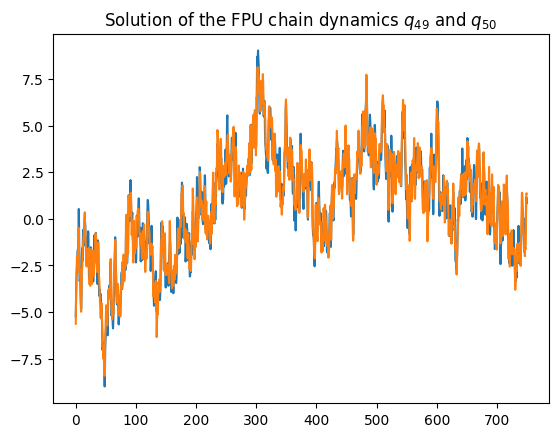

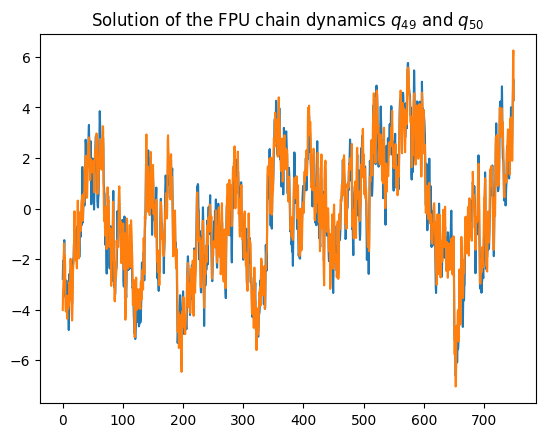

In [9]:
plt.figure(0)
plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,0])
plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,0])
plt.title(r"Solution of the FPU chain dynamics $q_{49}$ and $q_{50}$")

plt.figure(1)
plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,1])
plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,1])
plt.title(r"Solution of the FPU chain dynamics $q_{49}$ and $q_{50}$")

(400, 400) (400, 400) (400, 400)
(400, 400) (400, 400, 2)


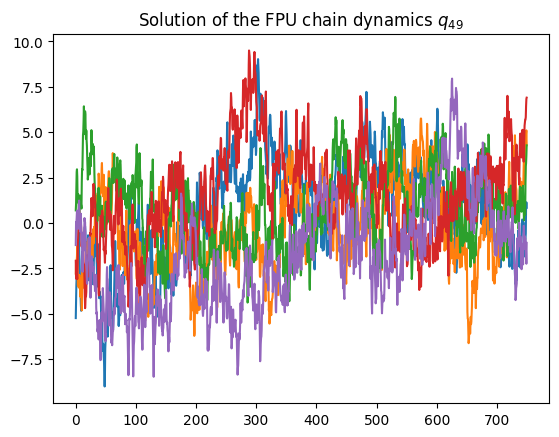

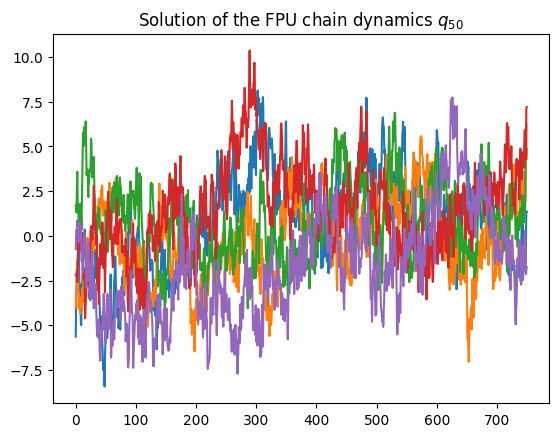

In [10]:
plt.figure(0)
for i in range(5):
    plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,i])
plt.title(r"Solution of the FPU chain dynamics $q_{49}$")

plt.figure(1)
for i in range(5):
    plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,i])
plt.title(r"Solution of the FPU chain dynamics $q_{50}$")

###########################################   Construct the sample traj for the LSTM learning 
ini=np.random.randn(sec_length,batch)
Traj49 = q49_store[0:sec_length,:]
Traj50 = q50_store[0:sec_length,:]
print(ini.shape, Traj49.shape, Traj50.shape)

Traj = np.empty((sec_length,batch,2))
Traj[:,:,0] = Traj49
Traj[:,:,1] = Traj50
T=np.arange(len(Traj[:,1]))*delta_t
x=np.linspace(-5,5,sec_length)
print(ini.shape, Traj.shape)

In [11]:
# Reformulating data into Torch tensors 
# Input of SINN should be of the form (seq_len, batch, input_size)

ini = np.random.randn(2*sec_length,2*batch).astype(np.float32) 
input = torch.from_numpy(ini.reshape(2*sec_length, batch, 2)).to(device)
batch_validation = batch
val_set = torch.normal(0.0, 1.0, (2*sec_length, batch_validation, 2), device=device)


Traj = Traj.astype(np.float32) 
target = torch.from_numpy(Traj.reshape(sec_length, batch, 2)).to(device)
print('The torch input size is', input.size(), input.dtype)
print('The torch validation size is', val_set.size(), val_set.dtype)
print('The torch target size is', target.size(), target.dtype)

The torch input size is torch.Size([800, 400, 2]) torch.float32
The torch validation size is torch.Size([800, 400, 2]) torch.float32
The torch target size is torch.Size([400, 400, 2]) torch.float32


In [12]:
# Defining Loss functions
LAGS = 400
N = 400
loss_acf_fft = make_loss('acf[fft]', target, lags=LAGS, device=device)
loss_acf_sec_moment = make_loss('acf[fft]', target**2, lags=LAGS, device=device)
loss_acf_bruteforce = make_loss('acf[bruteforce]', target, lags=LAGS, device=device)
loss_acf_randbrute = make_loss('acf[randombrute]', target, lags=LAGS, sample_lags=20, device=device)

loss_ccf_fft = make_loss('ccf[fft]', target, lags=LAGS, device=device)
loss_ccf_sec_moment = make_loss('ccf[fft]', target**2, lags=LAGS, device=device)
loss_ccf_bruteforce = make_loss('ccf[bruteforce]', target, lags=LAGS, device=device)
loss_ccf_randbrute = make_loss('ccf[randombrute]', target, lags=LAGS, sample_lags=20, device=device)

loss_pdf_empirical1 = make_loss('pdf', target, lower=-5, upper=5, n=N, bw=None, device=device)
loss_pdf_empirical2 = make_loss('pdf6', target, lower=-5, upper=5, n=N, bw=None, device=device)
loss_pdf_empirical2D = make_loss('pdf2D', target, lower=-5, upper=5, n=N, bw=None, device=device)

torch.Size([400, 2])


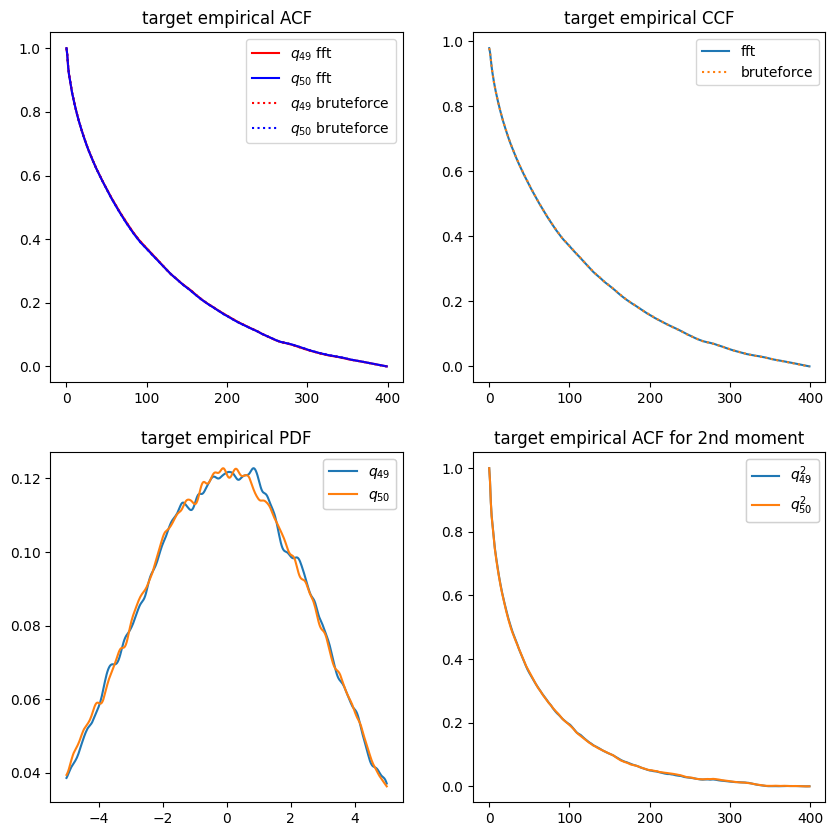

In [13]:
# Plotting target ACFs and PDF
fig, axs = plt.subplots(2, 2, figsize=(10, 10))
axs[0,0].plot(loss_acf_fft._target.cpu()[...,0],'r', label=r'$q_{49}$ fft')
axs[0,0].plot(loss_acf_fft._target.cpu()[...,1],'b', label=r'$q_{50}$ fft')
axs[0,0].plot(loss_acf_bruteforce._target.cpu()[...,0],'r:', label= r'$q_{49}$ bruteforce')
axs[0,0].plot(loss_acf_bruteforce._target.cpu()[...,1], 'b:', label=r'$q_{50}$ bruteforce')
axs[0,0].legend()
axs[0,0].set_title('target empirical ACF')

axs[0,1].plot(loss_ccf_fft._target.cpu()[...,1:3], label='fft')
axs[0,1].plot(loss_ccf_bruteforce._target.cpu()[...,1:3],':',label='bruteforce')
# legend2 = axs[0,1].legend(iter(bf), ('q bf', 'p bf'), loc=1)
# axs[0,1].add_artist(legend2)
axs[0,1].legend()
axs[0,1].set_title('target empirical CCF')

x_grid=-np.linspace(-5,5,num=sec_length)
pdf = axs[1,0].plot(x_grid,loss_pdf_empirical1._target.cpu())
legend3 = axs[1,0].legend(iter(pdf), (r'$q_{49}$',r'$q_{50}$'), loc=1)
axs[1,0].add_artist(legend3)
axs[1,0].set_title('target empirical PDF')


print(loss_acf_sec_moment._target.cpu().size())
sec_moment = axs[1,1].plot(loss_acf_sec_moment._target.cpu())
legend4 = axs[1,1].legend(iter(sec_moment), (r'$q_{49}^2$',r'$q_{50}^2$'),loc=1)
axs[1,1].set_title('target empirical ACF for 2nd moment')
axs[1,1].add_artist(legend4)

plt.show()

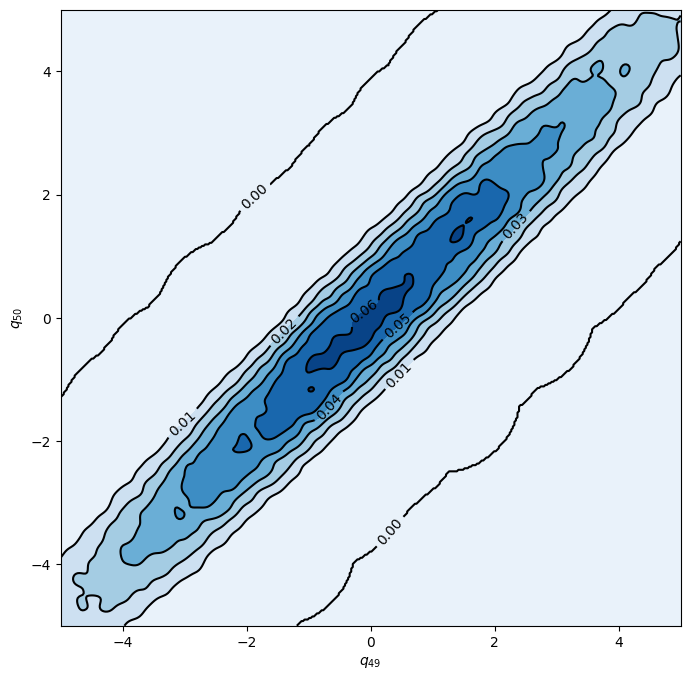

In [14]:
xmin, xmax = -5, 5
ymin, ymax = -5, 5

xx, yy = np.mgrid[xmin:xmax:400j, ymin:ymax:400j]
fig = plt.figure(figsize=(8, 8))
ax = fig.gca()
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

# Contourf plot
cfset = ax.contourf(xx, yy, loss_pdf_empirical2D._target.cpu(), cmap='Blues')
## Or kernel density estimate plot instead of the contourf plot

# Contour plot
cset = ax.contour(xx, yy, loss_pdf_empirical2D._target.cpu(), colors='k')
# Label plot
ax.clabel(cset, inline=1, fontsize=10)
ax.set_xlabel(r'$q_{49}$')
ax.set_ylabel(r'$q_{50}$')

plt.show()

Text(0.5, 1.0, 'target empirical PDF')

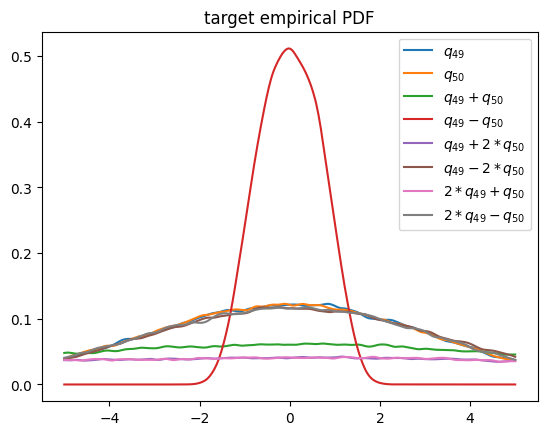

In [15]:
x_grid=-np.linspace(-5,5,num=sec_length)
plt.plot(x_grid, loss_pdf_empirical1._target.cpu()[...,0],label=r'$q_{49}$')
plt.plot(x_grid, loss_pdf_empirical1._target.cpu()[...,1],label=r'$q_{50}$')
plt.plot(x_grid, loss_pdf_empirical2._target.cpu()[...,0],label=r'$q_{49}+q_{50}$')
plt.plot(x_grid, loss_pdf_empirical2._target.cpu()[...,1],label=r'$q_{49}-q_{50}$')
plt.plot(x_grid, loss_pdf_empirical2._target.cpu()[...,2],label=r'$q_{49}+2*q_{50}$')
plt.plot(x_grid, loss_pdf_empirical2._target.cpu()[...,3],label=r'$q_{49}-2*q_{50}$')
plt.plot(x_grid, loss_pdf_empirical2._target.cpu()[...,4],label=r'$2*q_{49}+q_{50}$')
plt.plot(x_grid, loss_pdf_empirical2._target.cpu()[...,5],label=r'$2*q_{49}-q_{50}$')
plt.legend()
plt.title('target empirical PDF')

In [16]:
class Model:
    def __init__(self, net):

        self.x_acf_s = None
        self.x_ccf_s = None
        self.x_pdf_s = None
        self.x_pdf2_s = None
        self.x_acf2_s = None
        self.s_collect = []

        self.net = net

        self.T_error=[]
        self.V_error=[]
        self.T_ccf=[]
        self.V_ccf=[]
        self.T_pdf=[]
        self.V_pdf=[]
        self.T_pdf2=[]
        self.V_pdf2=[]
        self.T_acf=[]
        self.V_acf=[]
        self.T_acf2=[]
        self.V_acf2=[]
        self.Step=[]
        self.iter = 0
        self.time = 0

    def train_U(self, x):
        return self.net(x)

    def predict_U(self, x):
        return self.train_U(x)

    def likelihood_loss(self, loss_acf, loss_ccf, loss_pdf, loss_pdf2, loss_acf2):
        loss = torch.reciprocal(2. * self.x_acf_s ** 2) * loss_acf.detach()      \
               + torch.reciprocal(2. * self.x_ccf_s ** 2) * loss_ccf.detach()    \
               + torch.reciprocal(2. * self.x_pdf_s ** 2) * loss_pdf.detach()    \
               + torch.reciprocal(2. * self.x_pdf2_s ** 2) * loss_pdf2.detach()  \
               + torch.reciprocal(2. * self.x_acf2_s ** 2) * loss_acf2.detach()  \
               + torch.log(self.x_acf_s * self.x_ccf_s * self.x_pdf_s * self.x_pdf2_s * self.x_acf2_s)
        return loss

    def true_loss(self, loss_acf, loss_ccf, loss_pdf, loss_pdf2, loss_acf2):
        return torch.reciprocal(2. * self.x_acf_s.detach() ** 2) * loss_acf + torch.reciprocal(2. * self.x_ccf_s.detach() ** 2) * loss_ccf + torch.reciprocal(2. * self.x_pdf_s.detach() ** 2) * loss_pdf + torch.reciprocal(2. * self.x_pdf2_s.detach() ** 2) * loss_pdf2 + torch.reciprocal(2. * self.x_acf2_s.detach() ** 2) * loss_acf2


    def run_baseline(self):
        optimizer_adam = optim.Adam(self.net.parameters(), lr=1e-3)
        for step in range(20000):
            optimizer_adam.zero_grad()
            ini = np.random.randn(2*sec_length, batch*self.net.lstm.input_size).astype(np.float32) 
            input = torch.from_numpy(ini.reshape(2*sec_length, batch, self.net.lstm.input_size)).to(device)
            prediction, _ = self.train_U(input)
            prediction = prediction[-LAGS:,:,:]
            loss = self.true_loss(loss_acf_fft(prediction), loss_ccf_fft(prediction),loss_pdf_empirical1(prediction),loss_pdf_empirical2(prediction),loss_acf_sec_moment(prediction**2))
            loss.backward()
            optimizer_adam.step()
            self.iter += 1
            if step % 50 == 0: 
                with torch.no_grad():
                    loss = loss_acf_fft(prediction)+loss_ccf_fft(prediction)+loss_pdf_empirical1(prediction)+loss_pdf_empirical2(prediction)+loss_acf_sec_moment(prediction**2)
                    pred_val, _ = self.predict_U(val_set)
                    pred_val = pred_val[-LAGS:,:,:]
                    loss_val = loss_acf_bruteforce(pred_val)+loss_ccf_bruteforce(pred_val)+ loss_pdf_empirical1(pred_val)+ loss_pdf_empirical2(pred_val) + loss_acf_sec_moment(pred_val**2)
                    acf = loss_acf_bruteforce(pred_val)
                    ccf = loss_ccf_bruteforce(pred_val)
                    pdf = loss_pdf_empirical1(pred_val)
                    pdf2 = loss_pdf_empirical2(pred_val)
                    acf_sec_moment = loss_acf_sec_moment(pred_val**2)
                    print('[%d]-th step loss: %.4f, %.4f, acf: %.5f, ccf: %.5f, pdf: %.5f, pdf2: %.5f, acf2: %.5f' % (step, loss, loss_val, acf, ccf, pdf, pdf2, acf_sec_moment))
                    self.T_acf.append(loss_acf_fft(prediction).detach().cpu().numpy())
                    self.V_acf.append(loss_acf_bruteforce(pred_val).detach().cpu().numpy())
                    self.T_ccf.append(loss_ccf_fft(prediction).detach().cpu().numpy())
                    self.V_ccf.append(loss_ccf_bruteforce(pred_val).detach().cpu().numpy())
                    self.T_pdf.append(loss_pdf_empirical1(prediction).detach().cpu().numpy())
                    self.V_pdf.append(loss_pdf_empirical1(pred_val).detach().cpu().numpy())
                    self.T_pdf2.append(loss_pdf_empirical2(prediction).detach().cpu().numpy())
                    self.V_pdf2.append(loss_pdf_empirical2(pred_val).detach().cpu().numpy())
                    self.T_acf2.append(loss_acf_sec_moment(prediction**2).detach().cpu().numpy())
                    self.V_acf2.append(loss_acf_sec_moment(pred_val**2).detach().cpu().numpy())
                    self.T_error.append(loss.detach().cpu().numpy())
                    self.V_error.append(loss_val.detach().cpu().numpy())
                    self.Step.append(step)
            if loss <=0.0005 and loss_val <=0.0005:
                break

        if loss > 0.0005 or loss_val > 0.0005:
            print ('Training failed')
        print('Training finished')



    def run_AW(self):
        self.x_acf_s = nn.Parameter(self.x_acf_s, requires_grad=True)
        self.x_ccf_s = nn.Parameter(self.x_ccf_s, requires_grad=True)
        self.x_pdf_s = nn.Parameter(self.x_pdf_s, requires_grad=True)
        self.x_pdf2_s = nn.Parameter(self.x_pdf2_s, requires_grad=True)
        self.x_acf2_s = nn.Parameter(self.x_acf2_s, requires_grad=True)


        optimizer_adam = optim.Adam(self.net.parameters(), lr=1e-3)
        optimizer_adam_weight = optim.Adam([self.x_acf_s] + [self.x_ccf_s] + [self.x_pdf_s] + [self.x_pdf2_s] + [self.x_acf2_s],
                                                     lr=1e-3)

        for step in range(20000):
            self.s_collect.append([self.iter, self.x_acf_s.item(), self.x_ccf_s.item(), self.x_pdf_s.item(), self.x_pdf2_s.item(), self.x_acf2_s.item()])

            optimizer_adam.zero_grad()
            ini = np.random.randn(2*sec_length, batch*self.net.lstm.input_size).astype(np.float32) 
            input = torch.from_numpy(ini.reshape(2*sec_length, batch, self.net.lstm.input_size)).to(device)
            prediction, _ = self.train_U(input)
            prediction = prediction[-LAGS:,:,:]
            loss = self.true_loss(loss_acf_fft(prediction), loss_ccf_fft(prediction),loss_pdf_empirical1(prediction),loss_pdf_empirical2(prediction),loss_acf_sec_moment(prediction**2))
            loss.backward()
            optimizer_adam.step()
            self.iter += 1
            if step % 50 == 0: 
                with torch.no_grad():
                    loss = loss_acf_fft(prediction)+loss_ccf_fft(prediction)+loss_pdf_empirical1(prediction)+loss_pdf_empirical2(prediction)+loss_acf_sec_moment(prediction**2)
                    pred_val, _ = self.predict_U(val_set)
                    pred_val = pred_val[-LAGS:,:,:]
                    loss_val = loss_acf_bruteforce(pred_val)+loss_ccf_bruteforce(pred_val)+ loss_pdf_empirical1(pred_val) + loss_pdf_empirical2(pred_val) + loss_acf_sec_moment(pred_val**2)
                    acf = loss_acf_bruteforce(pred_val)
                    ccf = loss_ccf_bruteforce(pred_val)
                    pdf = loss_pdf_empirical1(pred_val)
                    pdf2 = loss_pdf_empirical2(pred_val)
                    acf_sec_moment = loss_acf_sec_moment(pred_val**2)
                    print('[%d]-th step loss: %.4f, %.4f, acf: %.5f, ccf: %.5f, pdf: %.5f, pdf2: %.5f, acf2: %.5f' % (step, loss, loss_val, acf, ccf, pdf, pdf2, acf_sec_moment))
                    self.T_acf.append(loss_acf_fft(prediction).detach().cpu().numpy())
                    self.V_acf.append(loss_acf_bruteforce(pred_val).detach().cpu().numpy())
                    self.T_ccf.append(loss_ccf_fft(prediction).detach().cpu().numpy())
                    self.V_ccf.append(loss_ccf_bruteforce(pred_val).detach().cpu().numpy())
                    self.T_pdf.append(loss_pdf_empirical1(prediction).detach().cpu().numpy())
                    self.V_pdf.append(loss_pdf_empirical1(pred_val).detach().cpu().numpy())
                    self.T_pdf2.append(loss_pdf_empirical2(prediction).detach().cpu().numpy())
                    self.V_pdf2.append(loss_pdf_empirical2(pred_val).detach().cpu().numpy())
                    self.T_acf2.append(loss_acf_sec_moment(prediction**2).detach().cpu().numpy())
                    self.V_acf2.append(loss_acf_sec_moment(pred_val**2).detach().cpu().numpy())
                    self.T_error.append(loss.detach().cpu().numpy())
                    self.V_error.append(loss_val.detach().cpu().numpy())
                    self.Step.append(step)
            if loss <=0.0005 and loss_val <=0.0005:
                break
            optimizer_adam_weight.zero_grad()
            loss = self.likelihood_loss(loss_acf_fft(prediction), loss_ccf_fft(prediction),loss_pdf_empirical1(prediction),loss_pdf_empirical2(prediction),loss_acf_sec_moment(prediction**2))
            loss.backward()
            optimizer_adam_weight.step()
            
        if loss > 0.0005 or loss_val > 0.0005:
            print ('Training failed')
        print('Training finished')


    def train(self):
        self.x_acf_s = torch.tensor(2.).float()
        self.x_ccf_s = torch.tensor(2.).float()
        self.x_pdf_s = torch.tensor(0.2).float()
        self.x_pdf2_s = torch.tensor(0.2).float()
        self.x_acf2_s = torch.tensor(0.2).float()
        start_time = time.time()
        if model_type == 0:
            self.run_baseline()
        elif model_type == 1:
            self.run_AW()
        elapsed = time.time() - start_time
        self.time = elapsed
        print('Training time: %.2f' % elapsed)
        avg_time = elapsed/self.iter
        print('Training time per iteration: %.2f' % avg_time)
        print('Number of Iterations:%d' %self.iter)

In [17]:
### Defining SINN model
net = SINN(2, 50, 2, 2).to(device) # input dimension, hidden size, number of layers, output dimension

In [18]:
model = Model(net=net)

In [19]:
model_type = 1

In [20]:
model.train()

[0]-th step loss: 0.8352, 0.8317, acf: 0.10070, ccf: 0.10768, pdf: 0.29245, pdf2: 0.28711, acf2: 0.04382
[50]-th step loss: 0.3053, 0.2909, acf: 0.06593, ccf: 0.07141, pdf: 0.08667, pdf2: 0.04364, acf2: 0.02324
[100]-th step loss: 0.0672, 0.0565, acf: 0.01999, ccf: 0.02285, pdf: 0.00869, pdf2: 0.00335, acf2: 0.00159
[150]-th step loss: 0.1732, 0.1519, acf: 0.06123, ccf: 0.06523, pdf: 0.00671, pdf2: 0.00287, acf2: 0.01587
[200]-th step loss: 0.0580, 0.0498, acf: 0.01795, ccf: 0.01962, pdf: 0.00792, pdf2: 0.00299, acf2: 0.00130
[250]-th step loss: 0.0335, 0.0300, acf: 0.01015, ccf: 0.01064, pdf: 0.00701, pdf2: 0.00172, acf2: 0.00043
[300]-th step loss: 0.0286, 0.0284, acf: 0.01028, ccf: 0.01068, pdf: 0.00599, pdf2: 0.00126, acf2: 0.00021
[350]-th step loss: 0.0386, 0.0371, acf: 0.01594, ccf: 0.01594, pdf: 0.00393, pdf2: 0.00098, acf2: 0.00035
[400]-th step loss: 0.0615, 0.0708, acf: 0.03318, ccf: 0.03317, pdf: 0.00132, pdf2: 0.00056, acf2: 0.00261
[450]-th step loss: 0.0460, 0.0526, acf:

[3850]-th step loss: 0.0494, 0.0441, acf: 0.01476, ccf: 0.01475, pdf: 0.00829, pdf2: 0.00627, acf2: 0.00003
[3900]-th step loss: 0.0421, 0.0415, acf: 0.01300, ccf: 0.01299, pdf: 0.00829, pdf2: 0.00715, acf2: 0.00009
[3950]-th step loss: 0.0473, 0.0498, acf: 0.01745, ccf: 0.01740, pdf: 0.00829, pdf2: 0.00652, acf2: 0.00015
[4000]-th step loss: 0.0392, 0.0430, acf: 0.01460, ccf: 0.01459, pdf: 0.00829, pdf2: 0.00552, acf2: 0.00003
[4050]-th step loss: 0.0385, 0.0399, acf: 0.01028, ccf: 0.01035, pdf: 0.00829, pdf2: 0.00950, acf2: 0.00146
[4100]-th step loss: 0.0313, 0.0368, acf: 0.01133, ccf: 0.01141, pdf: 0.00829, pdf2: 0.00527, acf2: 0.00046
[4150]-th step loss: 0.0406, 0.0367, acf: 0.01154, ccf: 0.01160, pdf: 0.00829, pdf2: 0.00501, acf2: 0.00023
[4200]-th step loss: 0.0322, 0.0416, acf: 0.01426, ccf: 0.01428, pdf: 0.00829, pdf2: 0.00476, acf2: 0.00002
[4250]-th step loss: 0.0336, 0.0418, acf: 0.01444, ccf: 0.01445, pdf: 0.00829, pdf2: 0.00458, acf2: 0.00002
[4300]-th step loss: 0.0432,

[7650]-th step loss: 0.0396, 0.0423, acf: 0.01504, ccf: 0.01510, pdf: 0.00829, pdf2: 0.00383, acf2: 0.00002
[7700]-th step loss: 0.0415, 0.0413, acf: 0.01449, ccf: 0.01456, pdf: 0.00829, pdf2: 0.00396, acf2: 0.00001
[7750]-th step loss: 0.0410, 0.0443, acf: 0.01610, ccf: 0.01614, pdf: 0.00829, pdf2: 0.00377, acf2: 0.00005
[7800]-th step loss: 0.0439, 0.0449, acf: 0.01631, ccf: 0.01638, pdf: 0.00829, pdf2: 0.00387, acf2: 0.00006
[7850]-th step loss: 0.0330, 0.0360, acf: 0.01161, ccf: 0.01166, pdf: 0.00829, pdf2: 0.00424, acf2: 0.00024
[7900]-th step loss: 0.0382, 0.0389, acf: 0.01336, ccf: 0.01341, pdf: 0.00829, pdf2: 0.00384, acf2: 0.00004
[7950]-th step loss: 0.0494, 0.0485, acf: 0.01814, ccf: 0.01818, pdf: 0.00829, pdf2: 0.00373, acf2: 0.00021
[8000]-th step loss: 0.0375, 0.0408, acf: 0.01438, ccf: 0.01442, pdf: 0.00829, pdf2: 0.00372, acf2: 0.00003
[8050]-th step loss: 0.0354, 0.0378, acf: 0.01261, ccf: 0.01267, pdf: 0.00829, pdf2: 0.00414, acf2: 0.00009
[8100]-th step loss: 0.0354,

[11450]-th step loss: 0.0279, 0.0280, acf: 0.00782, ccf: 0.00778, pdf: 0.00828, pdf2: 0.00385, acf2: 0.00023
[11500]-th step loss: 0.0306, 0.0345, acf: 0.01123, ccf: 0.01119, pdf: 0.00829, pdf2: 0.00373, acf2: 0.00003
[11550]-th step loss: 0.0382, 0.0415, acf: 0.01461, ccf: 0.01457, pdf: 0.00827, pdf2: 0.00376, acf2: 0.00031
[11600]-th step loss: 0.0300, 0.0341, acf: 0.01091, ccf: 0.01087, pdf: 0.00848, pdf2: 0.00375, acf2: 0.00005
[11650]-th step loss: 0.0292, 0.0319, acf: 0.00997, ccf: 0.00993, pdf: 0.00828, pdf2: 0.00365, acf2: 0.00003
[11700]-th step loss: 0.0272, 0.0295, acf: 0.00865, ccf: 0.00862, pdf: 0.00829, pdf2: 0.00378, acf2: 0.00016
[11750]-th step loss: 0.0348, 0.0292, acf: 0.00850, ccf: 0.00846, pdf: 0.00852, pdf2: 0.00370, acf2: 0.00004
[11800]-th step loss: 0.0354, 0.0267, acf: 0.00708, ccf: 0.00704, pdf: 0.00844, pdf2: 0.00396, acf2: 0.00019
[11850]-th step loss: 0.0336, 0.0357, acf: 0.01182, ccf: 0.01176, pdf: 0.00829, pdf2: 0.00369, acf2: 0.00013
[11900]-th step los

[15250]-th step loss: 0.0169, 0.0230, acf: 0.00269, ccf: 0.00268, pdf: 0.00843, pdf2: 0.00404, acf2: 0.00516
[15300]-th step loss: 0.0130, 0.0129, acf: 0.00015, ccf: 0.00015, pdf: 0.00822, pdf2: 0.00354, acf2: 0.00086
[15350]-th step loss: 0.0134, 0.0131, acf: 0.00005, ccf: 0.00005, pdf: 0.00819, pdf2: 0.00353, acf2: 0.00124
[15400]-th step loss: 0.0133, 0.0126, acf: 0.00013, ccf: 0.00012, pdf: 0.00829, pdf2: 0.00347, acf2: 0.00061
[15450]-th step loss: 0.0131, 0.0139, acf: 0.00026, ccf: 0.00025, pdf: 0.00855, pdf2: 0.00388, acf2: 0.00096
[15500]-th step loss: 0.0213, 0.0152, acf: 0.00058, ccf: 0.00054, pdf: 0.00908, pdf2: 0.00425, acf2: 0.00076
[15550]-th step loss: 0.0132, 0.0139, acf: 0.00035, ccf: 0.00034, pdf: 0.00870, pdf2: 0.00362, acf2: 0.00093
[15600]-th step loss: 0.0138, 0.0171, acf: 0.00112, ccf: 0.00113, pdf: 0.00826, pdf2: 0.00358, acf2: 0.00301
[15650]-th step loss: 0.0138, 0.0137, acf: 0.00032, ccf: 0.00033, pdf: 0.00829, pdf2: 0.00358, acf2: 0.00118
[15700]-th step los

[19050]-th step loss: 0.0490, 0.0600, acf: 0.00406, ccf: 0.00410, pdf: 0.00817, pdf2: 0.00447, acf2: 0.03924
[19100]-th step loss: 0.0399, 0.0660, acf: 0.00417, ccf: 0.00420, pdf: 0.00826, pdf2: 0.00391, acf2: 0.04546
[19150]-th step loss: 0.0338, 0.0330, acf: 0.00562, ccf: 0.00560, pdf: 0.00821, pdf2: 0.00353, acf2: 0.01008
[19200]-th step loss: 0.0317, 0.0322, acf: 0.00156, ccf: 0.00157, pdf: 0.00820, pdf2: 0.00351, acf2: 0.01733
[19250]-th step loss: 0.0503, 0.0436, acf: 0.00189, ccf: 0.00192, pdf: 0.00820, pdf2: 0.00352, acf2: 0.02812
[19300]-th step loss: 0.0407, 0.0313, acf: 0.00292, ccf: 0.00292, pdf: 0.00816, pdf2: 0.00348, acf2: 0.01382
[19350]-th step loss: 0.2278, 0.2623, acf: 0.05910, ccf: 0.05852, pdf: 0.00819, pdf2: 0.00547, acf2: 0.13105
[19400]-th step loss: 0.2770, 0.2640, acf: 0.07560, ccf: 0.07457, pdf: 0.00824, pdf2: 0.00445, acf2: 0.10116
[19450]-th step loss: 0.1224, 0.1205, acf: 0.04148, ccf: 0.04008, pdf: 0.00710, pdf2: 0.00626, acf2: 0.02561
[19500]-th step los

In [21]:
def draw_loss(model):
    ### Plotting the training and the generalization error
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Error plot",fontsize=15) 
    plt.yscale('log')
    plt.plot(model.Step, model.T_error,'r',label='Training error')
    plt.plot(model.Step, model.V_error,'b--',label='Validation error')
#     plt.loglog(model.Step, model.T_error,'r',label='Training error')
#     plt.loglog(model.Step, model.V_error,'b--',label='Validation error')
    plt.xlabel(r'Training times $n$',fontsize=15)
    plt.ylabel(r'$l_1+l_2$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)

In [22]:
def draw_errors(model):
    ### Plotting the training and the generalization error
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Error plot for loss functions w/o coeff",fontsize=15)
    plt.yscale('log')
    plt.plot(model.Step, model.T_error,'k',label='Training error')
    plt.plot(model.Step, model.V_error,'k--')
    plt.plot(model.Step, model.T_acf,'r',label='acf error')
    plt.plot(model.Step, model.V_acf,'r--')
    plt.plot(model.Step, model.T_ccf,'b',label='ccf error')
    plt.plot(model.Step, model.V_ccf,'b--')
    plt.plot(model.Step, model.T_pdf,'y',label='pdf error')
    plt.plot(model.Step, model.V_pdf,'y--')
    plt.plot(model.Step, model.T_pdf2,'m',label='pdf2 error')
    plt.plot(model.Step, model.V_pdf2,'m--')
    plt.plot(model.Step, model.T_acf2,'g',label='acf2 error')
    plt.plot(model.Step, model.V_acf2,'g--')
    
#     plt.loglog(model.Step, model.T_error,'k',label='Training error')
#     plt.loglog(model.Step, model.V_error,'k--')
#     plt.loglog(model.Step, model.T_acf,'r',label='acf error')
#     plt.loglog(model.Step, model.V_acf,'r--')
#     plt.loglog(model.Step, model.T_ccf,'b',label='ccf error')
#     plt.loglog(model.Step, model.V_ccf,'b--')
#     plt.loglog(model.Step, model.T_pdf,'y',label='pdf error')
#     plt.loglog(model.Step, model.V_pdf,'y--')
#     plt.loglog(model.Step, model.T_pdf2,'m',label='pdf2 error')
#     plt.loglog(model.Step, model.V_pdf2,'m--')
#     plt.loglog(model.Step, model.T_acf2,'g',label='acf2 error')
#     plt.loglog(model.Step, model.V_acf2,'g--')
    plt.xlabel(r'Training times $n$',fontsize=15)
    plt.ylabel(r'$l_1+l_2$',fontsize=15)
    plt.legend(frameon=False,fontsize=15, bbox_to_anchor=(1.1, 1.05))

In [23]:
def draw_adaptive_w(model):
    s_collect = np.array(model.s_collect)
    np.savetxt('s_RAM-AW.npy', s_collect)
#     plt.yscale('log')
    plt.plot(s_collect[:, 0], s_collect[:, 1], 'r-', label=r'$\epsilon_{acf}$')
    plt.plot(s_collect[:, 0], s_collect[:, 2], 'b-', label='$\epsilon_{ccf}$')
    plt.plot(s_collect[:, 0], s_collect[:, 3], 'y-', label='$\epsilon_{pdf}$')
    plt.plot(s_collect[:, 0], s_collect[:, 4], 'm-', label='$\epsilon_{pdf2}$')
    plt.plot(s_collect[:, 0], s_collect[:, 5], 'g-', label='$\epsilon_{acf2}$')
    plt.xlabel('$Iters$')
    plt.ylabel('$s$')
#     plt.xscale('log')
    plt.legend()
#     plt.savefig('2dpossion_S_RAM-AW.pdf')
    plt.show()

In [24]:
def draw_epoch_w(model):
    s_collect = np.array(model.s_collect)
    np.savetxt('s_RAM-AW.npy', s_collect)
    plt.yscale('log')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 1]**2), 'r-', label=r'$\frac{1}{2\epsilon_{acf}^2}$')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 2]**2), 'b-', label=r'$\frac{1}{2\epsilon_{ccf}^2}$')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 3]**2), 'y-', label=r'$\frac{1}{2\epsilon_{pdf}^2}$')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 4]**2), 'm-', label=r'$\frac{1}{2\epsilon_{pdf2}^2}$')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 5]**2), 'g-', label=r'$\frac{1}{2\epsilon_{acf2}^2}$')
    plt.xlabel('$Iters$')
    plt.ylabel('$\omega$')
    plt.legend()
#     plt.savefig('2dpossion_S_RAM-AW.pdf')
    plt.show()

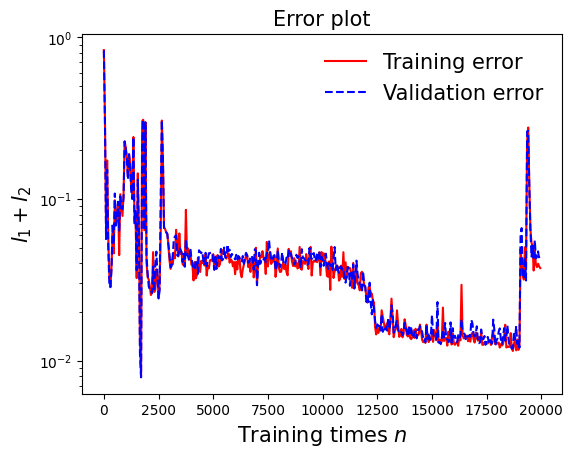

In [25]:
draw_loss(model)

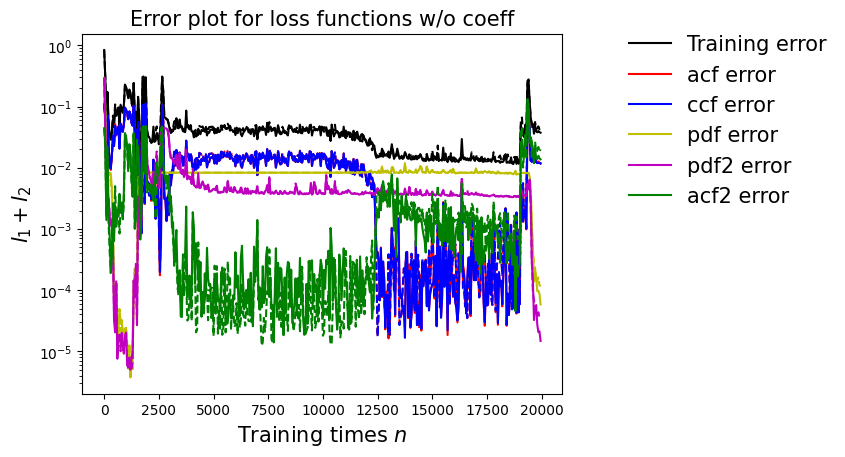

In [26]:
draw_errors(model)

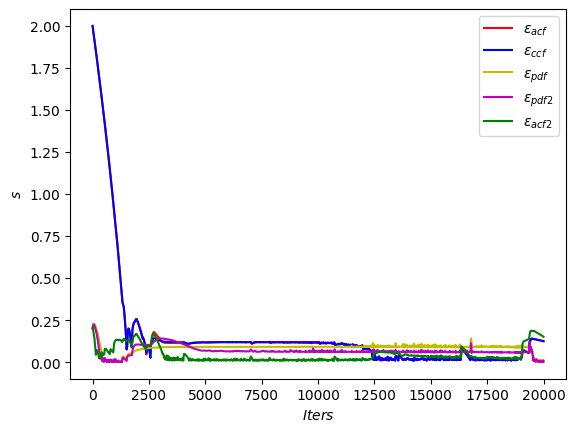

In [27]:
draw_adaptive_w(model)

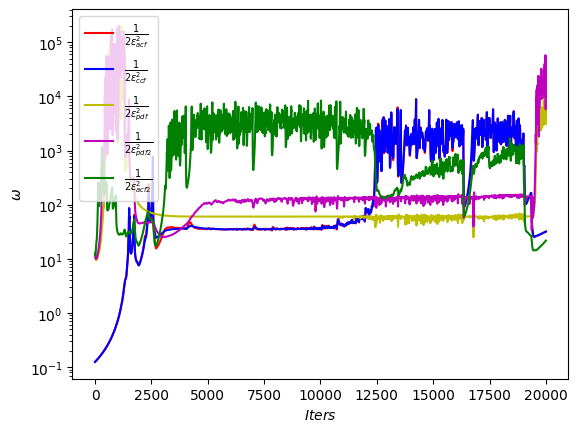

In [28]:
draw_epoch_w(model)

## Test 1: plot the sample path generated by SINN and the exact sample path 

In [29]:
def test1(model):
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    prediction=Pred[-sec_length:,:,:].detach().cpu().numpy().reshape(sec_length, batch, 2)
    # Test 1: plot the sample path generated by SINN and the exact sample path 
    skip = 0

    fig = plt.figure(0)
    plt.title("MD trajectories",fontsize=15) 
    plt.plot(T[skip:]-T[skip], Traj[skip:, 0])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$\tilde{q}_1(t)$ and $\tilde{q}_2(t)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15) 


    fig = plt.figure(1)
    plt.title("SINN trajectories",fontsize=15)    
    plt.plot(T[skip:]-T[skip], prediction[skip:, 0])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_1(t)$ and $q_2(t)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

## Test 2: plot the CCF of the sample path generated by the SINN and the exact CCF

In [30]:
def test2(model):
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    
    # Test 2: plot the CCF of the sample path generated by the SINN and the exact CCF  
    acf_p=StatLoss.acf(Pred[-sec_length:,:,:])
    acf_t=StatLoss.acf(target)
    corr_p1=acf_p.detach().cpu().numpy()
    corr_t1=acf_t.detach().cpu().numpy()
    ccf_p=StatLoss.ccf(Pred[-sec_length:,:,:])
    ccf_t=StatLoss.ccf(target)
    corr_p2=ccf_p.detach().cpu().numpy()
    corr_t2=ccf_t.detach().cpu().numpy()
    
    fig = plt.figure(0)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized ACF of $\tilde{q}_1$',fontsize=15)    
    plt.plot(T, corr_t1[...,0],'r',label='Exact')        # correlation function of the target 
    plt.plot(T, corr_p1[...,0], 'b--',label='SINN')        # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
#     plt.xlim(0,T[-1])
    plt.yticks([-0.2,0,0.2,0.4,0.6,0.8,1.0],fontsize=15)
    plt.legend()
    
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized ACF of $\tilde{q}_2$',fontsize=15)          
    plt.plot(T, corr_t1[...,-1],'r',label='Exact')        # correlation function of the target 
    plt.plot(T, corr_p1[...,-1], 'b--',label='SINN')     # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
#     plt.xlim(0,T[-1])
    plt.yticks([-0.2,0,0.2,0.4,0.6,0.8,1.0],fontsize=15)
    plt.legend()
    
    fig = plt.figure(2)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized CCF',fontsize=15)    
    plt.plot(T, corr_t2[:,:],'r')        # correlation function of the target 
    plt.plot(T, corr_p2[:,:], 'b--')        # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
#     plt.ylim(-0.05,0.05)

## Test 3: plot the PDF of the sample path generated by SINN and the exact PDF  

In [31]:
def test3(model):
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    
    # Test 3: plot the PDF of the sample path generated by SINN and the exact PDF  
    rho_data =  StatLoss.gauss_kde(target, -5, 5, 400, None).cpu()
    rho_input = StatLoss.gauss_kde(ran_input, -5, 5, 400, None).cpu()
    rho_prediction = StatLoss.gauss_kde(Pred[-sec_length:,:,:].detach(), -5, 5, 400,None).cpu()
    
    rho_data2 =  StatLoss.gauss_kde6(target, -5, 5, 400, None).cpu()
    rho_prediction2 = StatLoss.gauss_kde6(Pred[-sec_length:,:,:].detach(), -5, 5, 400,None).cpu()


    x=np.linspace(-5, 5, 400)
    fig = plt.figure(0)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r"Equilibrium probability density function",fontsize=15)    
    plt.plot(x, rho_data.numpy()[...,0],label=r'Exact PDF of $q_{49}$')    # target PDF
    plt.plot(x, rho_data.numpy()[...,1],label=r'Exact PDF of $q_{50}$')    # target PDF
    plt.plot(x, rho_input.numpy(), 'b--', label=r'PDF of the input')     # PDF of the input
    plt.plot(x, rho_prediction.numpy()[...,0], ':',label=r'PDF of the output $q_{49}$')  # PDF after the training 
    plt.plot(x, rho_prediction.numpy()[...,1], ':',label=r'PDF of the output $q_{50}$')  # PDF after the training 
    plt.xlim(-5,5)
    plt.ylim(0,0.6)
    plt.xlabel(r'$x$',fontsize=15)
    plt.ylabel(r'$\rho(x)$',fontsize=15)
    plt.legend(frameon=False,fontsize=10)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    
    
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r"Equilibrium probability density function of sum and diff",fontsize=15)    
    plt.plot(x, rho_data2.numpy()[...,0],label=r'Exact PDF of $q_{49}+q_{50}$')    # target PDF
    plt.plot(x, rho_data2.numpy()[...,1],label=r'Exact PDF of $q_{49}-q_{50}$')    # target PDF
    plt.plot(x, rho_input.numpy(), 'b--', label=r'PDF of the input')     # PDF of the input
    plt.plot(x, rho_prediction2.numpy()[...,0], ':',label=r'PDF of the output $q_{49}+q_{50}$')  # PDF after the training 
    plt.plot(x, rho_prediction2.numpy()[...,1], ':',label=r'PDF of the output $q_{49}-q_{50}$')  # PDF after the training 
    plt.xlim(-5,5)
    plt.ylim(0,0.6)
    plt.xlabel(r'$x$',fontsize=15)
    plt.ylabel(r'$\rho(x)$',fontsize=15)
    plt.legend(frameon=False,fontsize=10)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    
    fig = plt.figure(2)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r"Equilibrium probability density function of sum and diff",fontsize=15)    
    plt.plot(x, rho_data2.numpy()[...,2],label=r'Exact PDF of $q_{49}+2q_{50}$')    # target PDF
    plt.plot(x, rho_data2.numpy()[...,3],label=r'Exact PDF of $q_{49}-2q_{50}$')    # target PDF
    plt.plot(x, rho_input.numpy(), 'b--', label=r'PDF of the input')     # PDF of the input
    plt.plot(x, rho_prediction2.numpy()[...,2], ':',label=r'PDF of the output $q_{49}+2\tilde{q}_2$')  # PDF after the training 
    plt.plot(x, rho_prediction2.numpy()[...,3], ':',label=r'PDF of the output $q_{49}-2\tilde{q}_2$')  # PDF after the training 
    plt.xlim(-5,5)
    plt.ylim(0,0.6)
    plt.xlabel(r'$x$',fontsize=15)
    plt.ylabel(r'$\rho(x)$',fontsize=15)
    plt.legend(frameon=False,fontsize=10)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    
    fig = plt.figure(3)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r"Equilibrium probability density function of sum and diff",fontsize=15)    
    plt.plot(x, rho_data2.numpy()[...,4],label=r'Exact PDF of $2q_{49}+\tilde{q}_2$')    # target PDF
    plt.plot(x, rho_data2.numpy()[...,5],label=r'Exact PDF of $2q_{49}-\tilde{q}_2$')    # target PDF
    plt.plot(x, rho_input.numpy(), 'b--', label=r'PDF of the input')     # PDF of the input
    plt.plot(x, rho_prediction2.numpy()[...,4], ':',label=r'PDF of the output $2q_{49}+\tilde{q}_2$')  # PDF after the training 
    plt.plot(x, rho_prediction2.numpy()[...,5], ':',label=r'PDF of the output $2q_{49}-\tilde{q}_2$')  # PDF after the training 
    plt.xlim(-5,5)
    plt.ylim(0,0.6)
    plt.xlabel(r'$x$',fontsize=15)
    plt.ylabel(r'$\rho(x)$',fontsize=15)
    plt.legend(frameon=False,fontsize=10)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

## Test 4: Comparing the higher-order ACF

In [32]:
def test4(model):
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    prediction=Pred[-sec_length:,:,:].detach().cpu().numpy().reshape(sec_length, batch, 2)
    
    # Test 4: Comparing the higher-order ACF
    acf2=StatLoss.acf(target**2)
    pred_norm=torch.from_numpy((prediction).reshape(sec_length, batch,2))
    acf2_app=StatLoss.acf(pred_norm**2)

    
    fig = plt.figure(0)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized ACF of $q_{49}^2$',fontsize=15)    
    plt.plot(T, acf2.detach().cpu().numpy()[...,0],'r',label='Exact')        # correlation function of the target 
    plt.plot(T, acf2_app.detach().cpu().numpy()[...,0], 'b--',label='SINN')        # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.xlim(0,T[-1])
    plt.yticks([-0.2,0,0.2,0.4,0.6,0.8,1.0],fontsize=15)
    plt.legend()
    
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized ACF of $q_{50}^2$',fontsize=15)          
    plt.plot(T, acf2.detach().cpu().numpy()[...,1],'r',label='Exact')        # correlation function of the target 
    plt.plot(T, acf2_app.detach().cpu().numpy()[...,1], 'b--',label='SINN')     # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.xlim(0,T[-1])
    plt.yticks([-0.2,0,0.2,0.4,0.6,0.8,1.0],fontsize=15)
    plt.legend()    

## Test 5: plot the expolation result, i.e. Prediction of the FPU-Langevin dynamics for longer time 

In [33]:
def test5(model):
    # Test 5: plot the expolation result, i.e. Prediction of the FPU-Langevin dynamics for longer time 
    [a,b,c]=input.size()
    skip=20
    scale=10
    burnin=3
    fold=800
    batch_new=50
    ran_input=torch.randn(((scale-burnin)*a,batch_new,c),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred_L, _= model.predict_U(ran_input)
    prediction_ext=Pred_L.detach().cpu().numpy().reshape((scale-burnin)*a, batch_new,2)
    ccf_p=StatLoss.ccf(Pred_L,method='bruteforce')

    LT=np.linspace(0,(scale-burnin)*a*delta_t,num=(scale-burnin)*a+1)
    LT=LT[0:-1]


    fig = plt.figure(0)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Short-time trajectories",fontsize=15)
    plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,0],label='MD simulation')
    plt.plot(LT[skip:]-LT[skip], prediction_ext[skip:, 0, 0],'--',label='SINN simulation')
    plt.xlim([0,80])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_{49}(t)$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)
    plt.yticks([-2,-1,0,1,2],fontsize=15)
    plt.xticks(fontsize=15)



    fig = plt.figure(figsize=(16, 4))
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Long-time trajectories",fontsize=15)
    plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,0],label='MD simulation')
    plt.plot(LT[skip:]-LT[skip], prediction_ext[skip:, 0, 0],'--',label='SINN simulation')
    plt.xlim([0,500])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_{49}(t)$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)
    plt.yticks([-2,-1,0,1,2],fontsize=15)
    plt.xticks(fontsize=15)

    fig = plt.figure(2)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Short-time trajectories",fontsize=15)
    plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,0],label='MD simulation')
    plt.plot(LT[skip:]-LT[skip], prediction_ext[skip:, 0, 1],'--',label='SINN simulation')
    plt.xlim([0,80])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_{50}(t)$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)
    plt.yticks([-2,-1,0,1,2],fontsize=15)
    plt.xticks(fontsize=15)



    fig = plt.figure(figsize=(16, 4))
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Long-time trajectories",fontsize=15)
    plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,0],label='MD simulation')
    plt.plot(LT[skip:]-LT[skip], prediction_ext[skip:, 0, 1],'--',label='SINN simulation')
    plt.xlim([0,500])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_{50}(t)$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)
    plt.yticks([-2,-1,0,1,2],fontsize=15)
    plt.xticks(fontsize=15)

## Test 6: comparing scatter plots

In [34]:
def test6(model):
    # Test 6: scatter plot of SINN
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    prediction=Pred[-sec_length:,:,:].detach().cpu().numpy().reshape(sec_length, batch, 2)
    
    fig = plt.figure(0)
    plt.title("MD trajectories",fontsize=15) 
    plt.scatter(Traj[:,:,0], Traj[:,:,1])
    plt.xlabel(r'$q_{49}(t)$',fontsize=15)
    plt.ylabel(r'$q_{50}(t)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15) 


    fig = plt.figure(1)
    plt.title("SINN trajectories",fontsize=15)    
    plt.scatter(prediction[:,:,0],prediction[:,:,1])
    plt.xlabel(r'$q_{49}(t)$',fontsize=15)
    plt.ylabel(r'$q_{50}(t)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

## Test 7: comparing joint PDF contours

In [35]:
def test7(model):
    # Test 5: scatter plot of SINN
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    prediction=Pred[-sec_length:,:,:].detach().cpu().numpy().reshape(sec_length, batch, 2)
    
    rho_data =  StatLoss.gauss_kde2D(target, -5, 5, 400, None).cpu()
    rho_prediction = StatLoss.gauss_kde2D(Pred[-sec_length:,:,:].detach(), -5, 5, 400,None).cpu()
    
    fig = plt.figure(0, figsize=(5, 5))
    plt.title("PDF Contours",fontsize=15) 
    xmin, xmax = -5, 5
    ymin, ymax = -5, 5

    xx, yy = np.mgrid[xmin:xmax:400j, ymin:ymax:400j]
    axs[0]  = fig.gca()
    plt.xlim(xmin, xmax)
    plt.ylim(ymin, ymax)
    
    plt.contour(xx,yy,rho_data.numpy(),colors='r')
    plt.contour(xx,yy,rho_prediction.numpy(),colors='b',linestyles='dashed')

    plt.xlabel(r'$q_{49}$')
    plt.ylabel(r'$q_{50}$')

    
    
    fig = plt.figure(1,figsize=(5, 5))
    plt.title("MD trajectories",fontsize=15) 
    xmin, xmax = -5, 5
    ymin, ymax = -5, 5

#     xx, yy = np.mgrid[xmin:xmax:20j, ymin:ymax:20j]
    ax  = fig.gca()
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    cfset = ax.contourf(xx, yy, rho_data.numpy(), cmap='Blues')
    cset = ax.contour(xx, yy, rho_data.numpy(), colors='k')

    ax.clabel(cset, inline=1, fontsize=10)
    ax.set_xlabel(r'$q_{49}$')
    ax.set_ylabel(r'$q_{50}$')

    
    
    fig = plt.figure(2,figsize=(5, 5))
    plt.title("SINN output",fontsize=15) 
    xmin, xmax = -5, 5
    ymin, ymax = -5, 5

#     xx, yy = np.mgrid[xmin:xmax:20j, ymin:ymax:20j]
    ax  = fig.gca()
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    cfset = ax.contourf(xx, yy, rho_prediction.numpy(), cmap='Blues')
    cset = ax.contour(xx, yy, rho_prediction.numpy(), colors='k')

    ax.clabel(cset, inline=1, fontsize=10)
    ax.set_xlabel(r'$q_{49}$')
    ax.set_ylabel(r'$q_{50}$')

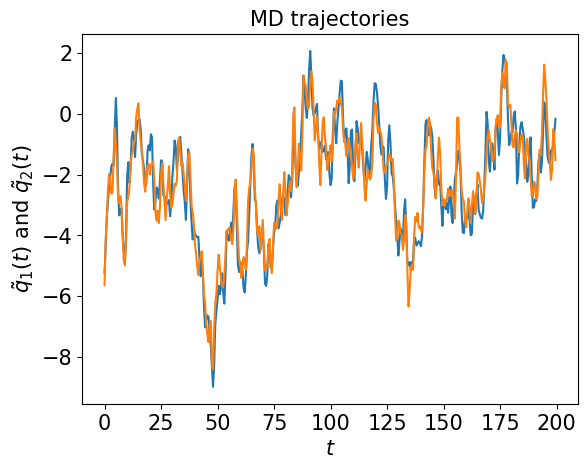

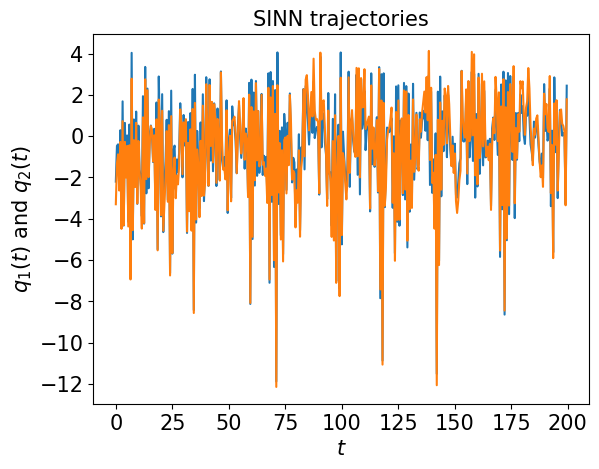

In [36]:
test1(model)

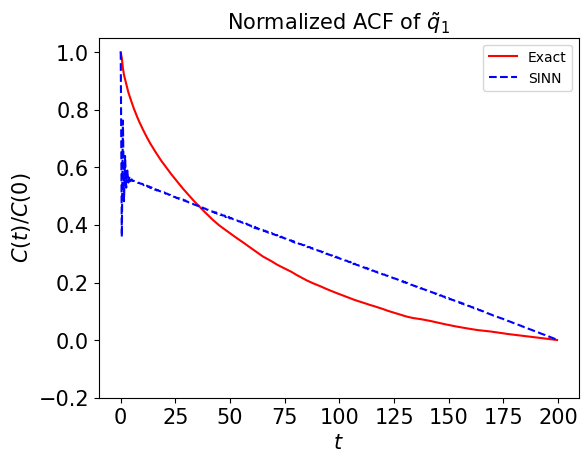

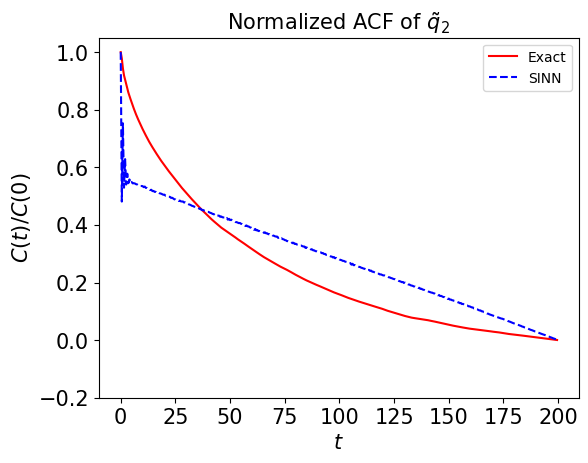

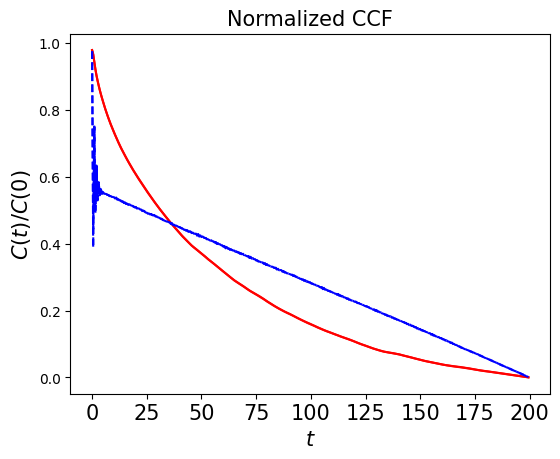

In [37]:
test2(model)

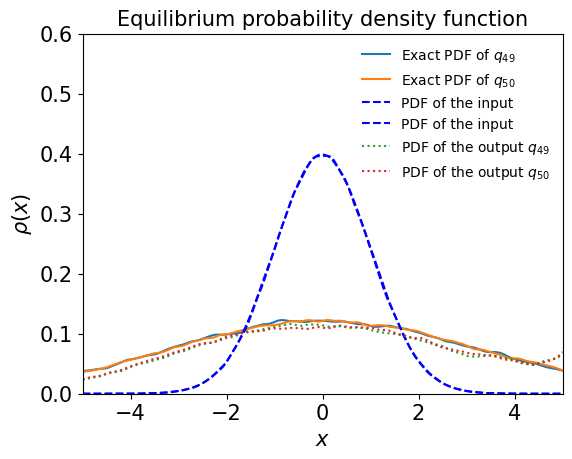

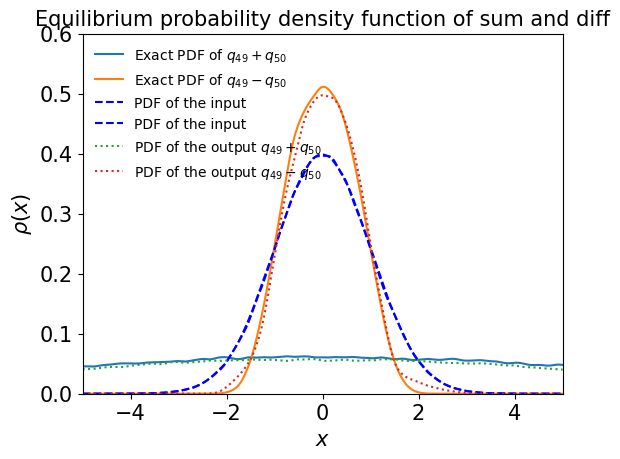

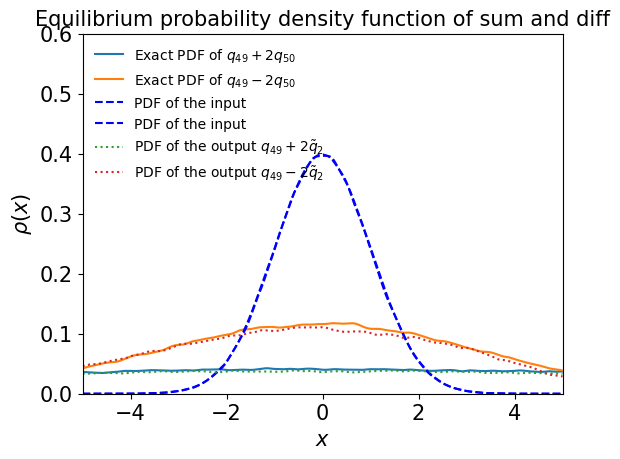

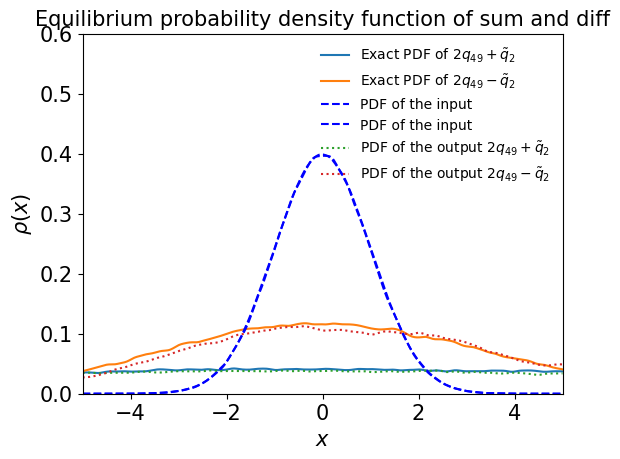

In [38]:
test3(model)

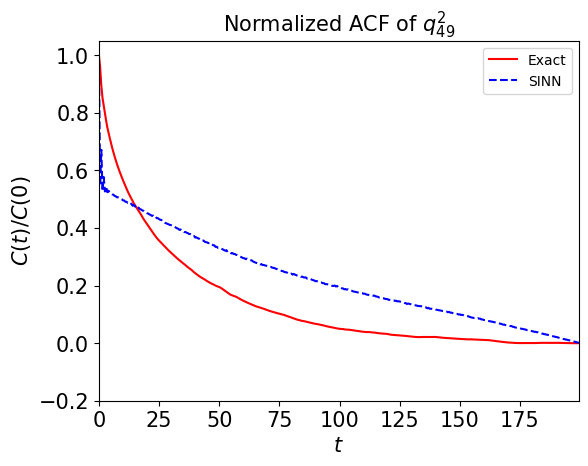

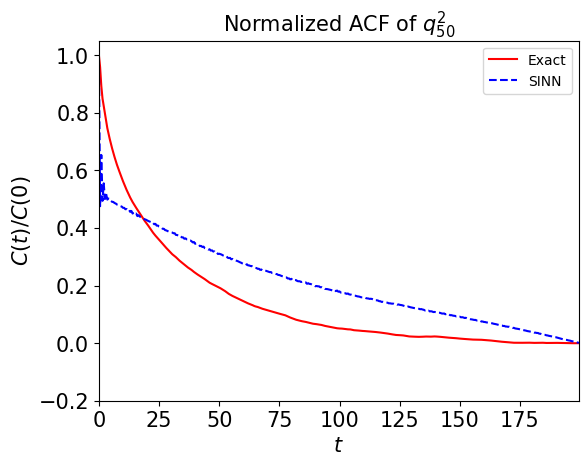

In [39]:
test4(model)

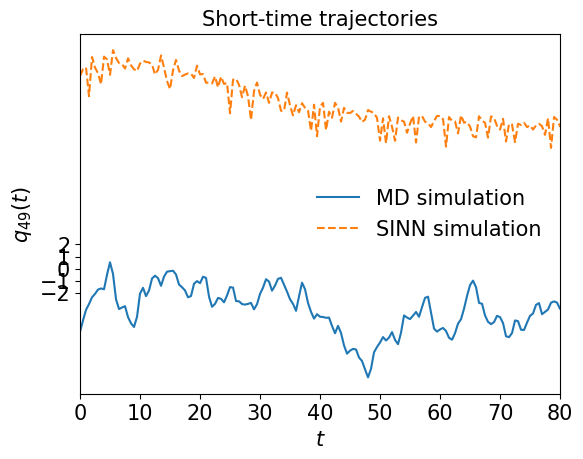

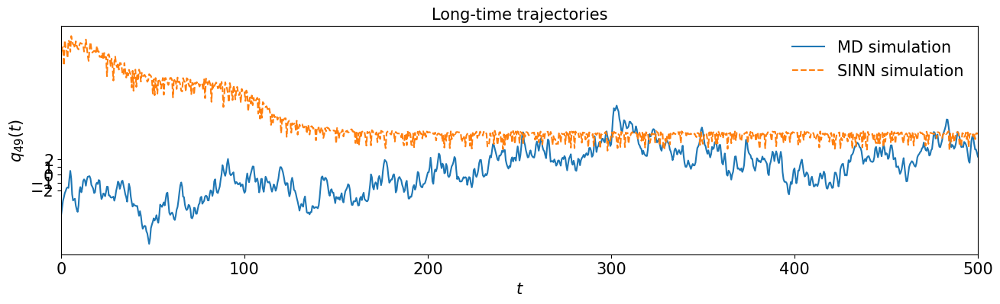

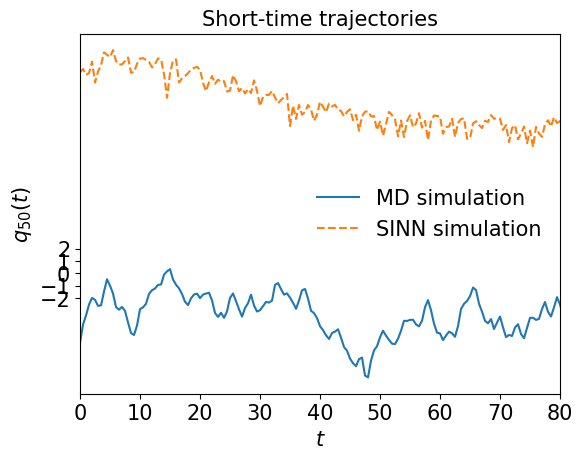

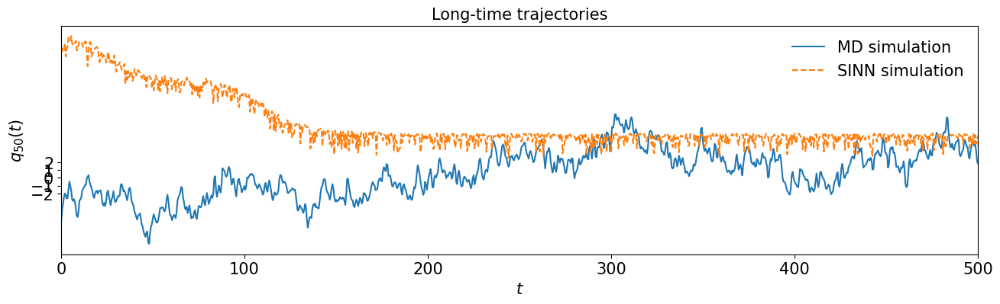

In [40]:
test5(model)

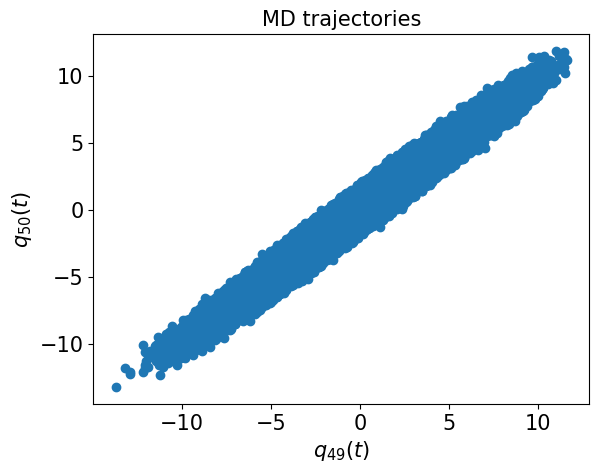

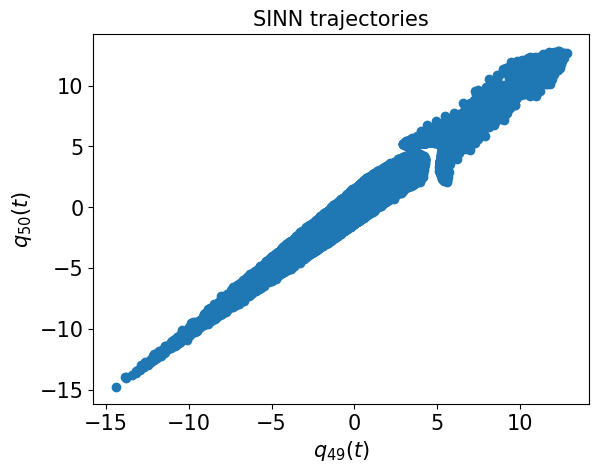

In [41]:
test6(model)

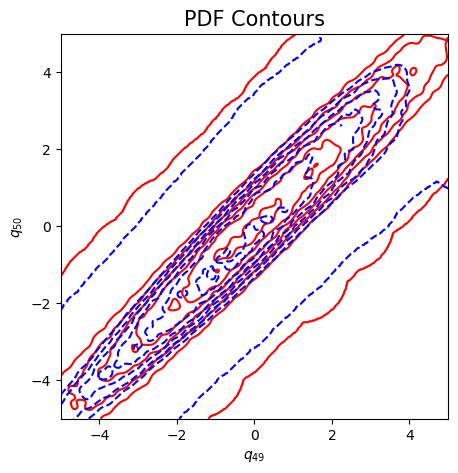

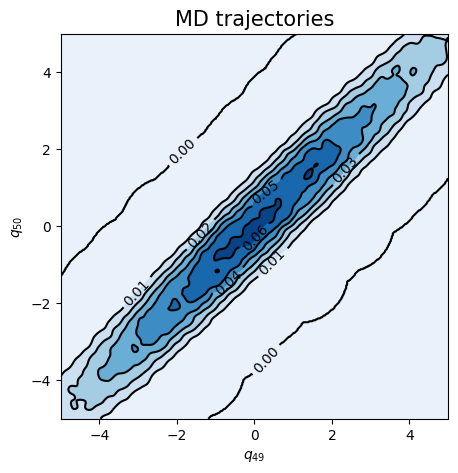

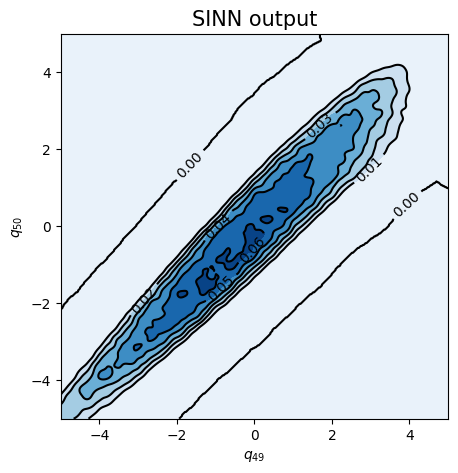

In [42]:
test7(model)

In [43]:
### Defining SINN model
net1 = SINN(2, 50, 2, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model1 = Model(net=net1)
model1.train()

[0]-th step loss: 0.8504, 0.8491, acf: 0.10205, ccf: 0.12511, pdf: 0.29180, pdf2: 0.28509, acf2: 0.04507
[50]-th step loss: 0.3655, 0.3676, acf: 0.04002, ccf: 0.27832, pdf: 0.01943, pdf2: 0.02147, acf2: 0.00837
[100]-th step loss: 0.3384, 0.3301, acf: 0.01273, ccf: 0.30147, pdf: 0.00658, pdf2: 0.00877, acf2: 0.00052
[150]-th step loss: 0.2576, 0.2779, acf: 0.03170, ccf: 0.21067, pdf: 0.01769, pdf2: 0.01460, acf2: 0.00326
[200]-th step loss: 0.3896, 0.3939, acf: 0.00634, ccf: 0.36902, pdf: 0.00679, pdf2: 0.01152, acf2: 0.00025
[250]-th step loss: 0.3626, 0.3411, acf: 0.01976, ccf: 0.30438, pdf: 0.00640, pdf2: 0.00940, acf2: 0.00118
[300]-th step loss: 0.3772, 0.3822, acf: 0.00531, ccf: 0.36371, pdf: 0.00385, pdf2: 0.00856, acf2: 0.00074
[350]-th step loss: 0.3753, 0.3637, acf: 0.00867, ccf: 0.34570, pdf: 0.00210, pdf2: 0.00710, acf2: 0.00017
[400]-th step loss: 0.3311, 0.3228, acf: 0.03387, ccf: 0.27260, pdf: 0.00395, pdf2: 0.00702, acf2: 0.00538
[450]-th step loss: 0.3160, 0.2980, acf:

[3850]-th step loss: 0.3061, 0.3058, acf: 0.10933, ccf: 0.12183, pdf: 0.00829, pdf2: 0.01462, acf2: 0.05177
[3900]-th step loss: 0.1808, 0.1744, acf: 0.05203, ccf: 0.07019, pdf: 0.00829, pdf2: 0.00876, acf2: 0.03514
[3950]-th step loss: 0.0615, 0.0614, acf: 0.01246, ccf: 0.01586, pdf: 0.00829, pdf2: 0.00662, acf2: 0.01821
[4000]-th step loss: 0.0591, 0.0590, acf: 0.01119, ccf: 0.01448, pdf: 0.00829, pdf2: 0.00532, acf2: 0.01976
[4050]-th step loss: 0.0595, 0.0579, acf: 0.01164, ccf: 0.01521, pdf: 0.00829, pdf2: 0.00463, acf2: 0.01810
[4100]-th step loss: 0.0566, 0.0565, acf: 0.01155, ccf: 0.01524, pdf: 0.00829, pdf2: 0.00423, acf2: 0.01718
[4150]-th step loss: 0.0539, 0.0538, acf: 0.01005, ccf: 0.01349, pdf: 0.00829, pdf2: 0.00400, acf2: 0.01799
[4200]-th step loss: 0.0490, 0.0492, acf: 0.00810, ccf: 0.01124, pdf: 0.00829, pdf2: 0.00393, acf2: 0.01768
[4250]-th step loss: 0.0427, 0.0424, acf: 0.00524, ccf: 0.00773, pdf: 0.00829, pdf2: 0.00392, acf2: 0.01719
[4300]-th step loss: 0.2797,

[7650]-th step loss: 0.0241, 0.0245, acf: 0.00026, ccf: 0.00026, pdf: 0.00829, pdf2: 0.00371, acf2: 0.01193
[7700]-th step loss: 0.0261, 0.0248, acf: 0.00023, ccf: 0.00023, pdf: 0.00829, pdf2: 0.00372, acf2: 0.01232
[7750]-th step loss: 0.0231, 0.0244, acf: 0.00008, ccf: 0.00009, pdf: 0.00829, pdf2: 0.00373, acf2: 0.01226
[7800]-th step loss: 0.0273, 0.0261, acf: 0.00008, ccf: 0.00009, pdf: 0.00829, pdf2: 0.00411, acf2: 0.01348
[7850]-th step loss: 0.0252, 0.0261, acf: 0.00007, ccf: 0.00008, pdf: 0.00829, pdf2: 0.00384, acf2: 0.01383
[7900]-th step loss: 0.0278, 0.0260, acf: 0.00024, ccf: 0.00024, pdf: 0.00829, pdf2: 0.00481, acf2: 0.01238
[7950]-th step loss: 0.0278, 0.0253, acf: 0.00018, ccf: 0.00018, pdf: 0.00829, pdf2: 0.00380, acf2: 0.01284
[8000]-th step loss: 0.0246, 0.0263, acf: 0.00006, ccf: 0.00006, pdf: 0.00829, pdf2: 0.00376, acf2: 0.01409
[8050]-th step loss: 0.0276, 0.0289, acf: 0.00023, ccf: 0.00025, pdf: 0.00829, pdf2: 0.00385, acf2: 0.01628
[8100]-th step loss: 0.0237,

[11450]-th step loss: 0.0274, 0.0255, acf: 0.00009, ccf: 0.00009, pdf: 0.00829, pdf2: 0.00370, acf2: 0.01336
[11500]-th step loss: 0.0267, 0.0250, acf: 0.00017, ccf: 0.00016, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01256
[11550]-th step loss: 0.0241, 0.0251, acf: 0.00015, ccf: 0.00014, pdf: 0.00829, pdf2: 0.00433, acf2: 0.01217
[11600]-th step loss: 0.0292, 0.0290, acf: 0.00005, ccf: 0.00005, pdf: 0.00829, pdf2: 0.00461, acf2: 0.01601
[11650]-th step loss: 0.0302, 0.0290, acf: 0.00023, ccf: 0.00023, pdf: 0.00829, pdf2: 0.00380, acf2: 0.01645
[11700]-th step loss: 0.0256, 0.0247, acf: 0.00005, ccf: 0.00005, pdf: 0.00829, pdf2: 0.00372, acf2: 0.01257
[11750]-th step loss: 0.0356, 0.0256, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00377, acf2: 0.01350
[11800]-th step loss: 0.0228, 0.0273, acf: 0.00007, ccf: 0.00008, pdf: 0.00829, pdf2: 0.00373, acf2: 0.01509
[11850]-th step loss: 0.0258, 0.0265, acf: 0.00005, ccf: 0.00005, pdf: 0.00829, pdf2: 0.00371, acf2: 0.01441
[11900]-th step los

[15250]-th step loss: 0.0327, 0.0259, acf: 0.00017, ccf: 0.00017, pdf: 0.00829, pdf2: 0.00382, acf2: 0.01347
[15300]-th step loss: 0.0325, 0.0296, acf: 0.00009, ccf: 0.00009, pdf: 0.00829, pdf2: 0.00473, acf2: 0.01644
[15350]-th step loss: 0.0227, 0.0254, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00386, acf2: 0.01314
[15400]-th step loss: 0.0276, 0.0254, acf: 0.00006, ccf: 0.00006, pdf: 0.00829, pdf2: 0.00369, acf2: 0.01335
[15450]-th step loss: 0.0228, 0.0255, acf: 0.00002, ccf: 0.00002, pdf: 0.00829, pdf2: 0.00376, acf2: 0.01344
[15500]-th step loss: 0.0279, 0.0235, acf: 0.00030, ccf: 0.00029, pdf: 0.00829, pdf2: 0.00370, acf2: 0.01095
[15550]-th step loss: 0.0292, 0.0266, acf: 0.00006, ccf: 0.00006, pdf: 0.00829, pdf2: 0.00432, acf2: 0.01390
[15600]-th step loss: 0.0251, 0.0268, acf: 0.00006, ccf: 0.00006, pdf: 0.00829, pdf2: 0.00383, acf2: 0.01458
[15650]-th step loss: 0.0350, 0.0269, acf: 0.00004, ccf: 0.00004, pdf: 0.00829, pdf2: 0.00371, acf2: 0.01486
[15700]-th step los

[19050]-th step loss: 0.0260, 0.0276, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00371, acf2: 0.01552
[19100]-th step loss: 0.0242, 0.0232, acf: 0.00031, ccf: 0.00031, pdf: 0.00829, pdf2: 0.00374, acf2: 0.01053
[19150]-th step loss: 0.0239, 0.0247, acf: 0.00012, ccf: 0.00011, pdf: 0.00829, pdf2: 0.00370, acf2: 0.01243
[19200]-th step loss: 0.0289, 0.0289, acf: 0.00010, ccf: 0.00010, pdf: 0.00829, pdf2: 0.00376, acf2: 0.01661
[19250]-th step loss: 0.0240, 0.0259, acf: 0.00006, ccf: 0.00006, pdf: 0.00829, pdf2: 0.00370, acf2: 0.01379
[19300]-th step loss: 0.0285, 0.0248, acf: 0.00004, ccf: 0.00004, pdf: 0.00829, pdf2: 0.00376, acf2: 0.01268
[19350]-th step loss: 0.0250, 0.0252, acf: 0.00010, ccf: 0.00010, pdf: 0.00829, pdf2: 0.00369, acf2: 0.01303
[19400]-th step loss: 0.0238, 0.0261, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00441, acf2: 0.01335
[19450]-th step loss: 0.0270, 0.0246, acf: 0.00004, ccf: 0.00004, pdf: 0.00829, pdf2: 0.00374, acf2: 0.01250
[19500]-th step los

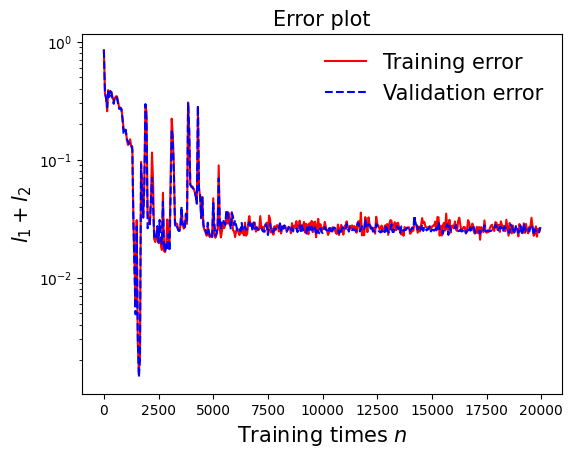

In [44]:
draw_loss(model1)

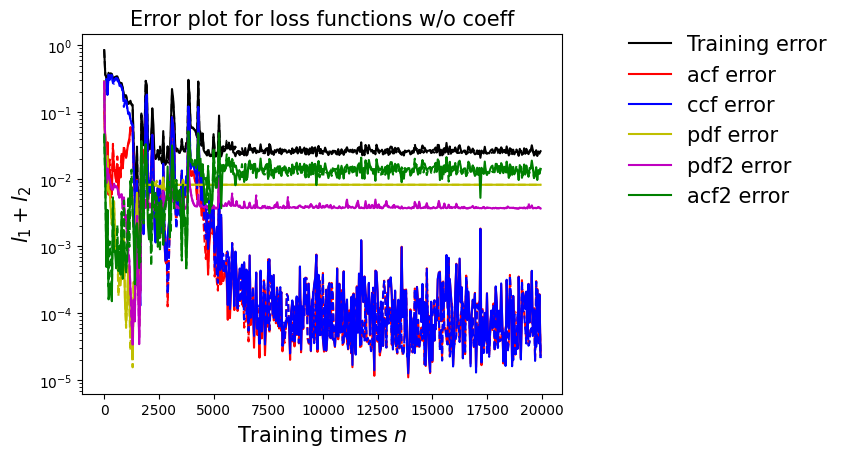

In [45]:
draw_errors(model1)

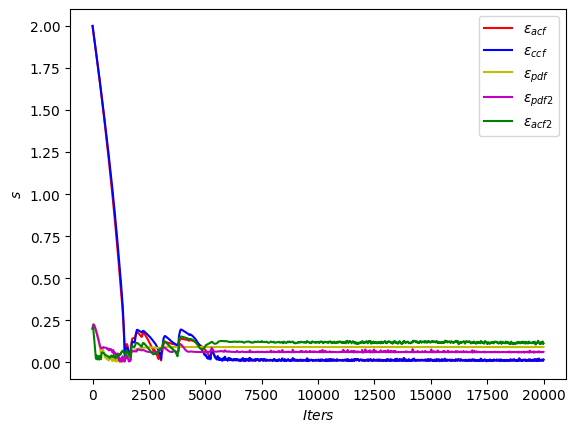

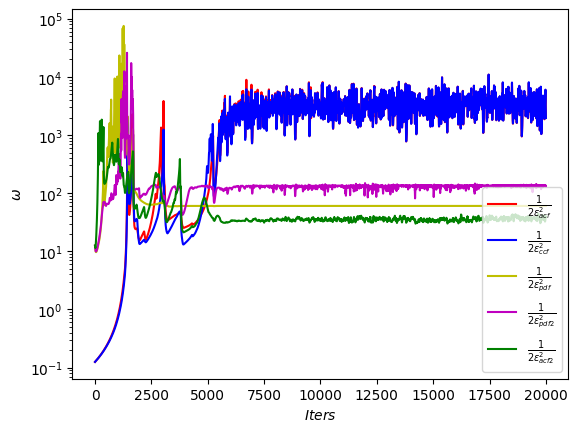

In [46]:
draw_adaptive_w(model1)
draw_epoch_w(model1)

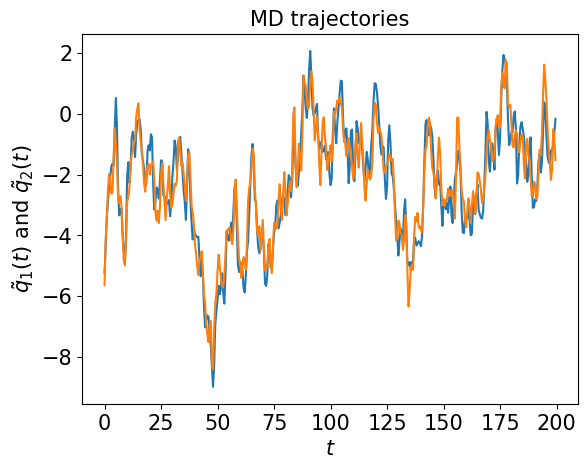

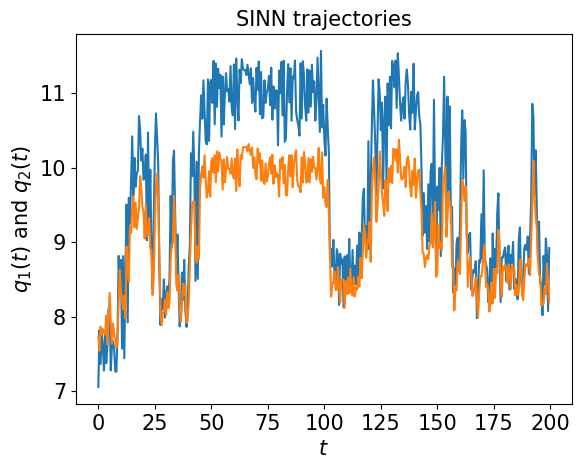

In [47]:
test1(model1)

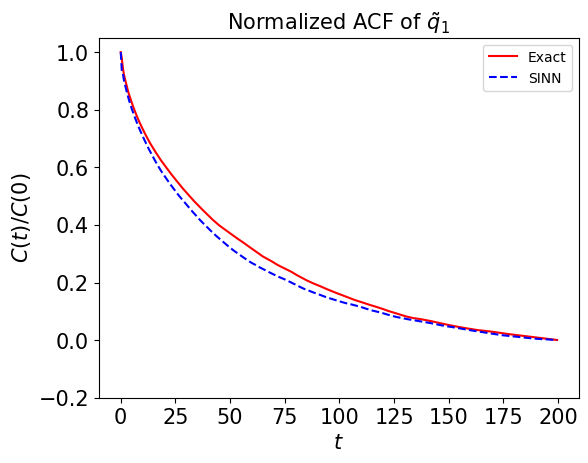

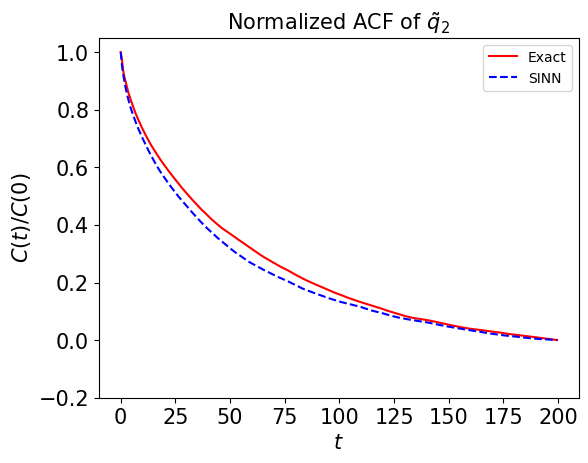

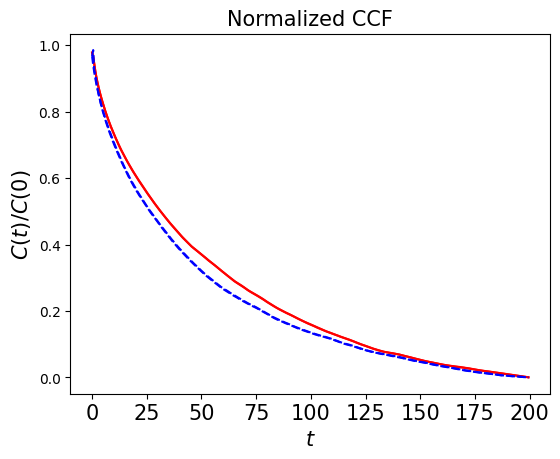

In [48]:
test2(model1)

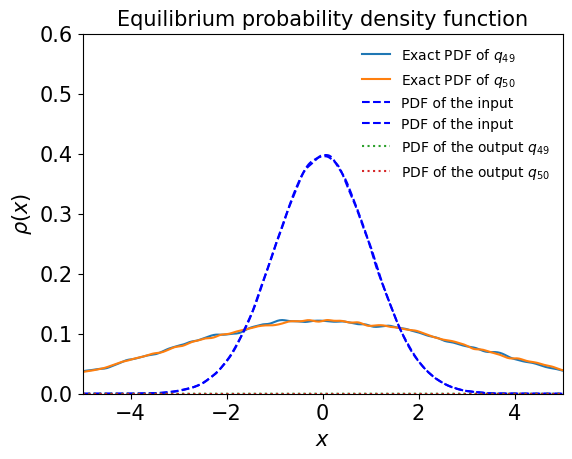

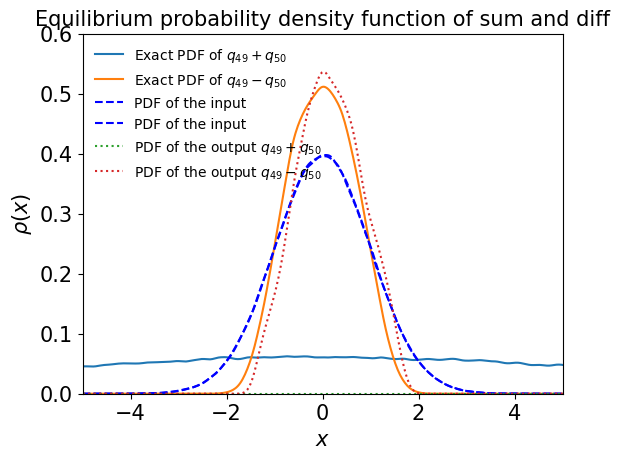

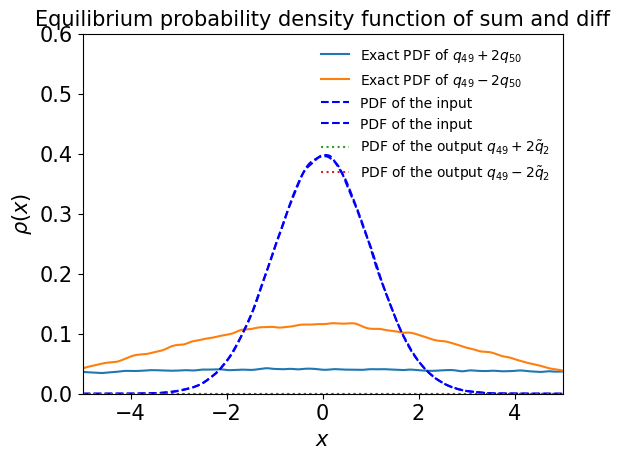

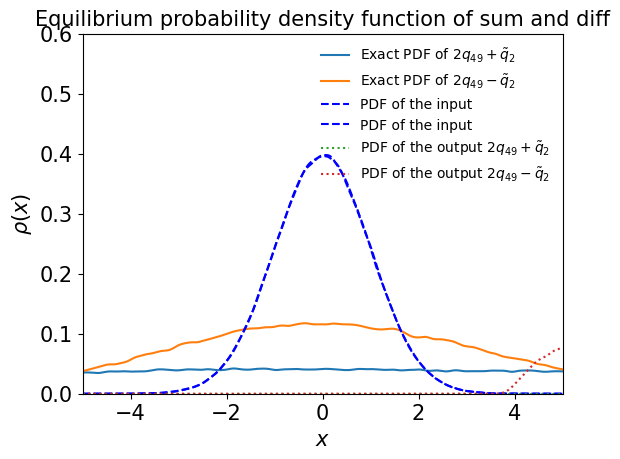

In [49]:
test3(model1)

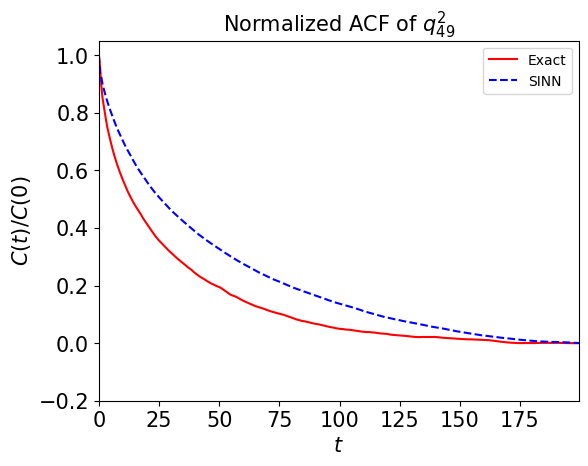

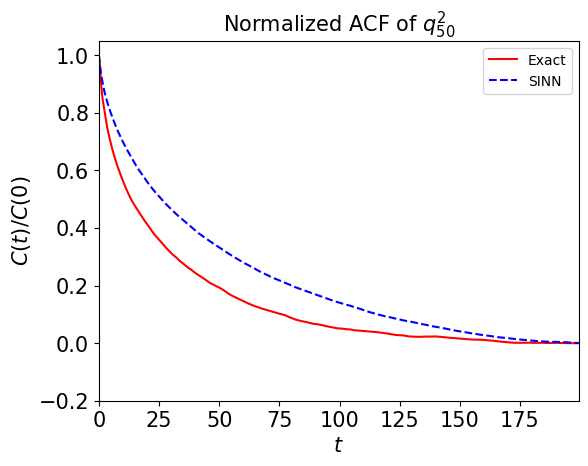

In [50]:
test4(model1)

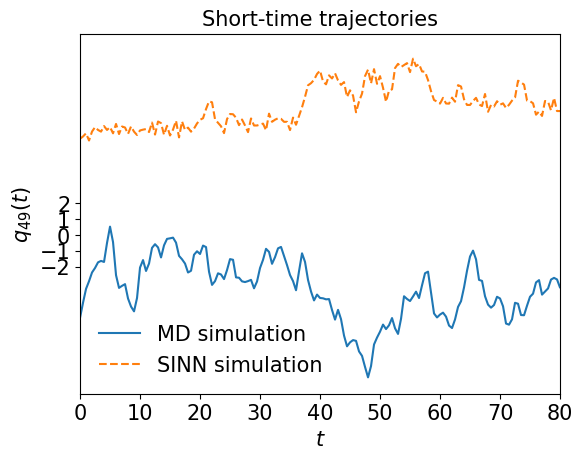

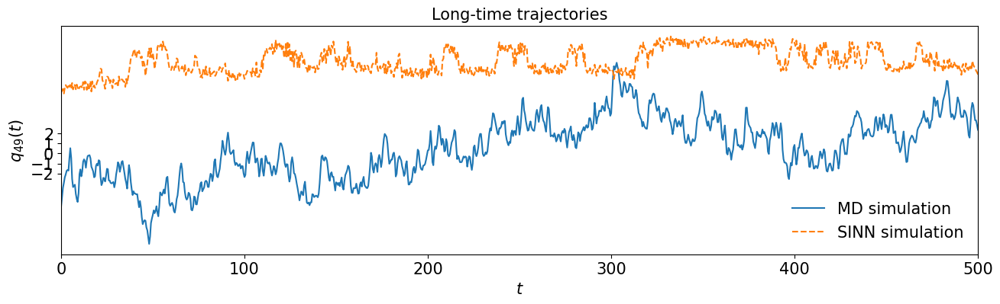

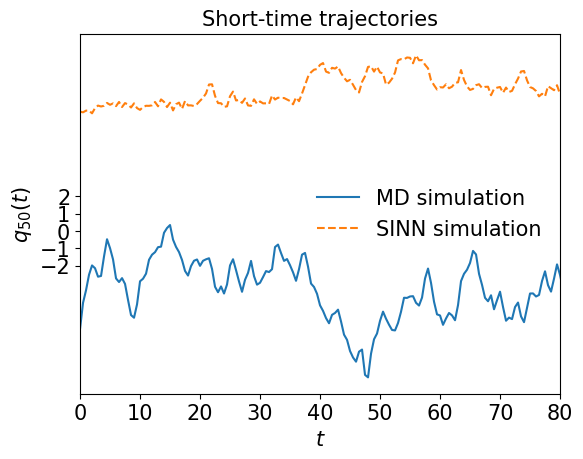

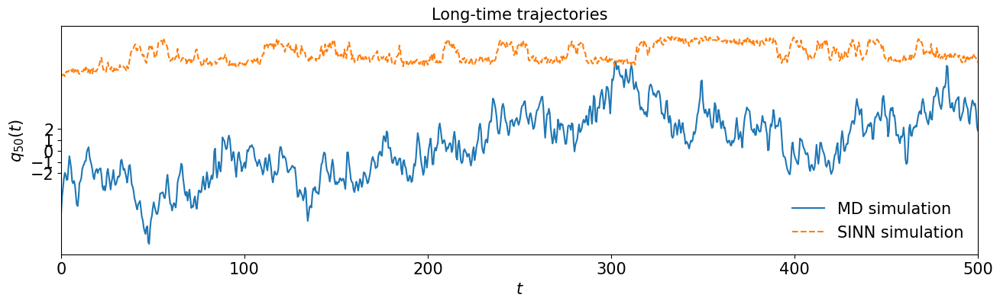

In [51]:
test5(model1)

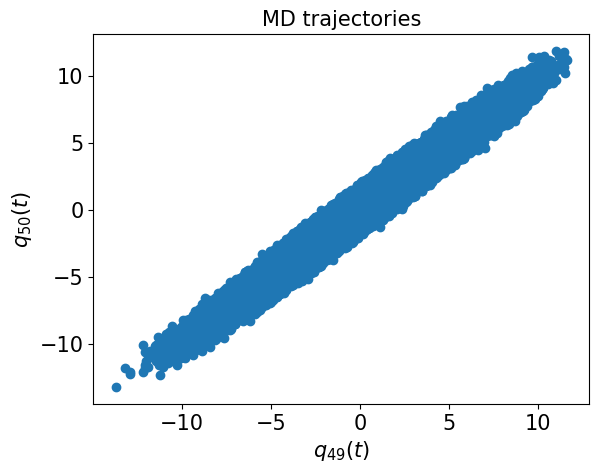

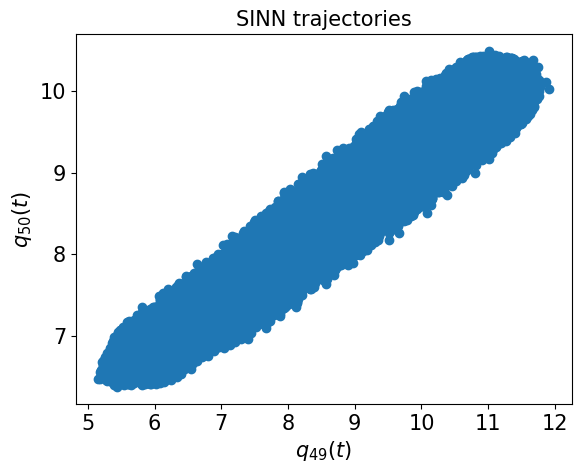

In [52]:
test6(model1)

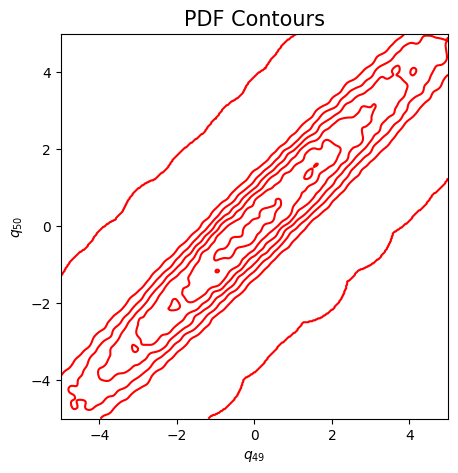

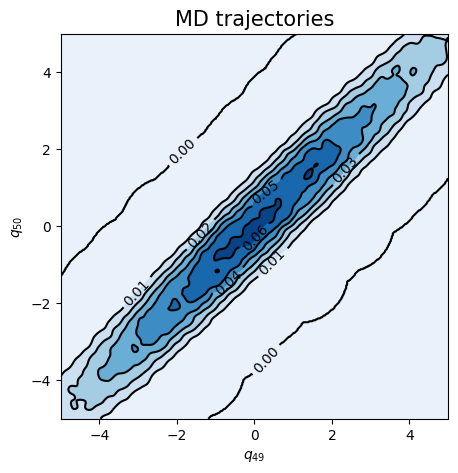

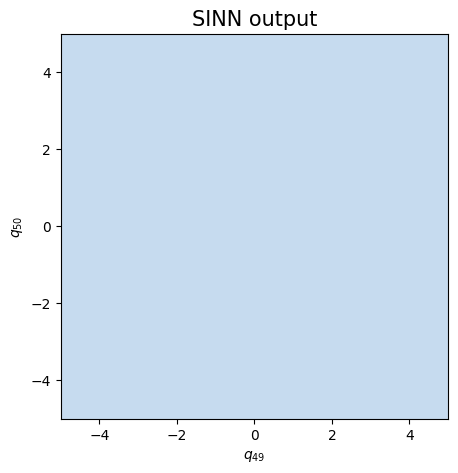

In [53]:
test7(model1)

In [54]:
### Defining SINN model
net2 = SINN(2, 50, 2, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model2 = Model(net=net2)
model2.train()

[0]-th step loss: 0.8345, 0.8275, acf: 0.10036, ccf: 0.10163, pdf: 0.29283, pdf2: 0.28892, acf2: 0.04378
[50]-th step loss: 0.1656, 0.1618, acf: 0.04852, ccf: 0.04847, pdf: 0.02760, pdf2: 0.02064, acf2: 0.01656
[100]-th step loss: 0.0658, 0.0767, acf: 0.00250, ccf: 0.00250, pdf: 0.04311, pdf2: 0.02707, acf2: 0.00149
[150]-th step loss: 0.0511, 0.0559, acf: 0.00823, ccf: 0.00826, pdf: 0.03092, pdf2: 0.00804, acf2: 0.00042
[200]-th step loss: 0.0515, 0.0390, acf: 0.01053, ccf: 0.01051, pdf: 0.00964, pdf2: 0.00786, acf2: 0.00048
[250]-th step loss: 0.0184, 0.0160, acf: 0.00268, ccf: 0.00268, pdf: 0.00700, pdf2: 0.00351, acf2: 0.00014
[300]-th step loss: 0.0223, 0.0165, acf: 0.00475, ccf: 0.00475, pdf: 0.00432, pdf2: 0.00252, acf2: 0.00016
[350]-th step loss: 0.0219, 0.0159, acf: 0.00325, ccf: 0.00331, pdf: 0.00681, pdf2: 0.00164, acf2: 0.00084
[400]-th step loss: 0.0170, 0.0163, acf: 0.00748, ccf: 0.00751, pdf: 0.00089, pdf2: 0.00028, acf2: 0.00014
[450]-th step loss: 0.0100, 0.0101, acf:

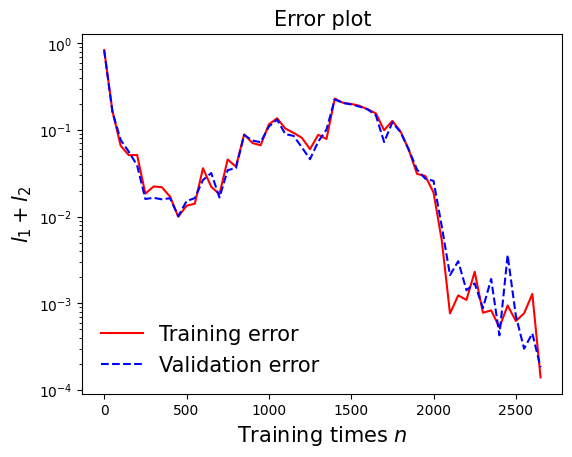

In [55]:
draw_loss(model2)

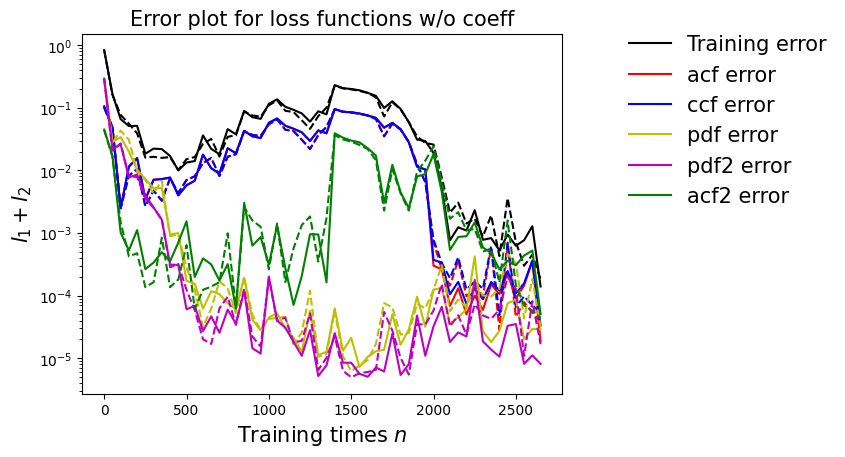

In [56]:
draw_errors(model2)

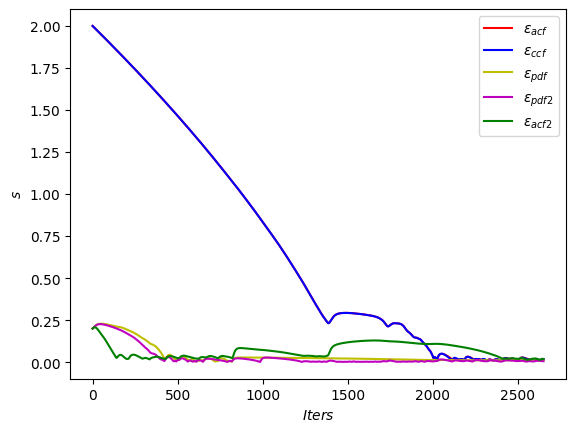

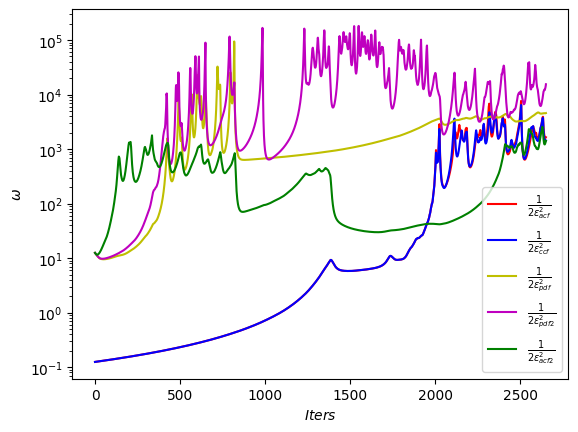

In [57]:
draw_adaptive_w(model2)
draw_epoch_w(model2)

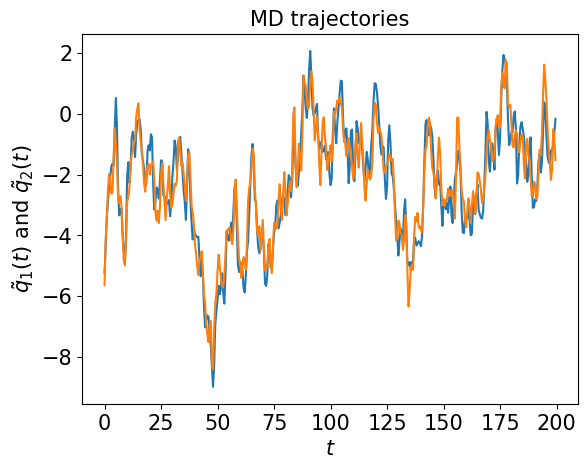

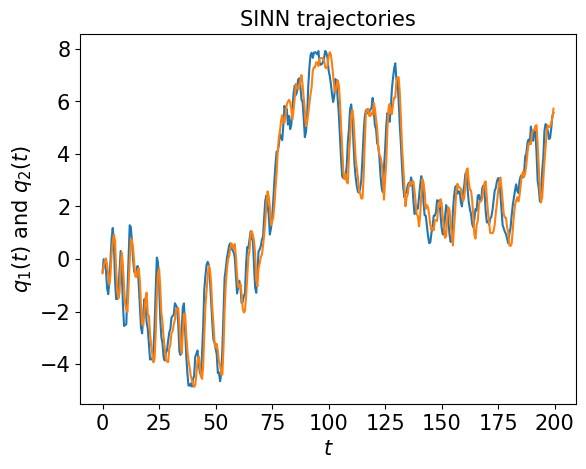

In [58]:
test1(model2)

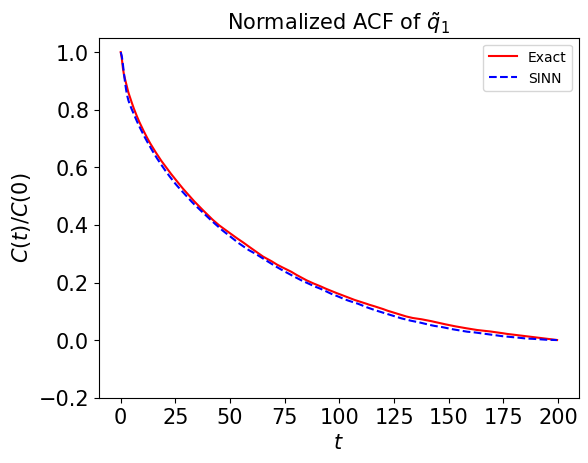

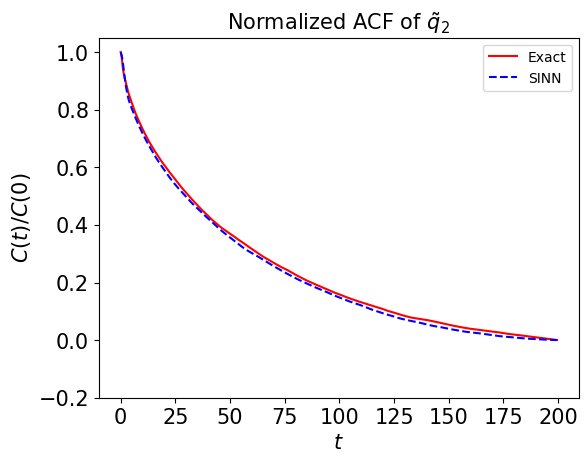

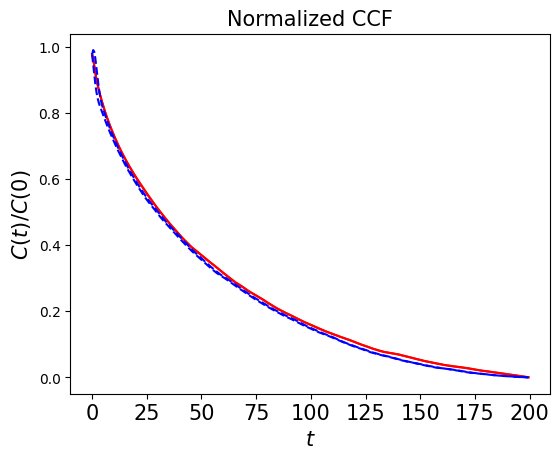

In [59]:
test2(model2)

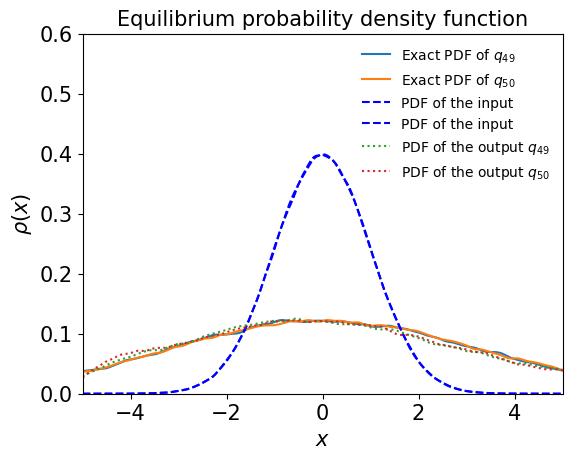

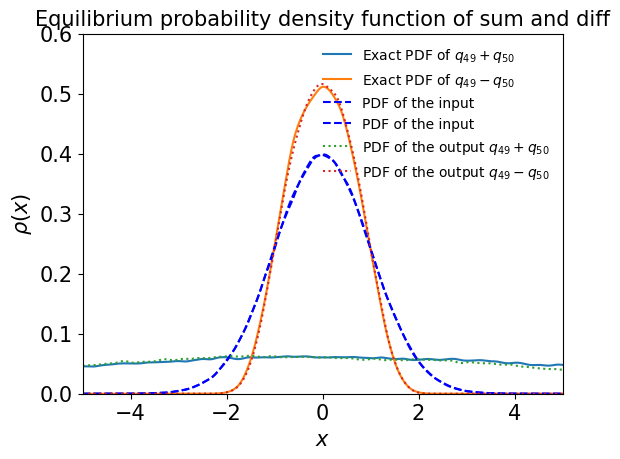

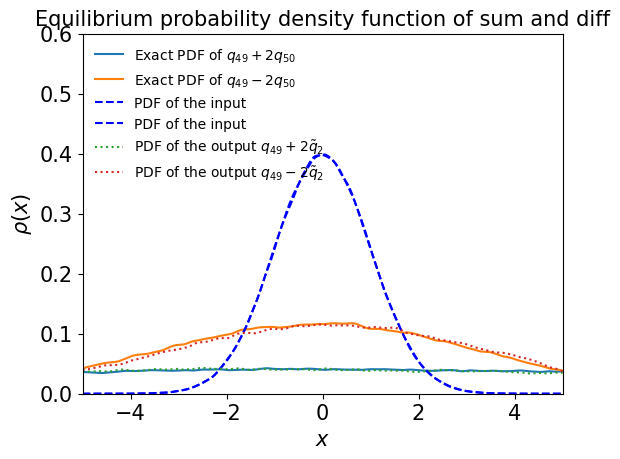

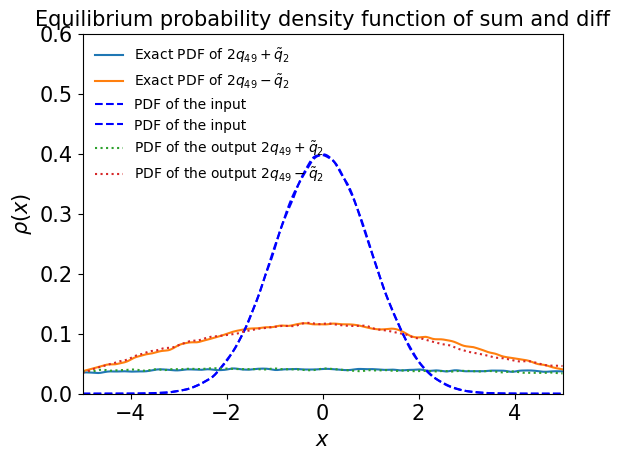

In [60]:
test3(model2)

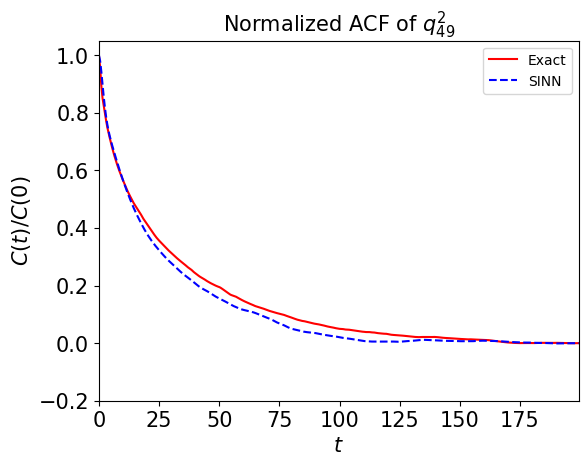

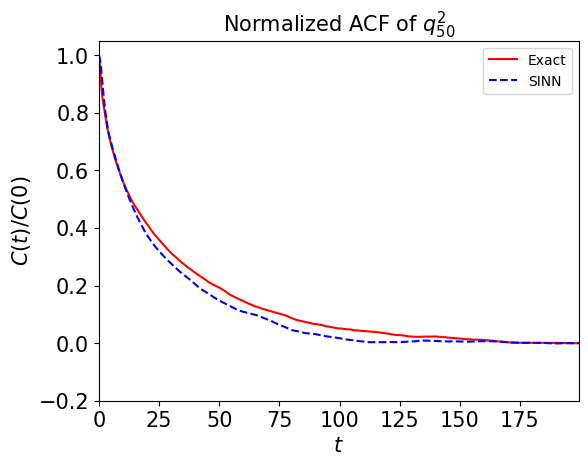

In [61]:
test4(model2)

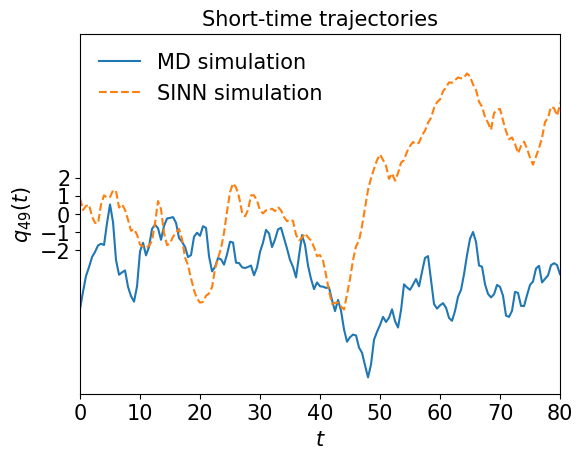

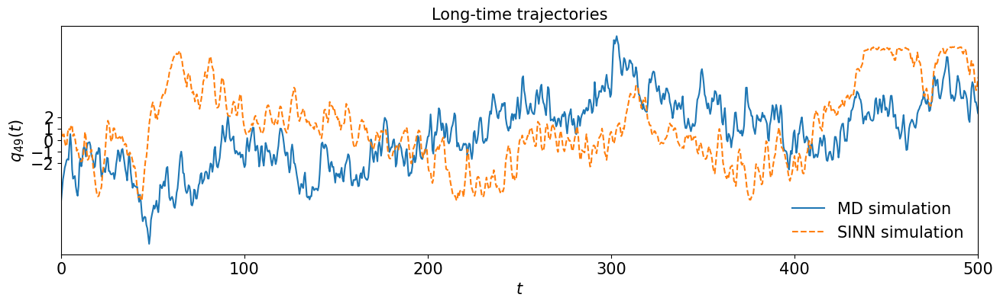

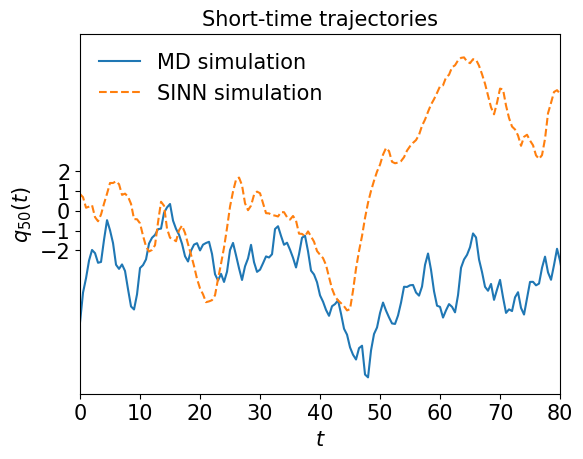

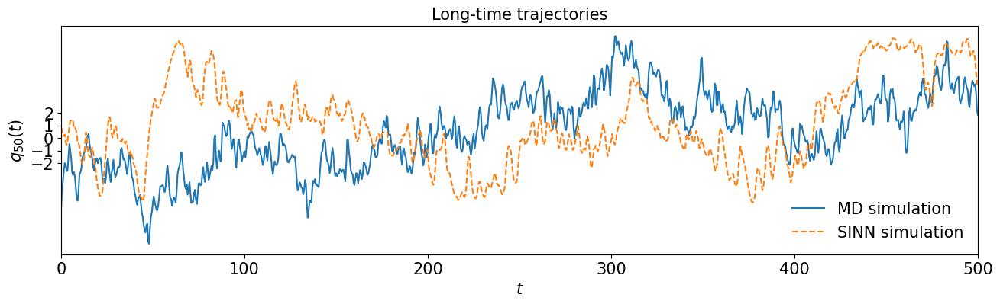

In [62]:
test5(model2)

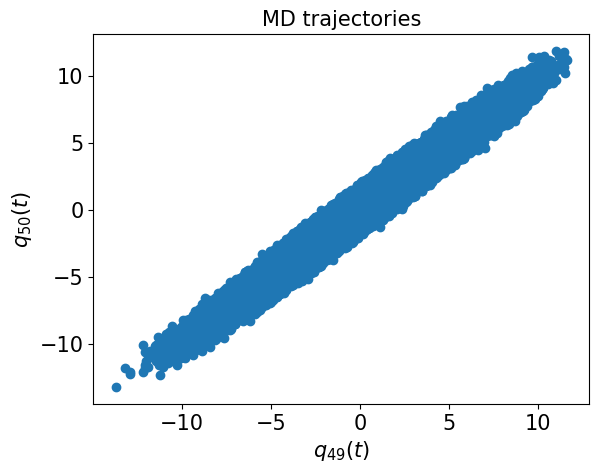

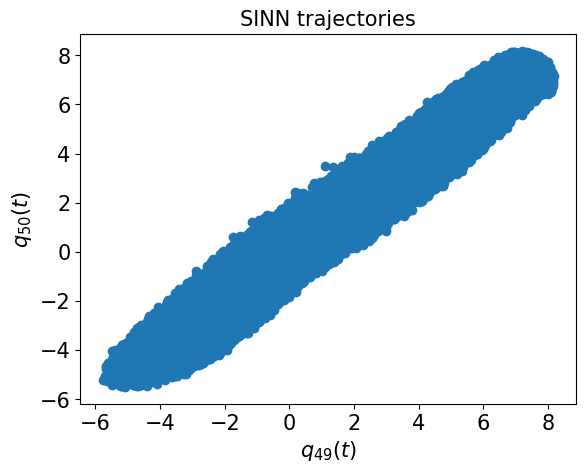

In [63]:
test6(model2)

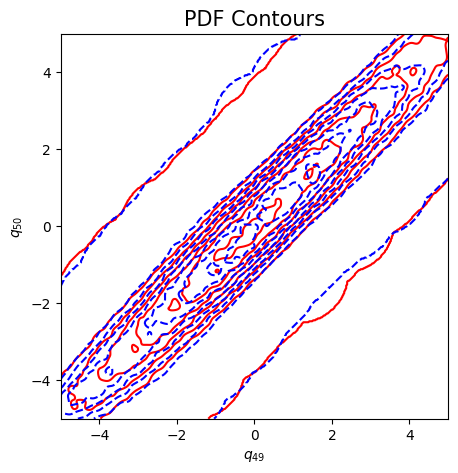

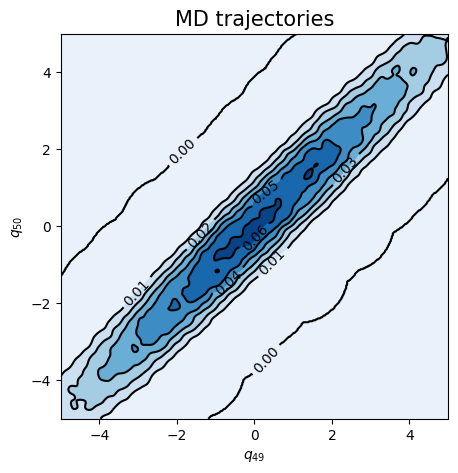

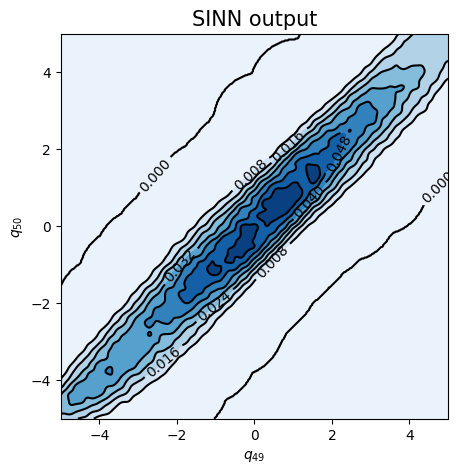

In [64]:
test7(model2)

In [65]:
### Defining SINN model
net3 = SINN(2, 50, 2, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model3 = Model(net=net3)
model3.train()

[0]-th step loss: 0.8639, 0.8617, acf: 0.10210, ccf: 0.13500, pdf: 0.29230, pdf2: 0.28712, acf2: 0.04513
[50]-th step loss: 0.3882, 0.3825, acf: 0.03419, ccf: 0.29467, pdf: 0.02573, pdf2: 0.02018, acf2: 0.00777
[100]-th step loss: 0.4288, 0.4451, acf: 0.00856, ccf: 0.40261, pdf: 0.01618, pdf2: 0.01638, acf2: 0.00139
[150]-th step loss: 0.4000, 0.4116, acf: 0.02334, ccf: 0.33773, pdf: 0.03382, pdf2: 0.01326, acf2: 0.00347
[200]-th step loss: 0.4018, 0.4041, acf: 0.01763, ccf: 0.35789, pdf: 0.01740, pdf2: 0.00882, acf2: 0.00233
[250]-th step loss: 0.3850, 0.3786, acf: 0.02528, ccf: 0.32536, pdf: 0.01389, pdf2: 0.00751, acf2: 0.00657
[300]-th step loss: 0.4028, 0.3881, acf: 0.01473, ccf: 0.35469, pdf: 0.01004, pdf2: 0.00707, acf2: 0.00161
[350]-th step loss: 0.3726, 0.3706, acf: 0.01578, ccf: 0.33533, pdf: 0.01200, pdf2: 0.00646, acf2: 0.00100
[400]-th step loss: 0.3550, 0.3479, acf: 0.04807, ccf: 0.17615, pdf: 0.09804, pdf2: 0.01013, acf2: 0.01548
[450]-th step loss: 0.1063, 0.0953, acf:

[3850]-th step loss: 0.0284, 0.0446, acf: 0.00726, ccf: 0.00709, pdf: 0.01895, pdf2: 0.01014, acf2: 0.00115
[3900]-th step loss: 0.0389, 0.0398, acf: 0.00144, ccf: 0.00068, pdf: 0.02296, pdf2: 0.01013, acf2: 0.00459
[3950]-th step loss: 0.0365, 0.0363, acf: 0.00119, ccf: 0.00055, pdf: 0.02037, pdf2: 0.01013, acf2: 0.00403
[4000]-th step loss: 0.0335, 0.0339, acf: 0.00149, ccf: 0.00070, pdf: 0.01832, pdf2: 0.01013, acf2: 0.00329
[4050]-th step loss: 0.0312, 0.0318, acf: 0.00148, ccf: 0.00068, pdf: 0.01633, pdf2: 0.01013, acf2: 0.00323
[4100]-th step loss: 0.0296, 0.0300, acf: 0.00166, ccf: 0.00076, pdf: 0.01444, pdf2: 0.01013, acf2: 0.00298
[4150]-th step loss: 0.0276, 0.0280, acf: 0.00159, ccf: 0.00067, pdf: 0.01259, pdf2: 0.01013, acf2: 0.00304
[4200]-th step loss: 0.0279, 0.0264, acf: 0.00158, ccf: 0.00068, pdf: 0.01097, pdf2: 0.01013, acf2: 0.00300
[4250]-th step loss: 0.0244, 0.0250, acf: 0.00160, ccf: 0.00075, pdf: 0.00977, pdf2: 0.01012, acf2: 0.00277
[4300]-th step loss: 0.0236,

[7650]-th step loss: 0.0238, 0.0207, acf: 0.00002, ccf: 0.00001, pdf: 0.00430, pdf2: 0.00930, acf2: 0.00711
[7700]-th step loss: 0.0256, 0.0224, acf: 0.00003, ccf: 0.00004, pdf: 0.00452, pdf2: 0.00948, acf2: 0.00834
[7750]-th step loss: 0.0219, 0.0221, acf: 0.00004, ccf: 0.00005, pdf: 0.00426, pdf2: 0.00935, acf2: 0.00843
[7800]-th step loss: 0.0237, 0.0228, acf: 0.00007, ccf: 0.00007, pdf: 0.00587, pdf2: 0.01001, acf2: 0.00680
[7850]-th step loss: 0.0212, 0.0201, acf: 0.00015, ccf: 0.00014, pdf: 0.00477, pdf2: 0.00930, acf2: 0.00573
[7900]-th step loss: 0.0232, 0.0223, acf: 0.00010, ccf: 0.00010, pdf: 0.00429, pdf2: 0.00945, acf2: 0.00833
[7950]-th step loss: 0.0210, 0.0201, acf: 0.00006, ccf: 0.00006, pdf: 0.00427, pdf2: 0.00935, acf2: 0.00638
[8000]-th step loss: 0.0220, 0.0213, acf: 0.00004, ccf: 0.00004, pdf: 0.00431, pdf2: 0.00930, acf2: 0.00757
[8050]-th step loss: 0.0216, 0.0200, acf: 0.00009, ccf: 0.00008, pdf: 0.00432, pdf2: 0.00932, acf2: 0.00619
[8100]-th step loss: 0.0216,

[11450]-th step loss: 0.0202, 0.0215, acf: 0.00004, ccf: 0.00004, pdf: 0.00454, pdf2: 0.00926, acf2: 0.00765
[11500]-th step loss: 0.0202, 0.0226, acf: 0.00010, ccf: 0.00009, pdf: 0.00424, pdf2: 0.00927, acf2: 0.00892
[11550]-th step loss: 0.0238, 0.0231, acf: 0.00001, ccf: 0.00001, pdf: 0.00564, pdf2: 0.00982, acf2: 0.00763
[11600]-th step loss: 0.0215, 0.0208, acf: 0.00009, ccf: 0.00009, pdf: 0.00444, pdf2: 0.00942, acf2: 0.00679
[11650]-th step loss: 0.0244, 0.0218, acf: 0.00006, ccf: 0.00005, pdf: 0.00445, pdf2: 0.00924, acf2: 0.00802
[11700]-th step loss: 0.0214, 0.0223, acf: 0.00012, ccf: 0.00011, pdf: 0.00423, pdf2: 0.00941, acf2: 0.00839
[11750]-th step loss: 0.0237, 0.0231, acf: 0.00017, ccf: 0.00016, pdf: 0.00432, pdf2: 0.00934, acf2: 0.00911
[11800]-th step loss: 0.0208, 0.0213, acf: 0.00001, ccf: 0.00001, pdf: 0.00433, pdf2: 0.00941, acf2: 0.00752
[11850]-th step loss: 0.0204, 0.0206, acf: 0.00002, ccf: 0.00002, pdf: 0.00422, pdf2: 0.00927, acf2: 0.00711
[11900]-th step los

[15250]-th step loss: 0.0200, 0.0207, acf: 0.00002, ccf: 0.00001, pdf: 0.00421, pdf2: 0.00915, acf2: 0.00731
[15300]-th step loss: 0.0214, 0.0221, acf: 0.00005, ccf: 0.00004, pdf: 0.00472, pdf2: 0.00936, acf2: 0.00794
[15350]-th step loss: 0.0199, 0.0212, acf: 0.00004, ccf: 0.00003, pdf: 0.00456, pdf2: 0.00927, acf2: 0.00728
[15400]-th step loss: 0.0211, 0.0221, acf: 0.00005, ccf: 0.00004, pdf: 0.00467, pdf2: 0.00933, acf2: 0.00802
[15450]-th step loss: 0.0201, 0.0211, acf: 0.00003, ccf: 0.00002, pdf: 0.00421, pdf2: 0.00919, acf2: 0.00760
[15500]-th step loss: 0.0204, 0.0207, acf: 0.00003, ccf: 0.00002, pdf: 0.00422, pdf2: 0.00918, acf2: 0.00728
[15550]-th step loss: 0.0198, 0.0205, acf: 0.00002, ccf: 0.00002, pdf: 0.00420, pdf2: 0.00919, acf2: 0.00710
[15600]-th step loss: 0.0218, 0.0231, acf: 0.00011, ccf: 0.00009, pdf: 0.00472, pdf2: 0.00947, acf2: 0.00873
[15650]-th step loss: 0.0202, 0.0208, acf: 0.00004, ccf: 0.00003, pdf: 0.00421, pdf2: 0.00913, acf2: 0.00740
[15700]-th step los

[19050]-th step loss: 0.0202, 0.0191, acf: 0.00007, ccf: 0.00006, pdf: 0.00463, pdf2: 0.00691, acf2: 0.00738
[19100]-th step loss: 0.0206, 0.0199, acf: 0.00008, ccf: 0.00007, pdf: 0.00437, pdf2: 0.00773, acf2: 0.00764
[19150]-th step loss: 0.0199, 0.0225, acf: 0.00022, ccf: 0.00021, pdf: 0.00482, pdf2: 0.00814, acf2: 0.00911
[19200]-th step loss: 0.0181, 0.0189, acf: 0.00005, ccf: 0.00004, pdf: 0.00454, pdf2: 0.00706, acf2: 0.00721
[19250]-th step loss: 0.0202, 0.0204, acf: 0.00010, ccf: 0.00009, pdf: 0.00446, pdf2: 0.00766, acf2: 0.00809
[19300]-th step loss: 0.0181, 0.0184, acf: 0.00003, ccf: 0.00003, pdf: 0.00465, pdf2: 0.00660, acf2: 0.00712
[19350]-th step loss: 0.0220, 0.0198, acf: 0.00006, ccf: 0.00006, pdf: 0.00492, pdf2: 0.00618, acf2: 0.00864
[19400]-th step loss: 0.0217, 0.0232, acf: 0.00010, ccf: 0.00010, pdf: 0.00507, pdf2: 0.00868, acf2: 0.00924
[19450]-th step loss: 0.0228, 0.0206, acf: 0.00020, ccf: 0.00018, pdf: 0.00441, pdf2: 0.00736, acf2: 0.00849
[19500]-th step los

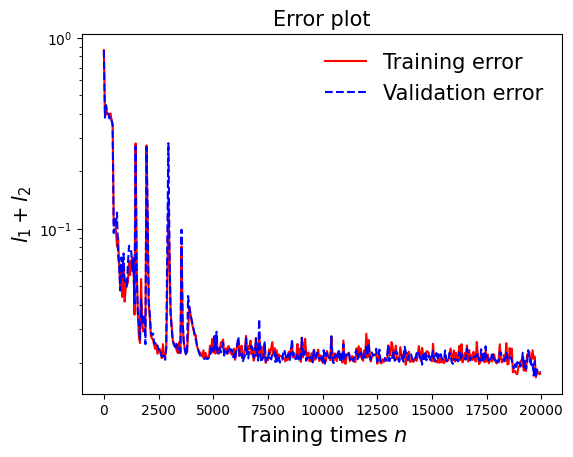

In [66]:
draw_loss(model3)

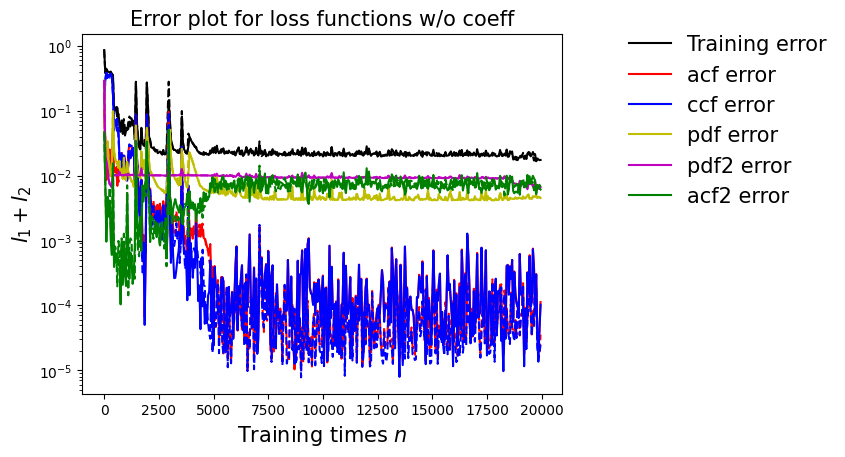

In [67]:
draw_errors(model3)

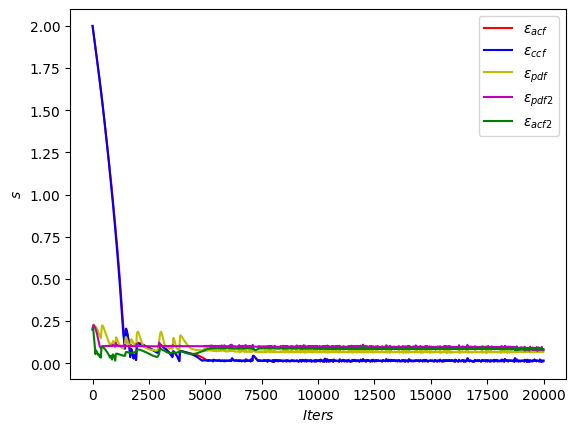

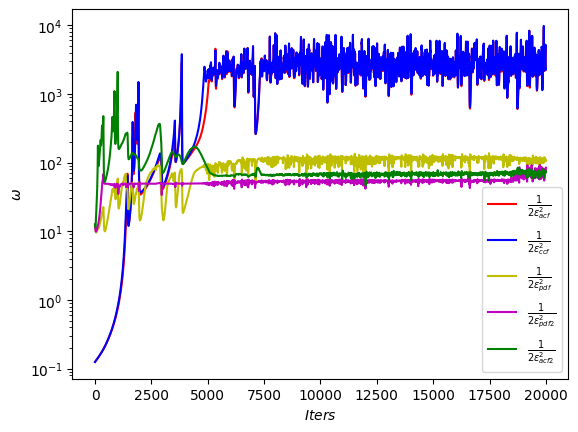

In [68]:
draw_adaptive_w(model3)
draw_epoch_w(model3)

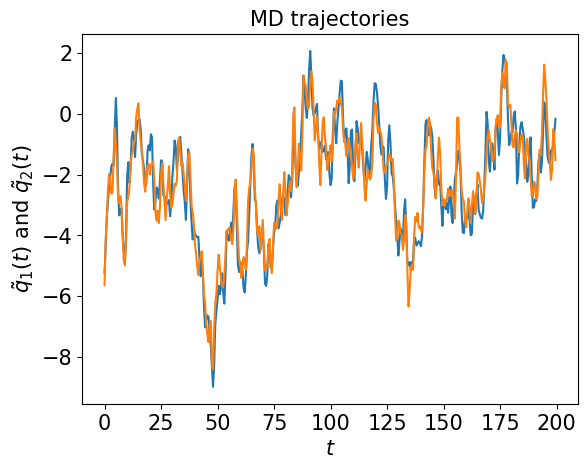

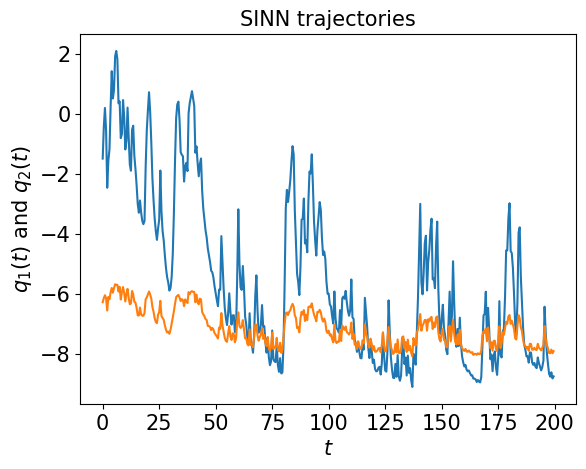

In [69]:
test1(model3)

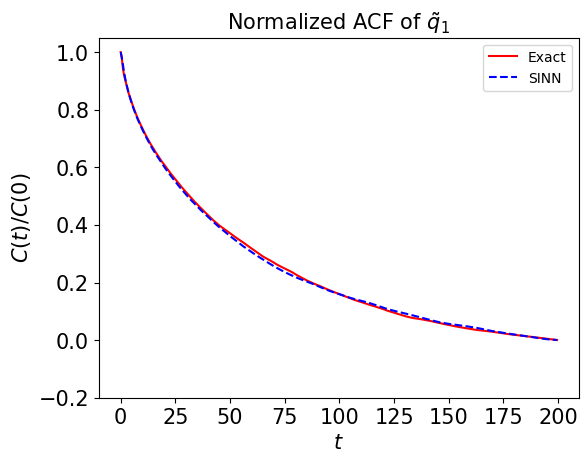

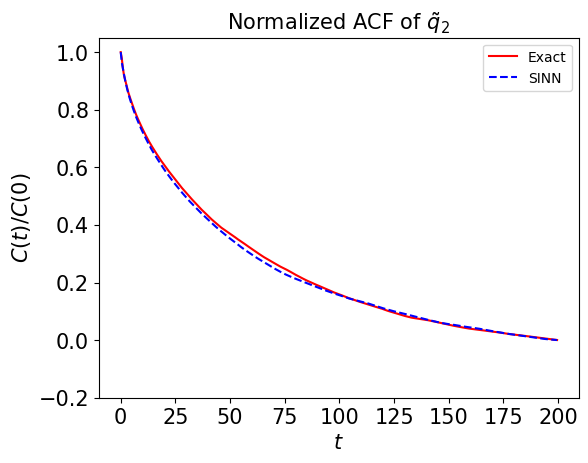

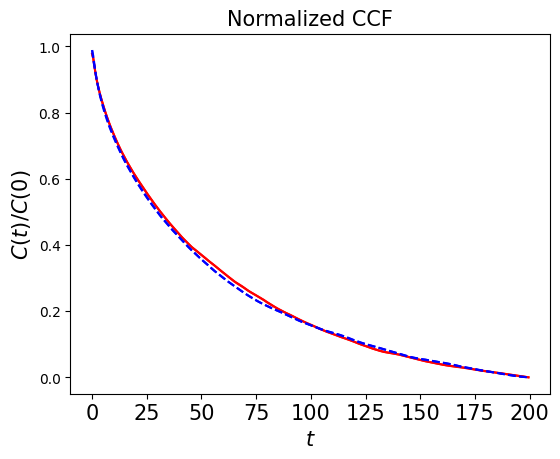

In [70]:
test2(model3)

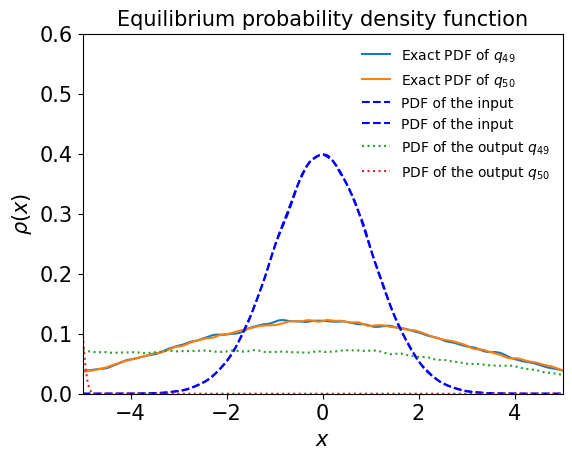

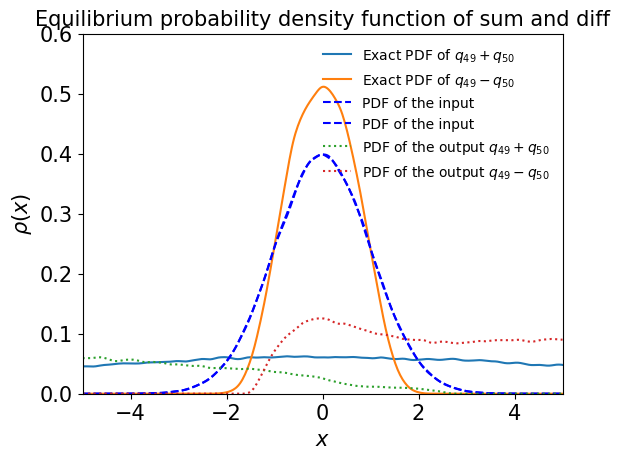

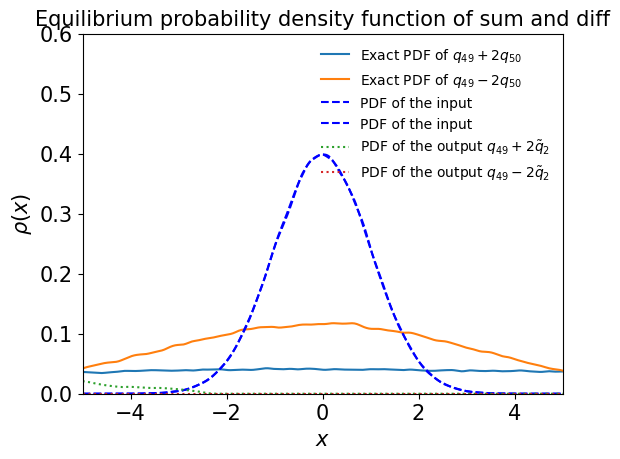

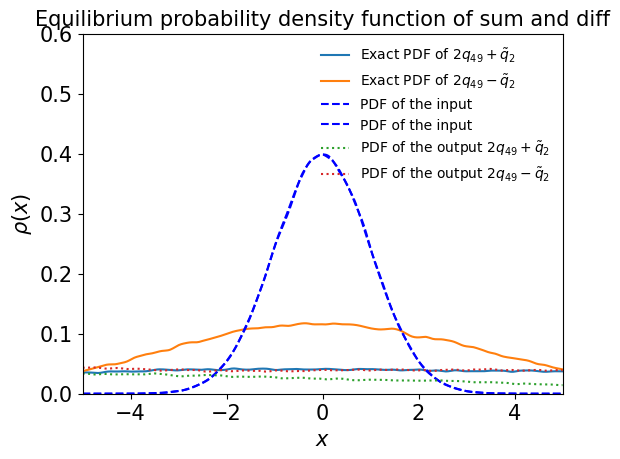

In [71]:
test3(model3)

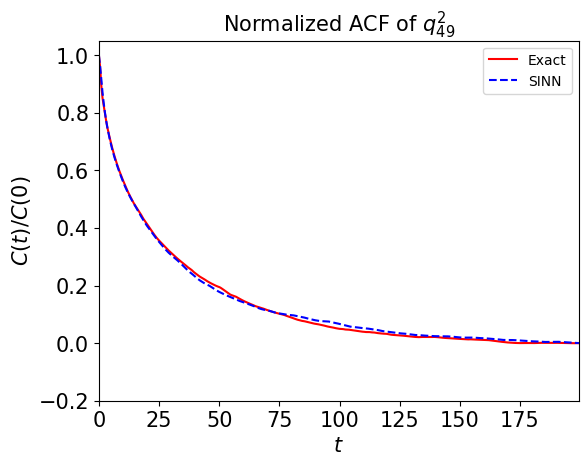

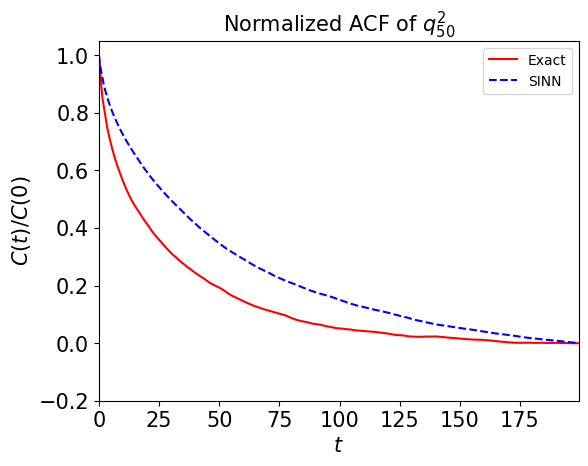

In [72]:
test4(model3)

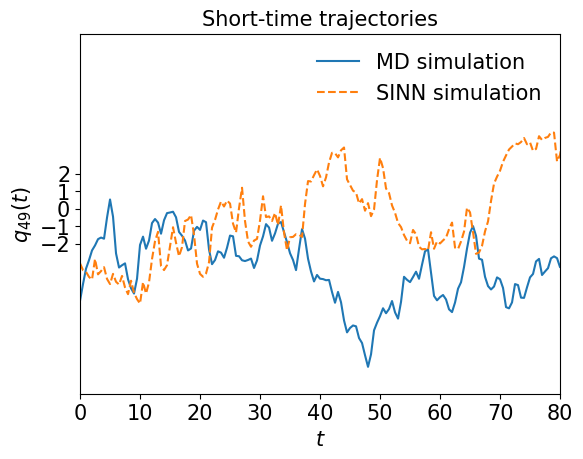

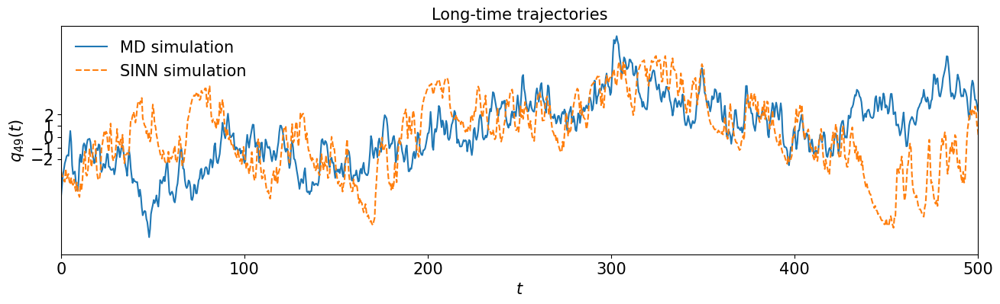

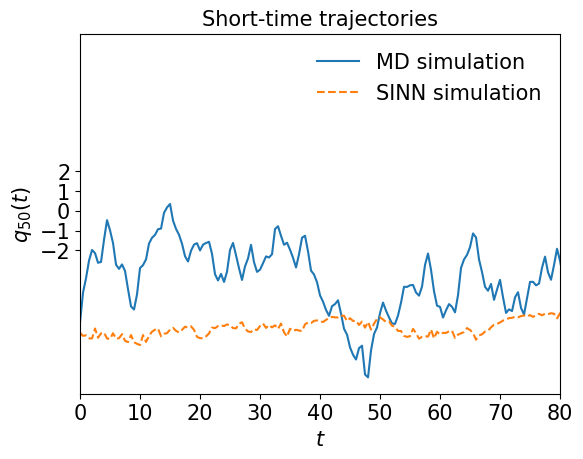

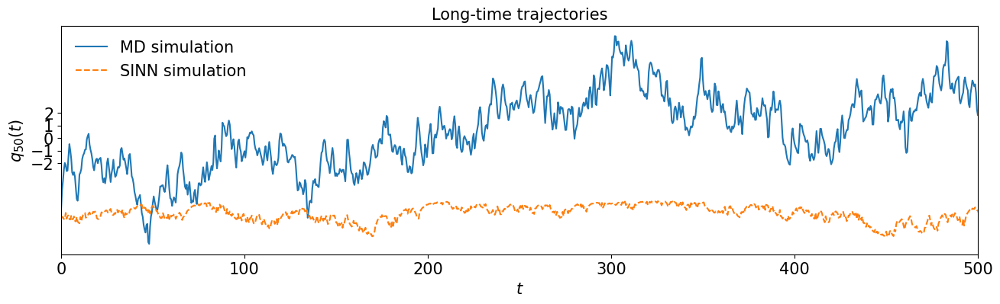

In [73]:
test5(model3)

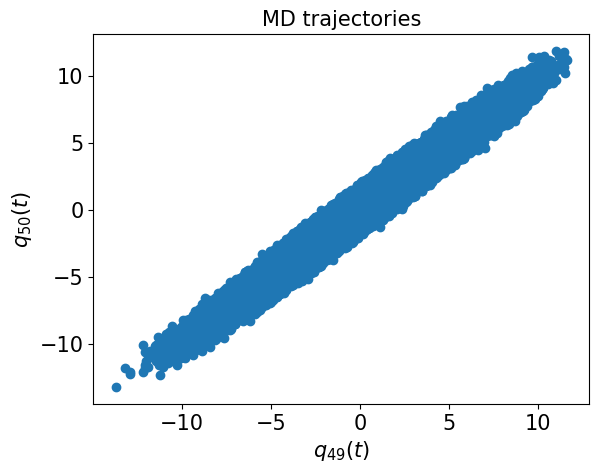

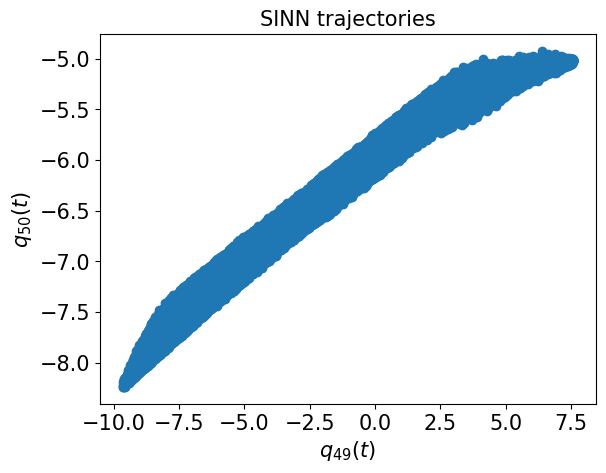

In [74]:
test6(model3)

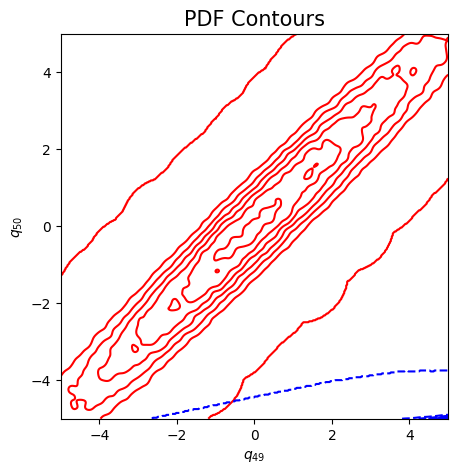

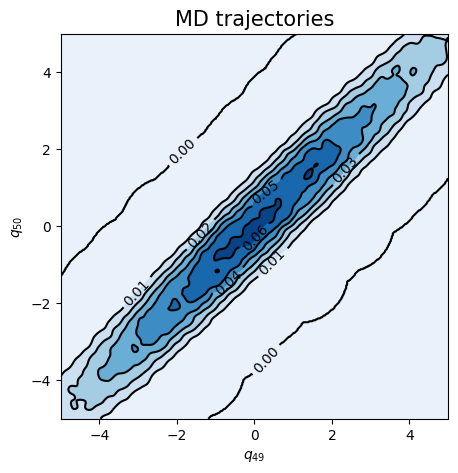

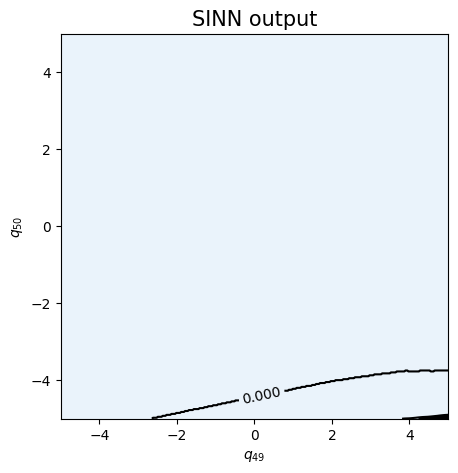

In [75]:
test7(model3)

In [76]:
### Defining SINN model
net4 = SINN(2, 50, 2, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model4 = Model(net=net4)
model4.train()

[0]-th step loss: 0.8488, 0.8349, acf: 0.10057, ccf: 0.10864, pdf: 0.29293, pdf2: 0.28888, acf2: 0.04387
[50]-th step loss: 0.0858, 0.0848, acf: 0.02424, ccf: 0.02755, pdf: 0.02015, pdf2: 0.00836, acf2: 0.00455
[100]-th step loss: 0.0546, 0.0277, acf: 0.00575, ccf: 0.00916, pdf: 0.00694, pdf2: 0.00507, acf2: 0.00080
[150]-th step loss: 0.0407, 0.0311, acf: 0.00311, ccf: 0.00300, pdf: 0.01465, pdf2: 0.00735, acf2: 0.00299
[200]-th step loss: 0.0632, 0.0748, acf: 0.02265, ccf: 0.02252, pdf: 0.01860, pdf2: 0.00694, acf2: 0.00410
[250]-th step loss: 0.0371, 0.0362, acf: 0.01200, ccf: 0.01211, pdf: 0.00790, pdf2: 0.00284, acf2: 0.00137
[300]-th step loss: 0.0300, 0.0264, acf: 0.00970, ccf: 0.01008, pdf: 0.00448, pdf2: 0.00160, acf2: 0.00053
[350]-th step loss: 0.0080, 0.0159, acf: 0.00597, ccf: 0.00585, pdf: 0.00323, pdf2: 0.00046, acf2: 0.00039
[400]-th step loss: 0.1597, 0.1449, acf: 0.05056, ccf: 0.06832, pdf: 0.01028, pdf2: 0.00419, acf2: 0.01154
[450]-th step loss: 0.0595, 0.0509, acf:

[3850]-th step loss: 0.0334, 0.0433, acf: 0.01547, ccf: 0.01571, pdf: 0.00826, pdf2: 0.00380, acf2: 0.00009
[3900]-th step loss: 0.0367, 0.0459, acf: 0.01677, ccf: 0.01702, pdf: 0.00826, pdf2: 0.00365, acf2: 0.00019
[3950]-th step loss: 0.0387, 0.0422, acf: 0.01473, ccf: 0.01513, pdf: 0.00828, pdf2: 0.00400, acf2: 0.00007
[4000]-th step loss: 0.0406, 0.0470, acf: 0.01728, ccf: 0.01758, pdf: 0.00826, pdf2: 0.00366, acf2: 0.00022
[4050]-th step loss: 0.0384, 0.0473, acf: 0.01747, ccf: 0.01772, pdf: 0.00826, pdf2: 0.00371, acf2: 0.00019
[4100]-th step loss: 0.0357, 0.0489, acf: 0.01824, ccf: 0.01848, pdf: 0.00826, pdf2: 0.00371, acf2: 0.00021
[4150]-th step loss: 0.0401, 0.0442, acf: 0.01591, ccf: 0.01623, pdf: 0.00827, pdf2: 0.00374, acf2: 0.00005
[4200]-th step loss: 0.0406, 0.0440, acf: 0.01582, ccf: 0.01601, pdf: 0.00826, pdf2: 0.00379, acf2: 0.00014
[4250]-th step loss: 0.0441, 0.0421, acf: 0.01492, ccf: 0.01514, pdf: 0.00827, pdf2: 0.00371, acf2: 0.00008
[4300]-th step loss: 0.0415,

[7650]-th step loss: 0.0418, 0.0422, acf: 0.01503, ccf: 0.01504, pdf: 0.00829, pdf2: 0.00374, acf2: 0.00009
[7700]-th step loss: 0.0376, 0.0427, acf: 0.01506, ccf: 0.01506, pdf: 0.00829, pdf2: 0.00424, acf2: 0.00010
[7750]-th step loss: 0.0360, 0.0442, acf: 0.01602, ccf: 0.01608, pdf: 0.00829, pdf2: 0.00380, acf2: 0.00006
[7800]-th step loss: 0.0416, 0.0445, acf: 0.01617, ccf: 0.01618, pdf: 0.00829, pdf2: 0.00374, acf2: 0.00013
[7850]-th step loss: 0.0326, 0.0431, acf: 0.01550, ccf: 0.01551, pdf: 0.00829, pdf2: 0.00368, acf2: 0.00013
[7900]-th step loss: 0.0340, 0.0421, acf: 0.01498, ccf: 0.01501, pdf: 0.00829, pdf2: 0.00370, acf2: 0.00010
[7950]-th step loss: 0.0392, 0.0490, acf: 0.01834, ccf: 0.01832, pdf: 0.00829, pdf2: 0.00365, acf2: 0.00037
[8000]-th step loss: 0.0447, 0.0434, acf: 0.01565, ccf: 0.01565, pdf: 0.00829, pdf2: 0.00367, acf2: 0.00017
[8050]-th step loss: 0.0347, 0.0453, acf: 0.01657, ccf: 0.01655, pdf: 0.00829, pdf2: 0.00365, acf2: 0.00020
[8100]-th step loss: 0.0445,

[11450]-th step loss: 0.0329, 0.0376, acf: 0.00154, ccf: 0.00205, pdf: 0.00825, pdf2: 0.00398, acf2: 0.02175
[11500]-th step loss: 0.0316, 0.0324, acf: 0.00157, ccf: 0.00217, pdf: 0.00829, pdf2: 0.01081, acf2: 0.00953
[11550]-th step loss: 0.0379, 0.0305, acf: 0.00099, ccf: 0.00144, pdf: 0.00829, pdf2: 0.00880, acf2: 0.01097
[11600]-th step loss: 0.0366, 0.0365, acf: 0.00104, ccf: 0.00147, pdf: 0.00829, pdf2: 0.00974, acf2: 0.01593
[11650]-th step loss: 0.0343, 0.0342, acf: 0.00051, ccf: 0.00073, pdf: 0.00829, pdf2: 0.01011, acf2: 0.01457
[11700]-th step loss: 0.0719, 0.0633, acf: 0.01068, ccf: 0.01138, pdf: 0.00829, pdf2: 0.01176, acf2: 0.02123
[11750]-th step loss: 0.0466, 0.0445, acf: 0.00535, ccf: 0.00608, pdf: 0.00829, pdf2: 0.00700, acf2: 0.01781
[11800]-th step loss: 0.0349, 0.0342, acf: 0.00284, ccf: 0.00293, pdf: 0.00829, pdf2: 0.00620, acf2: 0.01392
[11850]-th step loss: 0.0281, 0.0271, acf: 0.00112, ccf: 0.00168, pdf: 0.00825, pdf2: 0.00412, acf2: 0.01196
[11900]-th step los

[15250]-th step loss: 0.0213, 0.0236, acf: 0.00006, ccf: 0.00005, pdf: 0.00829, pdf2: 0.00415, acf2: 0.01109
[15300]-th step loss: 0.0314, 0.0232, acf: 0.00043, ccf: 0.00042, pdf: 0.00829, pdf2: 0.00511, acf2: 0.00897
[15350]-th step loss: 0.0380, 0.0353, acf: 0.00094, ccf: 0.00095, pdf: 0.00828, pdf2: 0.00605, acf2: 0.01911
[15400]-th step loss: 0.0237, 0.0269, acf: 0.00007, ccf: 0.00007, pdf: 0.00829, pdf2: 0.00377, acf2: 0.01469
[15450]-th step loss: 0.0286, 0.0286, acf: 0.00005, ccf: 0.00005, pdf: 0.00828, pdf2: 0.00713, acf2: 0.01310
[15500]-th step loss: 0.0302, 0.0262, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00402, acf2: 0.01380
[15550]-th step loss: 0.0294, 0.0230, acf: 0.00012, ccf: 0.00012, pdf: 0.00829, pdf2: 0.00384, acf2: 0.01065
[15600]-th step loss: 0.0249, 0.0210, acf: 0.00037, ccf: 0.00037, pdf: 0.00829, pdf2: 0.00397, acf2: 0.00804
[15650]-th step loss: 0.0227, 0.0222, acf: 0.00016, ccf: 0.00016, pdf: 0.00829, pdf2: 0.00391, acf2: 0.00970
[15700]-th step los

[19050]-th step loss: 0.1536, 0.1505, acf: 0.07119, ccf: 0.06741, pdf: 0.00817, pdf2: 0.00355, acf2: 0.00015
[19100]-th step loss: 0.1513, 0.1461, acf: 0.06954, ccf: 0.06468, pdf: 0.00818, pdf2: 0.00354, acf2: 0.00014
[19150]-th step loss: 0.1345, 0.1407, acf: 0.06746, ccf: 0.06123, pdf: 0.00816, pdf2: 0.00366, acf2: 0.00023
[19200]-th step loss: 0.1385, 0.1362, acf: 0.06571, ccf: 0.05806, pdf: 0.00816, pdf2: 0.00382, acf2: 0.00045
[19250]-th step loss: 0.1357, 0.1271, acf: 0.06108, ccf: 0.05287, pdf: 0.00863, pdf2: 0.00419, acf2: 0.00034
[19300]-th step loss: 0.1373, 0.1280, acf: 0.06231, ccf: 0.05381, pdf: 0.00773, pdf2: 0.00405, acf2: 0.00011
[19350]-th step loss: 0.1125, 0.1203, acf: 0.05918, ccf: 0.04847, pdf: 0.00780, pdf2: 0.00420, acf2: 0.00069
[19400]-th step loss: 0.1124, 0.1186, acf: 0.05861, ccf: 0.04779, pdf: 0.00753, pdf2: 0.00413, acf2: 0.00050
[19450]-th step loss: 0.1235, 0.1162, acf: 0.05595, ccf: 0.04635, pdf: 0.00727, pdf2: 0.00622, acf2: 0.00037
[19500]-th step los

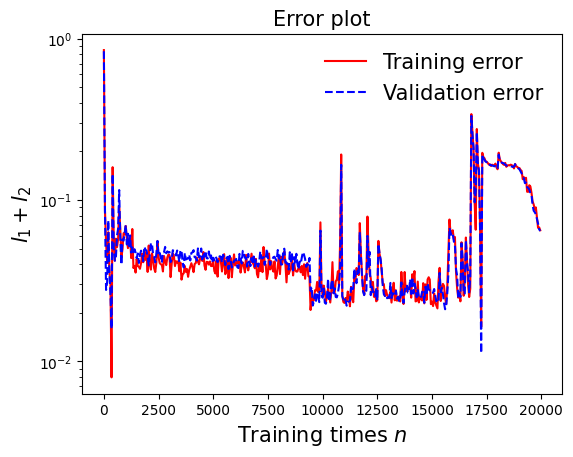

In [77]:
draw_loss(model4)

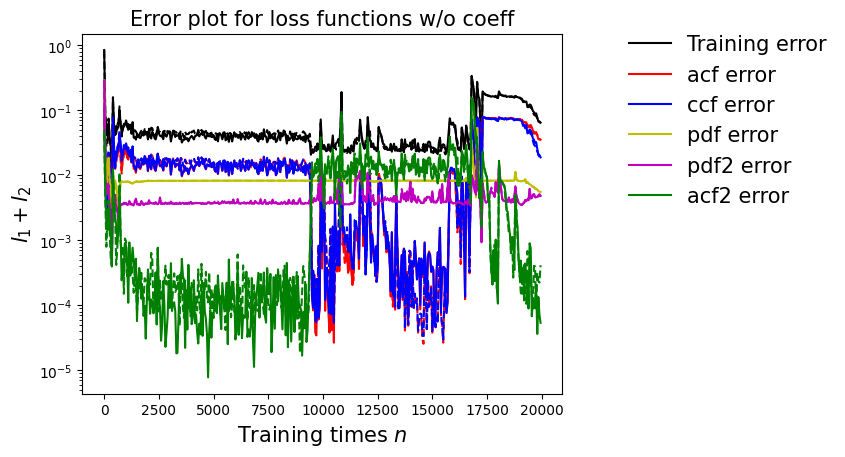

In [78]:
draw_errors(model4)

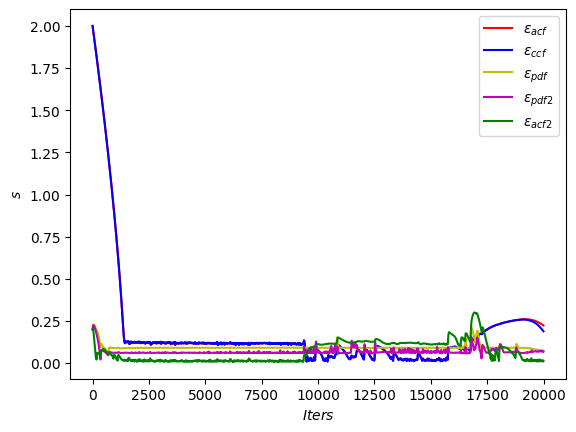

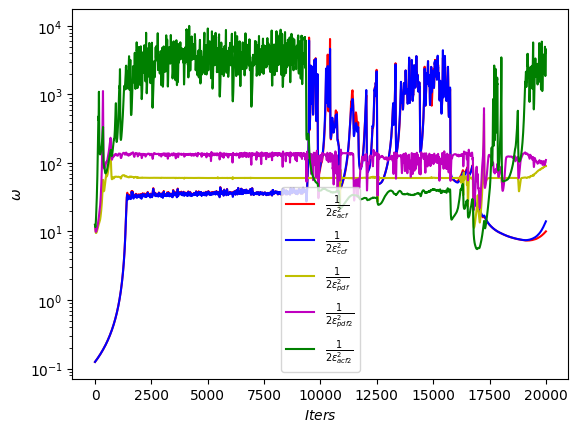

In [79]:
draw_adaptive_w(model4)
draw_epoch_w(model4)

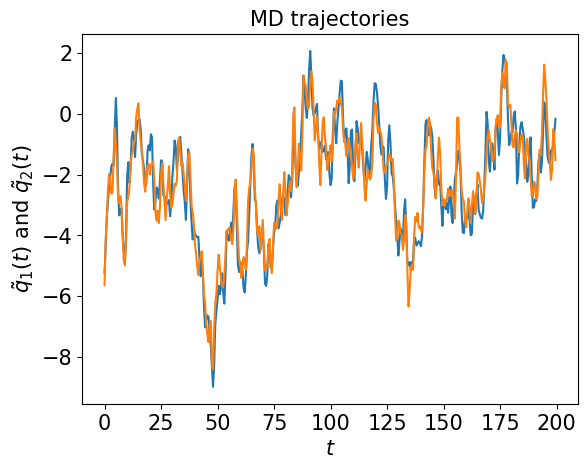

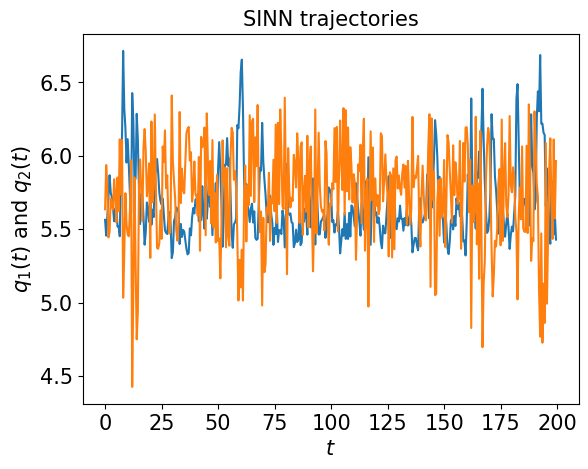

In [80]:
test1(model4)

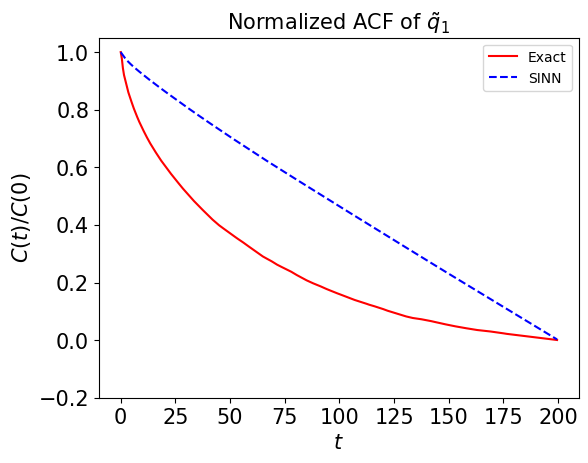

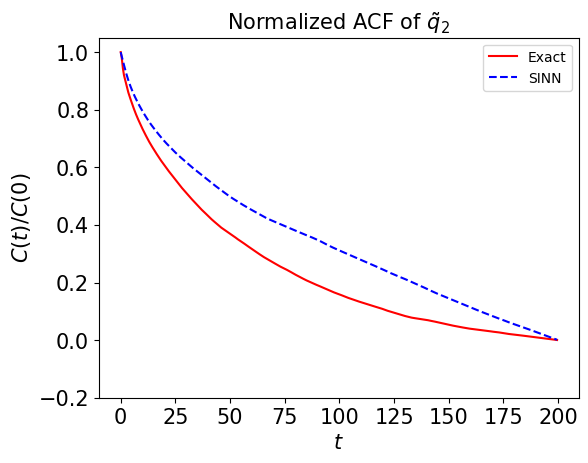

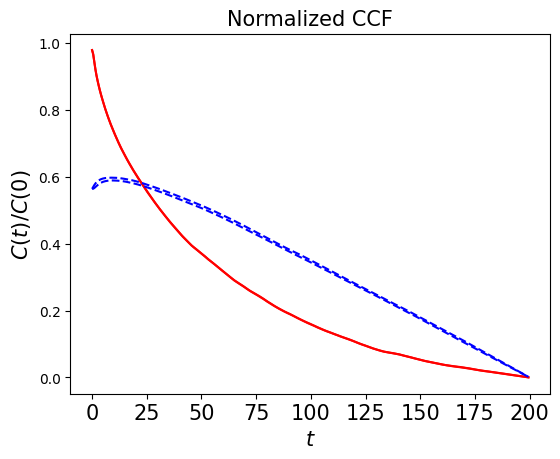

In [81]:
test2(model4)

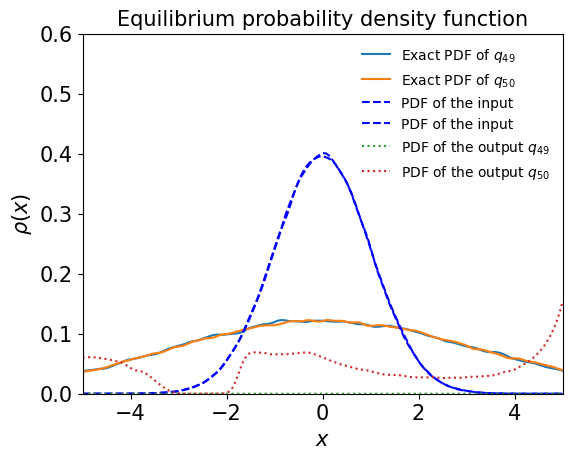

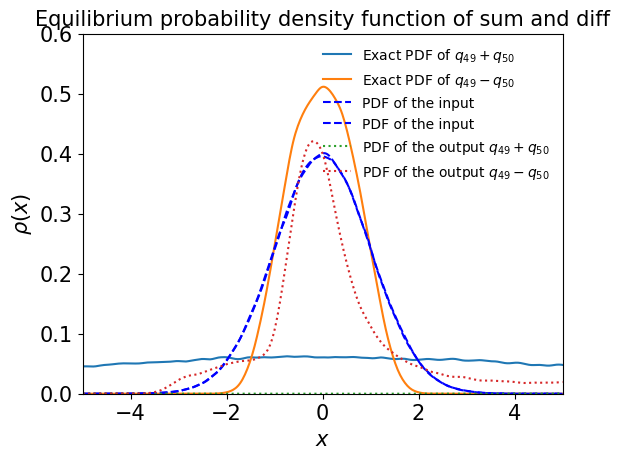

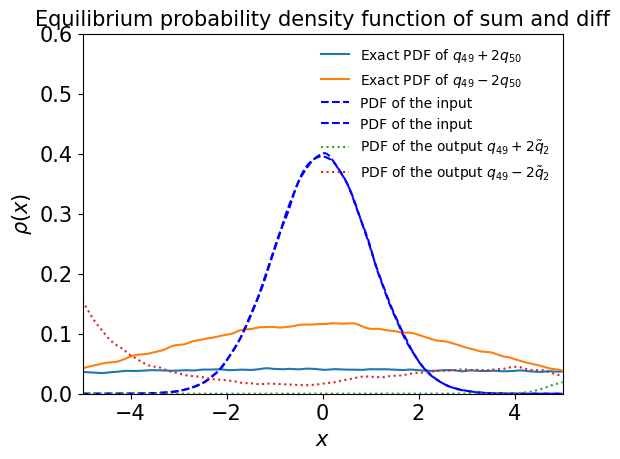

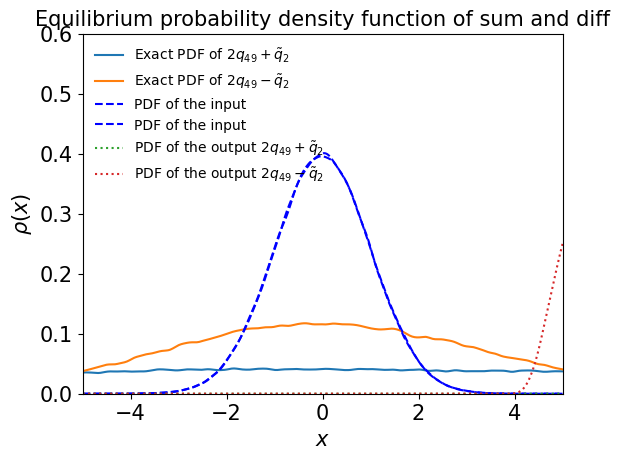

In [82]:
test3(model4)

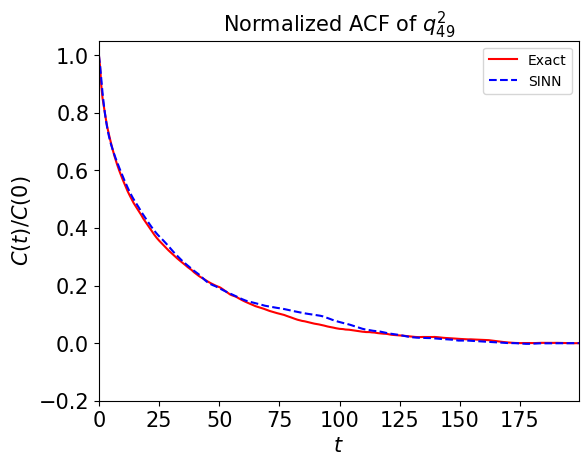

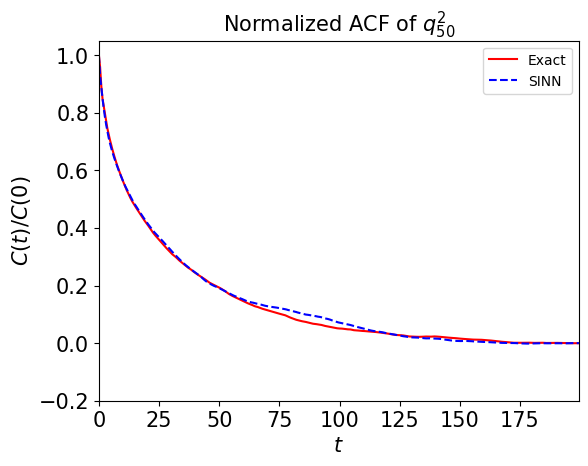

In [83]:
test4(model4)

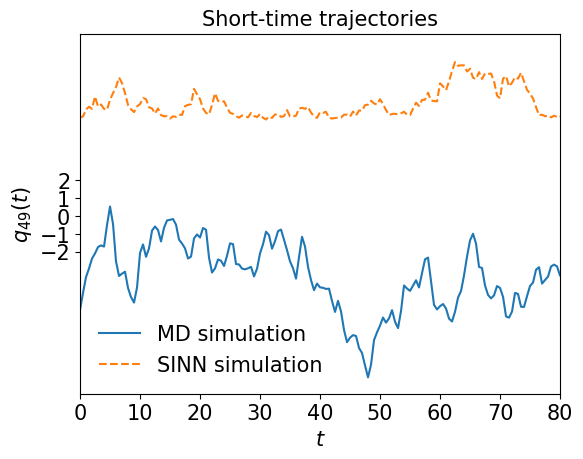

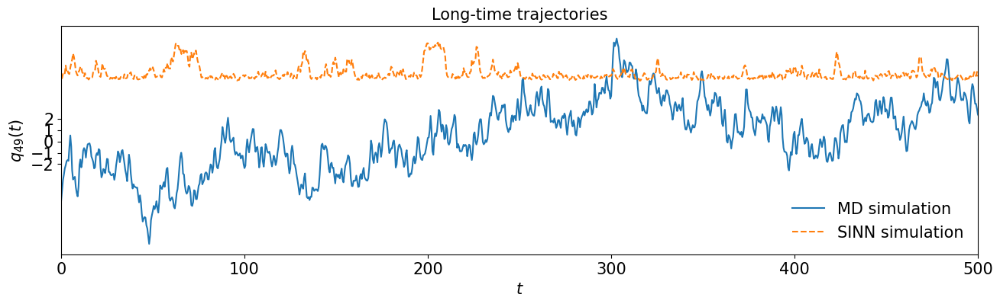

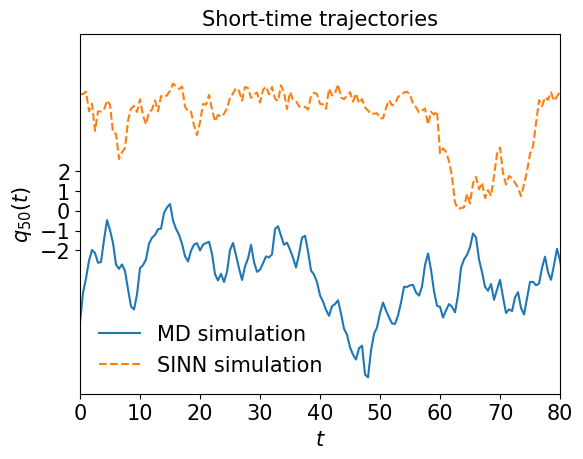

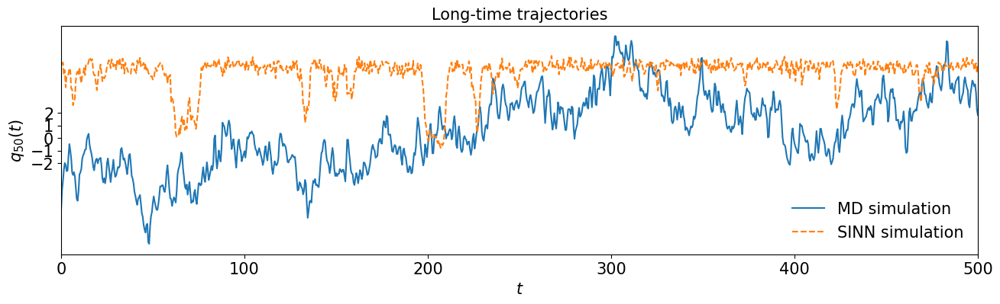

In [84]:
test5(model4)

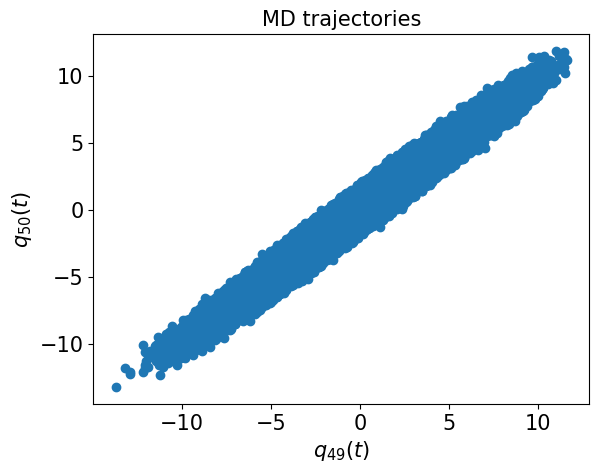

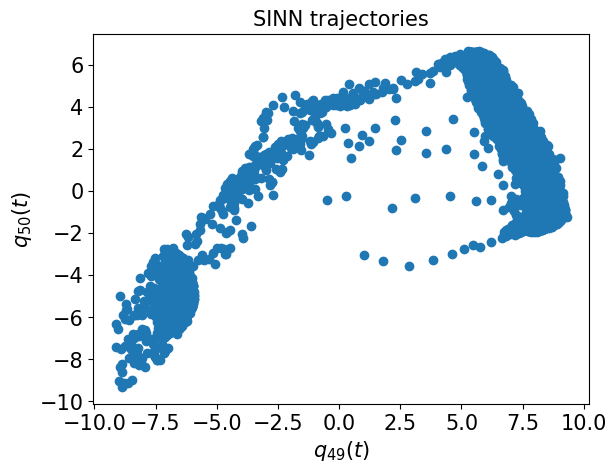

In [85]:
test6(model4)

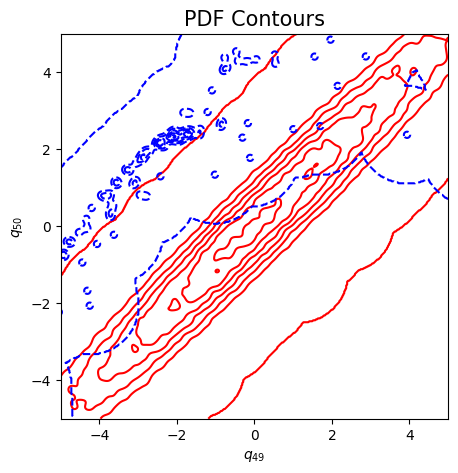

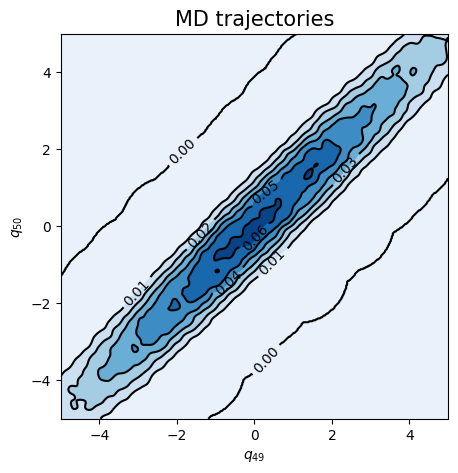

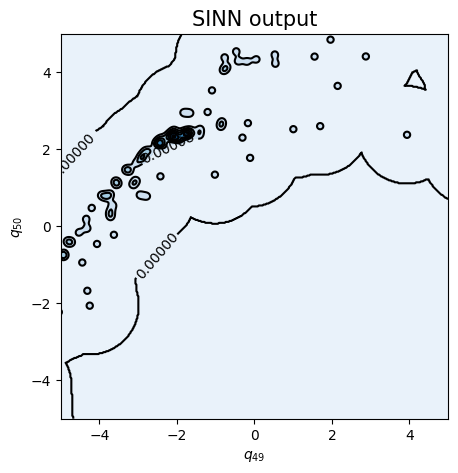

In [86]:
test7(model4)

In [87]:
### Defining SINN model
net5 = SINN(2, 50, 2, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model5 = Model(net=net5)
model5.train()

[0]-th step loss: 0.8587, 0.8584, acf: 0.10110, ccf: 0.13253, pdf: 0.29249, pdf2: 0.28789, acf2: 0.04434
[50]-th step loss: 0.4110, 0.3899, acf: 0.03367, ccf: 0.29651, pdf: 0.02350, pdf2: 0.03299, acf2: 0.00328
[100]-th step loss: 0.3598, 0.3352, acf: 0.03918, ccf: 0.26853, pdf: 0.00721, pdf2: 0.01796, acf2: 0.00236
[150]-th step loss: 0.3226, 0.3226, acf: 0.07912, ccf: 0.18444, pdf: 0.01218, pdf2: 0.02415, acf2: 0.02274
[200]-th step loss: 0.3907, 0.3823, acf: 0.01918, ccf: 0.33770, pdf: 0.00789, pdf2: 0.01581, acf2: 0.00172
[250]-th step loss: 0.3652, 0.3637, acf: 0.02474, ccf: 0.31852, pdf: 0.00481, pdf2: 0.01289, acf2: 0.00275
[300]-th step loss: 0.3925, 0.3796, acf: 0.01341, ccf: 0.35054, pdf: 0.00280, pdf2: 0.01235, acf2: 0.00050
[350]-th step loss: 0.3428, 0.3405, acf: 0.02497, ccf: 0.30013, pdf: 0.00252, pdf2: 0.01166, acf2: 0.00117
[400]-th step loss: 0.3467, 0.3522, acf: 0.01806, ccf: 0.32003, pdf: 0.00005, pdf2: 0.01348, acf2: 0.00055
[450]-th step loss: 0.3139, 0.3277, acf:

[3850]-th step loss: 0.0321, 0.0359, acf: 0.00005, ccf: 0.00005, pdf: 0.00829, pdf2: 0.01251, acf2: 0.01496
[3900]-th step loss: 0.0377, 0.0383, acf: 0.00013, ccf: 0.00014, pdf: 0.00829, pdf2: 0.01273, acf2: 0.01705
[3950]-th step loss: 0.0360, 0.0444, acf: 0.00069, ccf: 0.00071, pdf: 0.00829, pdf2: 0.01310, acf2: 0.02161
[4000]-th step loss: 0.0350, 0.0369, acf: 0.00009, ccf: 0.00009, pdf: 0.00829, pdf2: 0.01198, acf2: 0.01646
[4050]-th step loss: 0.0385, 0.0401, acf: 0.00017, ccf: 0.00018, pdf: 0.00829, pdf2: 0.01359, acf2: 0.01786
[4100]-th step loss: 0.0342, 0.0379, acf: 0.00018, ccf: 0.00019, pdf: 0.00829, pdf2: 0.01265, acf2: 0.01655
[4150]-th step loss: 0.0373, 0.0405, acf: 0.00013, ccf: 0.00014, pdf: 0.00829, pdf2: 0.01596, acf2: 0.01595
[4200]-th step loss: 0.0383, 0.0418, acf: 0.00026, ccf: 0.00027, pdf: 0.00829, pdf2: 0.01464, acf2: 0.01832
[4250]-th step loss: 0.0397, 0.0426, acf: 0.00039, ccf: 0.00040, pdf: 0.00829, pdf2: 0.01379, acf2: 0.01977
[4300]-th step loss: 0.0365,

[7650]-th step loss: 0.0325, 0.0370, acf: 0.00007, ccf: 0.00007, pdf: 0.00829, pdf2: 0.01237, acf2: 0.01619
[7700]-th step loss: 0.0313, 0.0359, acf: 0.00004, ccf: 0.00004, pdf: 0.00829, pdf2: 0.01212, acf2: 0.01538
[7750]-th step loss: 0.0344, 0.0388, acf: 0.00023, ccf: 0.00024, pdf: 0.00829, pdf2: 0.01162, acf2: 0.01838
[7800]-th step loss: 0.0355, 0.0401, acf: 0.00037, ccf: 0.00038, pdf: 0.00829, pdf2: 0.01164, acf2: 0.01942
[7850]-th step loss: 0.0341, 0.0393, acf: 0.00026, ccf: 0.00027, pdf: 0.00829, pdf2: 0.01181, acf2: 0.01864
[7900]-th step loss: 0.0356, 0.0373, acf: 0.00014, ccf: 0.00015, pdf: 0.00829, pdf2: 0.01160, acf2: 0.01716
[7950]-th step loss: 0.0362, 0.0376, acf: 0.00012, ccf: 0.00013, pdf: 0.00829, pdf2: 0.01187, acf2: 0.01715
[8000]-th step loss: 0.0413, 0.0384, acf: 0.00025, ccf: 0.00025, pdf: 0.00829, pdf2: 0.01150, acf2: 0.01815
[8050]-th step loss: 0.0340, 0.0337, acf: 0.00006, ccf: 0.00005, pdf: 0.00829, pdf2: 0.01198, acf2: 0.01335
[8100]-th step loss: 0.0350,

[11450]-th step loss: 0.0346, 0.0351, acf: 0.00005, ccf: 0.00005, pdf: 0.00829, pdf2: 0.01099, acf2: 0.01572
[11500]-th step loss: 0.0346, 0.0356, acf: 0.00007, ccf: 0.00008, pdf: 0.00829, pdf2: 0.01124, acf2: 0.01595
[11550]-th step loss: 0.0377, 0.0402, acf: 0.00038, ccf: 0.00040, pdf: 0.00829, pdf2: 0.01157, acf2: 0.01960
[11600]-th step loss: 0.0352, 0.0357, acf: 0.00005, ccf: 0.00004, pdf: 0.00829, pdf2: 0.01192, acf2: 0.01543
[11650]-th step loss: 0.0352, 0.0416, acf: 0.00065, ccf: 0.00067, pdf: 0.00829, pdf2: 0.01101, acf2: 0.02102
[11700]-th step loss: 0.0337, 0.0368, acf: 0.00015, ccf: 0.00016, pdf: 0.00829, pdf2: 0.01075, acf2: 0.01742
[11750]-th step loss: 0.0317, 0.0346, acf: 0.00012, ccf: 0.00012, pdf: 0.00829, pdf2: 0.01044, acf2: 0.01561
[11800]-th step loss: 0.0361, 0.0410, acf: 0.00065, ccf: 0.00066, pdf: 0.00829, pdf2: 0.01072, acf2: 0.02065
[11850]-th step loss: 0.0354, 0.0404, acf: 0.00053, ccf: 0.00054, pdf: 0.00829, pdf2: 0.01143, acf2: 0.01959
[11900]-th step los

[15250]-th step loss: 0.0355, 0.0369, acf: 0.00018, ccf: 0.00019, pdf: 0.00829, pdf2: 0.01100, acf2: 0.01728
[15300]-th step loss: 0.0355, 0.0336, acf: 0.00009, ccf: 0.00009, pdf: 0.00829, pdf2: 0.01016, acf2: 0.01496
[15350]-th step loss: 0.0336, 0.0349, acf: 0.00009, ccf: 0.00007, pdf: 0.00829, pdf2: 0.01056, acf2: 0.01590
[15400]-th step loss: 0.0316, 0.0336, acf: 0.00002, ccf: 0.00001, pdf: 0.00829, pdf2: 0.01056, acf2: 0.01472
[15450]-th step loss: 0.0313, 0.0387, acf: 0.00043, ccf: 0.00044, pdf: 0.00829, pdf2: 0.01004, acf2: 0.01954
[15500]-th step loss: 0.0344, 0.0382, acf: 0.00031, ccf: 0.00033, pdf: 0.00829, pdf2: 0.01043, acf2: 0.01886
[15550]-th step loss: 0.0304, 0.0308, acf: 0.00075, ccf: 0.00073, pdf: 0.00829, pdf2: 0.01192, acf2: 0.00912
[15600]-th step loss: 0.0346, 0.0337, acf: 0.00005, ccf: 0.00005, pdf: 0.00829, pdf2: 0.01077, acf2: 0.01457
[15650]-th step loss: 0.0319, 0.0387, acf: 0.00054, ccf: 0.00054, pdf: 0.00829, pdf2: 0.00996, acf2: 0.01939
[15700]-th step los

[19050]-th step loss: 0.0092, 0.0105, acf: 0.00071, ccf: 0.00215, pdf: 0.00476, pdf2: 0.00256, acf2: 0.00033
[19100]-th step loss: 0.0098, 0.0093, acf: 0.00035, ccf: 0.00203, pdf: 0.00389, pdf2: 0.00253, acf2: 0.00051
[19150]-th step loss: 0.0080, 0.0079, acf: 0.00098, ccf: 0.00184, pdf: 0.00174, pdf2: 0.00208, acf2: 0.00126
[19200]-th step loss: 0.0054, 0.0050, acf: 0.00045, ccf: 0.00109, pdf: 0.00146, pdf2: 0.00153, acf2: 0.00044
[19250]-th step loss: 0.0050, 0.0058, acf: 0.00055, ccf: 0.00086, pdf: 0.00113, pdf2: 0.00153, acf2: 0.00177
[19300]-th step loss: 0.0072, 0.0032, acf: 0.00031, ccf: 0.00038, pdf: 0.00104, pdf2: 0.00078, acf2: 0.00072
[19350]-th step loss: 0.0018, 0.0029, acf: 0.00053, ccf: 0.00057, pdf: 0.00082, pdf2: 0.00038, acf2: 0.00062
[19400]-th step loss: 0.0033, 0.0043, acf: 0.00022, ccf: 0.00027, pdf: 0.00206, pdf2: 0.00112, acf2: 0.00061
[19450]-th step loss: 0.0013, 0.0017, acf: 0.00025, ccf: 0.00029, pdf: 0.00043, pdf2: 0.00025, acf2: 0.00044
[19500]-th step los

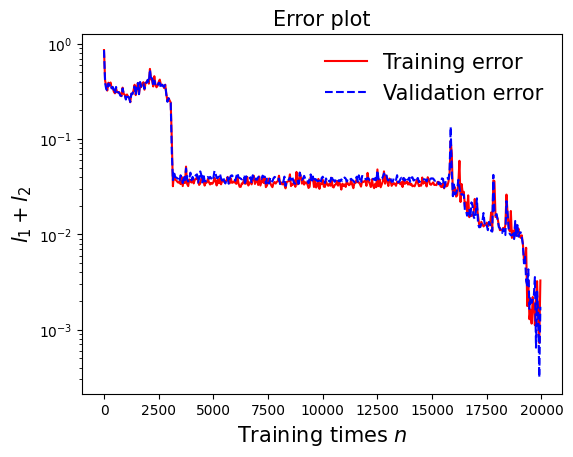

In [88]:
draw_loss(model5)

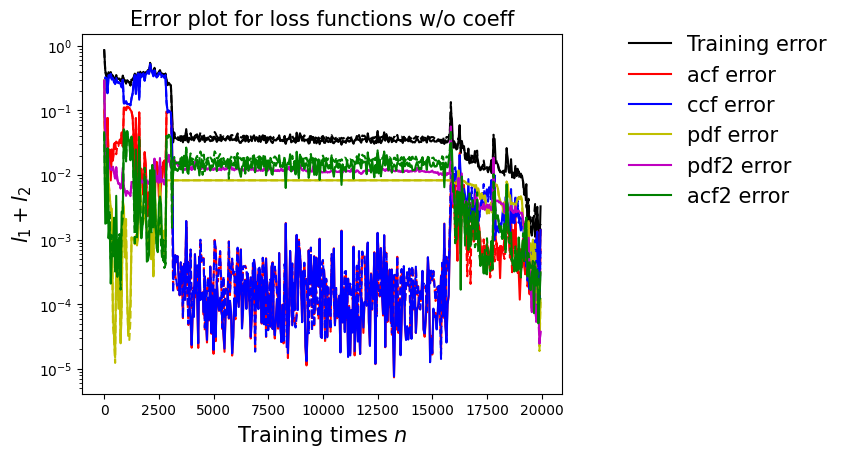

In [89]:
draw_errors(model5)

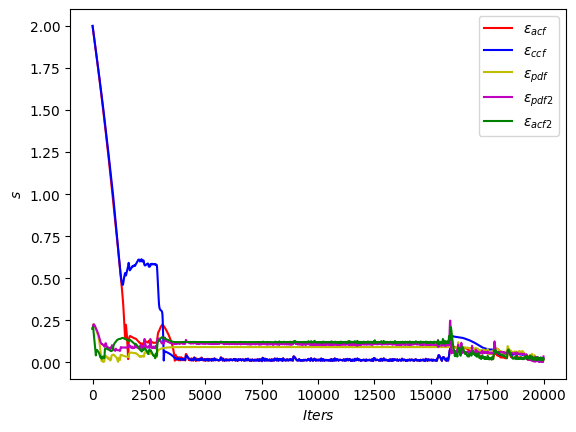

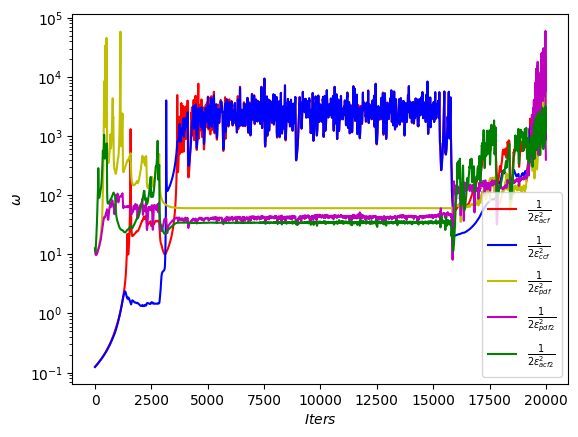

In [90]:
draw_adaptive_w(model5)
draw_epoch_w(model5)

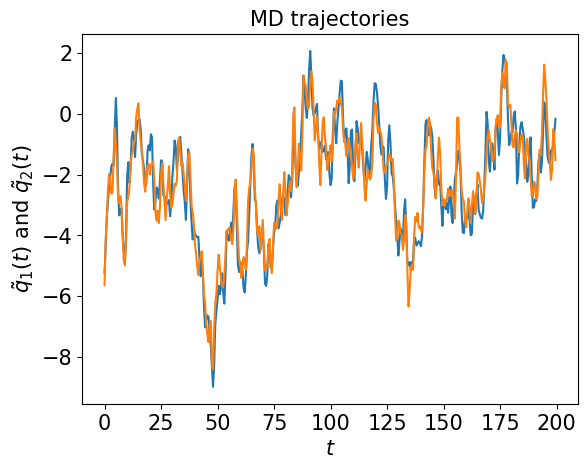

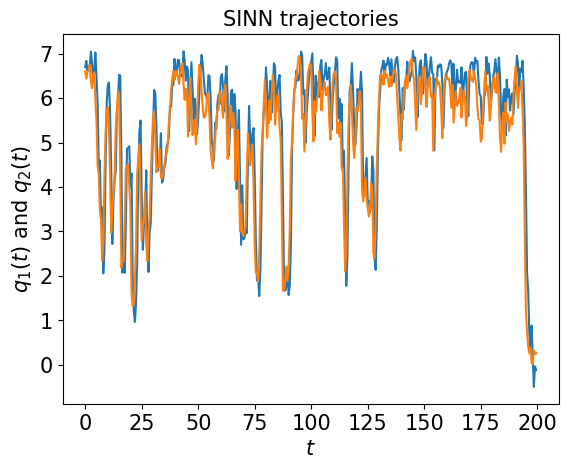

In [91]:
test1(model5)

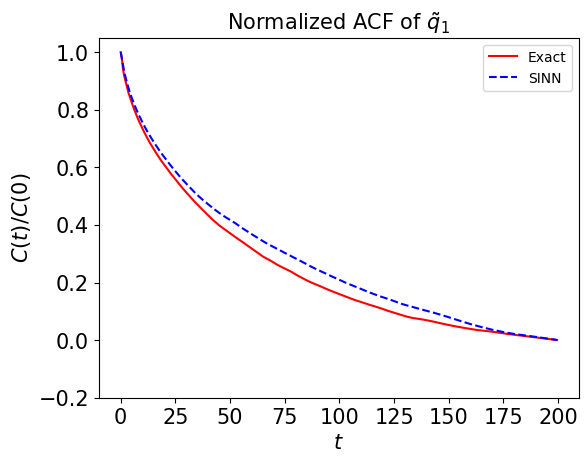

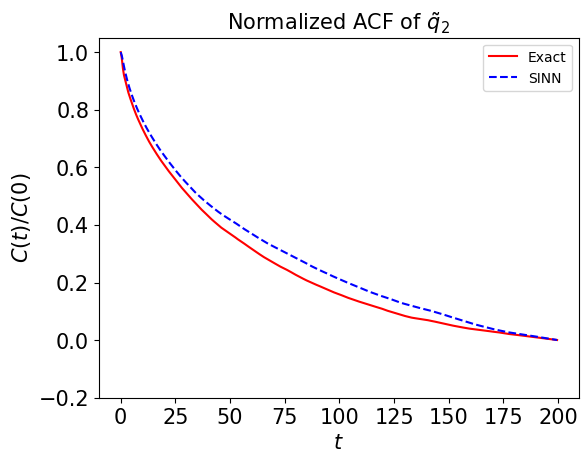

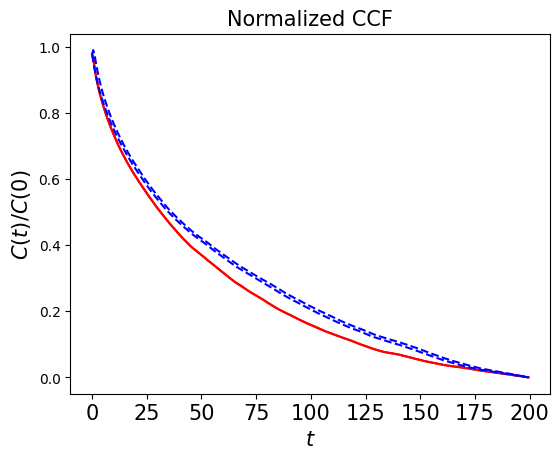

In [92]:
test2(model5)

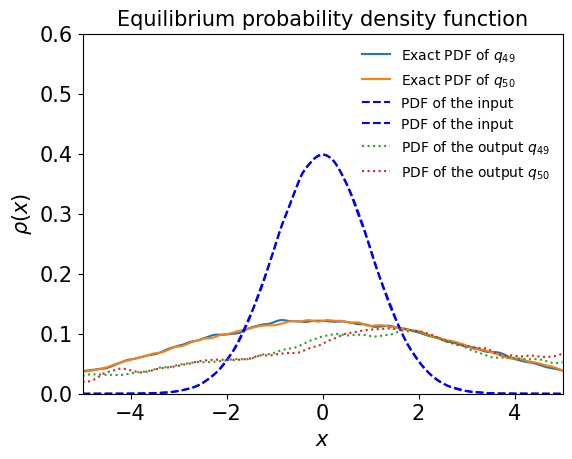

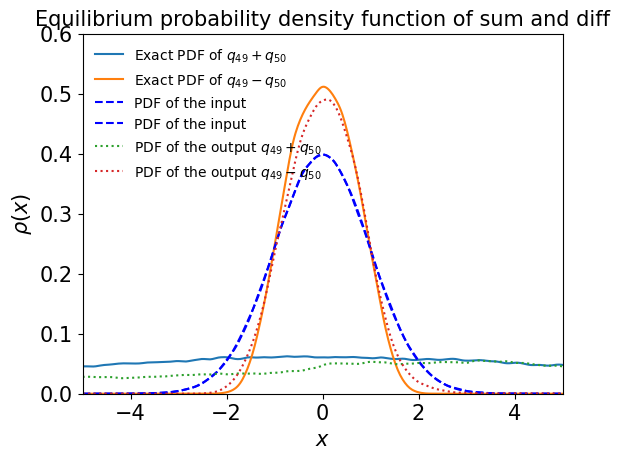

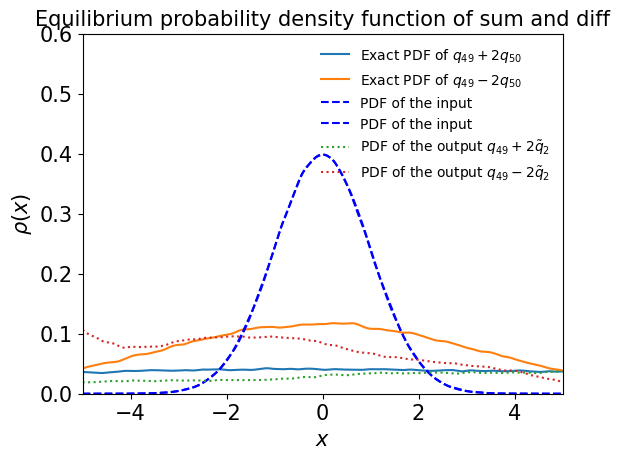

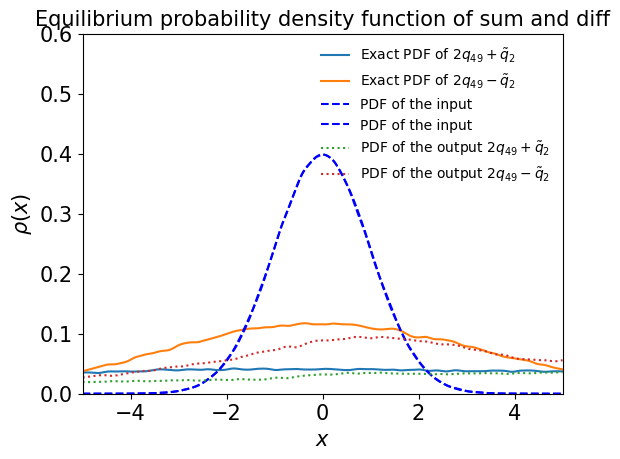

In [93]:
test3(model5)

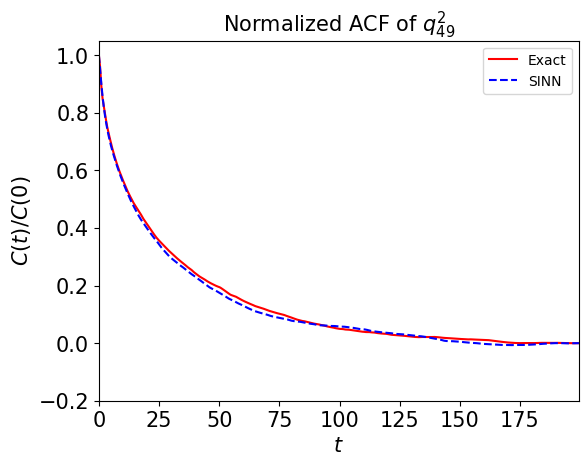

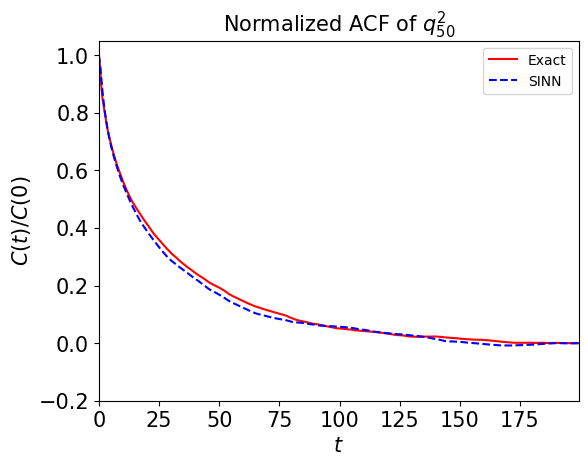

In [94]:
test4(model5)

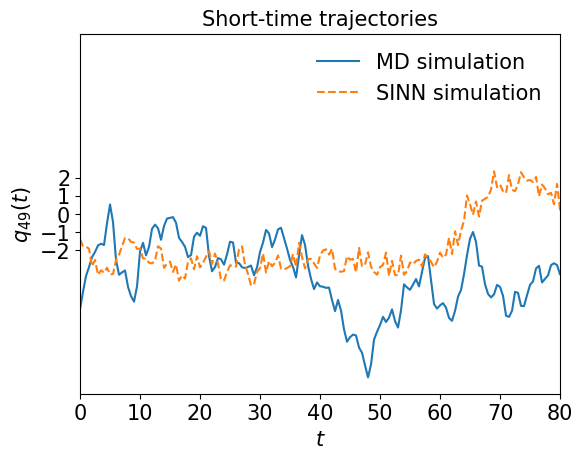

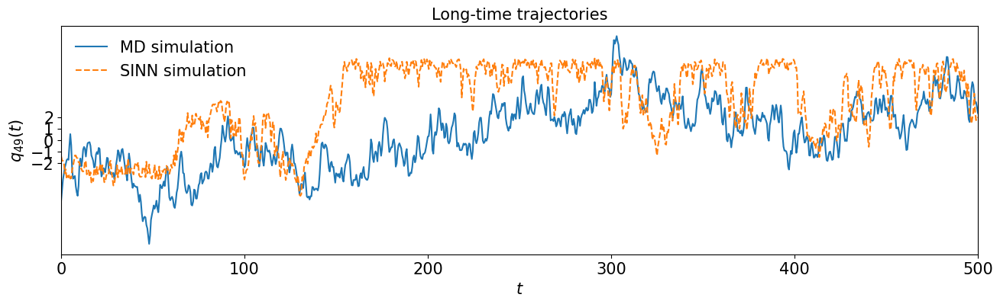

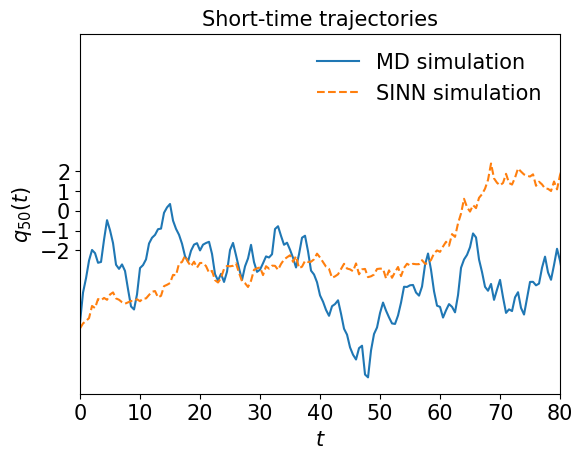

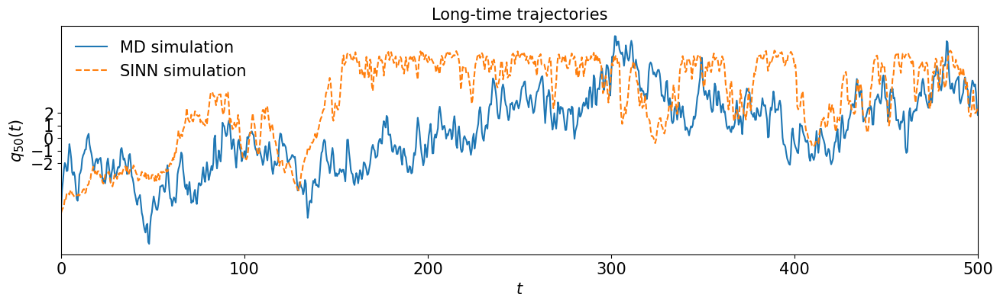

In [95]:
test5(model5)

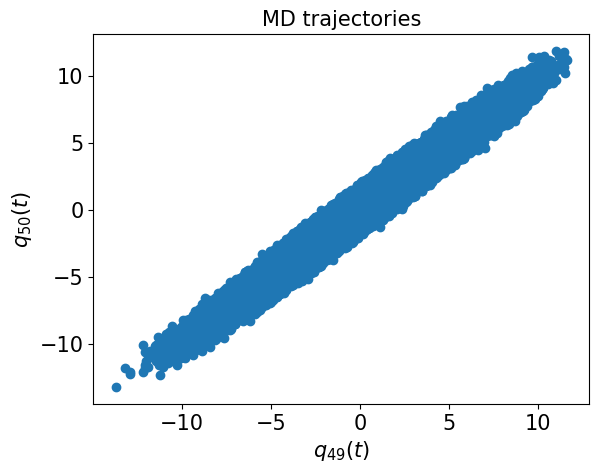

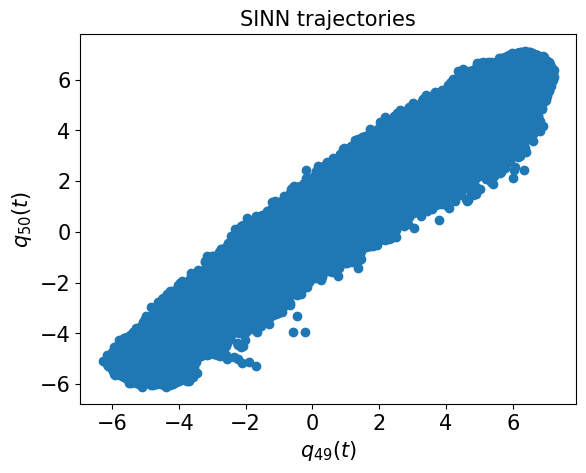

In [96]:
test6(model5)

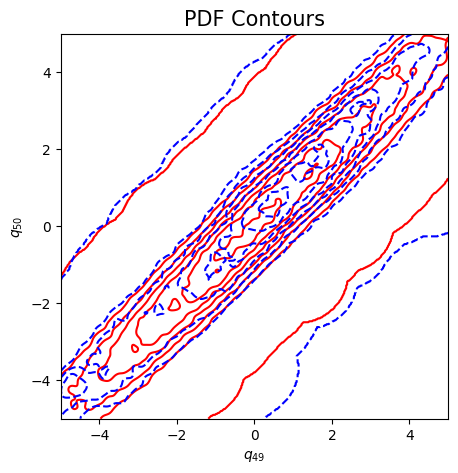

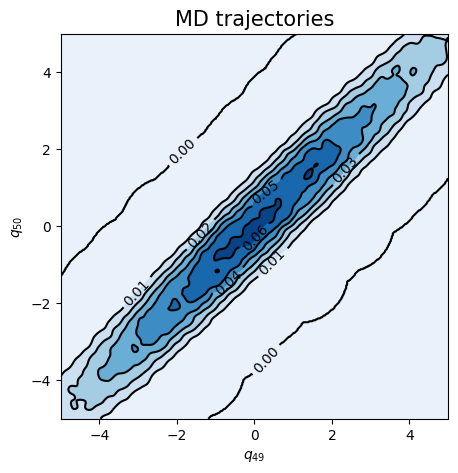

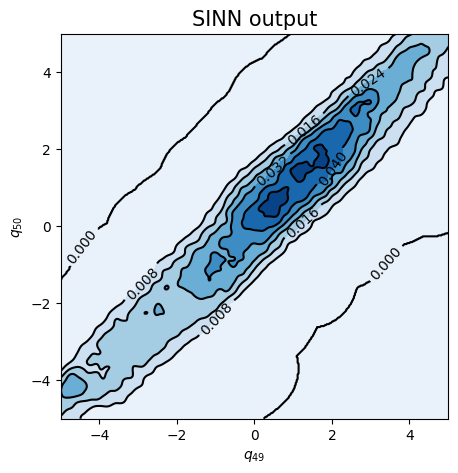

In [97]:
test7(model5)

In [98]:
### Defining SINN model
net6 = SINN(2, 50, 2, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model6 = Model(net=net6)
model6.train()

[0]-th step loss: 0.8634, 0.8615, acf: 0.10187, ccf: 0.13502, pdf: 0.29250, pdf2: 0.28708, acf2: 0.04503
[50]-th step loss: 0.3711, 0.3687, acf: 0.05856, ccf: 0.23794, pdf: 0.02146, pdf2: 0.02916, acf2: 0.02158
[100]-th step loss: 0.4639, 0.4315, acf: 0.00885, ccf: 0.39441, pdf: 0.00771, pdf2: 0.01878, acf2: 0.00175
[150]-th step loss: 0.4621, 0.4380, acf: 0.00448, ccf: 0.40388, pdf: 0.01017, pdf2: 0.01925, acf2: 0.00022
[200]-th step loss: 0.4297, 0.4184, acf: 0.00656, ccf: 0.38735, pdf: 0.00757, pdf2: 0.01677, acf2: 0.00015
[250]-th step loss: 0.4042, 0.4108, acf: 0.00782, ccf: 0.37869, pdf: 0.00928, pdf2: 0.01479, acf2: 0.00024
[300]-th step loss: 0.4181, 0.4027, acf: 0.00712, ccf: 0.37892, pdf: 0.00415, pdf2: 0.01215, acf2: 0.00032
[350]-th step loss: 0.3637, 0.3911, acf: 0.01028, ccf: 0.36254, pdf: 0.00634, pdf2: 0.01137, acf2: 0.00052
[400]-th step loss: 0.4172, 0.4162, acf: 0.00408, ccf: 0.40049, pdf: 0.00261, pdf2: 0.00859, acf2: 0.00044
[450]-th step loss: 0.4262, 0.4087, acf:

[3850]-th step loss: 0.3723, 0.3769, acf: 0.00802, ccf: 0.35419, pdf: 0.00483, pdf2: 0.00955, acf2: 0.00027
[3900]-th step loss: 0.3889, 0.3904, acf: 0.00607, ccf: 0.37095, pdf: 0.00435, pdf2: 0.00885, acf2: 0.00019
[3950]-th step loss: 0.3886, 0.3972, acf: 0.00527, ccf: 0.37801, pdf: 0.00437, pdf2: 0.00911, acf2: 0.00041
[4000]-th step loss: 0.3748, 0.3808, acf: 0.00759, ccf: 0.35974, pdf: 0.00437, pdf2: 0.00908, acf2: 0.00007
[4050]-th step loss: 0.3801, 0.3905, acf: 0.00611, ccf: 0.37016, pdf: 0.00469, pdf2: 0.00934, acf2: 0.00021
[4100]-th step loss: 0.3840, 0.3901, acf: 0.00626, ccf: 0.37057, pdf: 0.00434, pdf2: 0.00882, acf2: 0.00014
[4150]-th step loss: 0.3778, 0.3899, acf: 0.00657, ccf: 0.36939, pdf: 0.00459, pdf2: 0.00921, acf2: 0.00010
[4200]-th step loss: 0.3749, 0.3854, acf: 0.00693, ccf: 0.36528, pdf: 0.00435, pdf2: 0.00872, acf2: 0.00010
[4250]-th step loss: 0.3758, 0.3869, acf: 0.00695, ccf: 0.36610, pdf: 0.00466, pdf2: 0.00914, acf2: 0.00010
[4300]-th step loss: 0.3786,

[7650]-th step loss: 0.3872, 0.3884, acf: 0.00529, ccf: 0.37026, pdf: 0.00435, pdf2: 0.00826, acf2: 0.00019
[7700]-th step loss: 0.3773, 0.3846, acf: 0.00610, ccf: 0.36567, pdf: 0.00455, pdf2: 0.00819, acf2: 0.00009
[7750]-th step loss: 0.3808, 0.3891, acf: 0.00553, ccf: 0.37100, pdf: 0.00452, pdf2: 0.00795, acf2: 0.00012
[7800]-th step loss: 0.4008, 0.3941, acf: 0.00501, ccf: 0.37673, pdf: 0.00458, pdf2: 0.00754, acf2: 0.00020
[7850]-th step loss: 0.3923, 0.4008, acf: 0.00422, ccf: 0.38285, pdf: 0.00507, pdf2: 0.00833, acf2: 0.00031
[7900]-th step loss: 0.3862, 0.3899, acf: 0.00541, ccf: 0.37244, pdf: 0.00462, pdf2: 0.00732, acf2: 0.00014
[7950]-th step loss: 0.3753, 0.3836, acf: 0.00604, ccf: 0.36419, pdf: 0.00478, pdf2: 0.00844, acf2: 0.00017
[8000]-th step loss: 0.3667, 0.3748, acf: 0.00746, ccf: 0.35246, pdf: 0.00551, pdf2: 0.00919, acf2: 0.00013
[8050]-th step loss: 0.3837, 0.3888, acf: 0.00536, ccf: 0.36945, pdf: 0.00488, pdf2: 0.00877, acf2: 0.00036
[8100]-th step loss: 0.3814,

[11450]-th step loss: 0.3919, 0.4038, acf: 0.00401, ccf: 0.38794, pdf: 0.00474, pdf2: 0.00690, acf2: 0.00023
[11500]-th step loss: 0.3927, 0.4030, acf: 0.00326, ccf: 0.38801, pdf: 0.00476, pdf2: 0.00661, acf2: 0.00034
[11550]-th step loss: 0.3899, 0.3977, acf: 0.00330, ccf: 0.38279, pdf: 0.00492, pdf2: 0.00619, acf2: 0.00055
[11600]-th step loss: 0.3908, 0.3985, acf: 0.00414, ccf: 0.38182, pdf: 0.00475, pdf2: 0.00740, acf2: 0.00041
[11650]-th step loss: 0.3936, 0.3929, acf: 0.00427, ccf: 0.37642, pdf: 0.00480, pdf2: 0.00726, acf2: 0.00013
[11700]-th step loss: 0.3849, 0.3951, acf: 0.00403, ccf: 0.37853, pdf: 0.00500, pdf2: 0.00742, acf2: 0.00016
[11750]-th step loss: 0.3970, 0.3824, acf: 0.00499, ccf: 0.36390, pdf: 0.00525, pdf2: 0.00810, acf2: 0.00014
[11800]-th step loss: 0.3948, 0.3872, acf: 0.00412, ccf: 0.37189, pdf: 0.00458, pdf2: 0.00648, acf2: 0.00012
[11850]-th step loss: 0.3919, 0.3953, acf: 0.00360, ccf: 0.38035, pdf: 0.00467, pdf2: 0.00653, acf2: 0.00015
[11900]-th step los

[15250]-th step loss: 0.4481, 0.4463, acf: 0.00029, ccf: 0.43361, pdf: 0.00539, pdf2: 0.00640, acf2: 0.00057
[15300]-th step loss: 0.4140, 0.4103, acf: 0.00147, ccf: 0.39482, pdf: 0.00590, pdf2: 0.00769, acf2: 0.00037
[15350]-th step loss: 0.4589, 0.4459, acf: 0.00010, ccf: 0.43419, pdf: 0.00549, pdf2: 0.00583, acf2: 0.00028
[15400]-th step loss: 0.4374, 0.4244, acf: 0.00050, ccf: 0.41117, pdf: 0.00545, pdf2: 0.00703, acf2: 0.00024
[15450]-th step loss: 0.4515, 0.4552, acf: 0.00011, ccf: 0.44376, pdf: 0.00532, pdf2: 0.00550, acf2: 0.00052
[15500]-th step loss: 0.4399, 0.4352, acf: 0.00024, ccf: 0.42345, pdf: 0.00530, pdf2: 0.00600, acf2: 0.00026
[15550]-th step loss: 0.4186, 0.4314, acf: 0.00033, ccf: 0.41923, pdf: 0.00525, pdf2: 0.00638, acf2: 0.00017
[15600]-th step loss: 0.4236, 0.4287, acf: 0.00021, ccf: 0.41584, pdf: 0.00549, pdf2: 0.00691, acf2: 0.00024
[15650]-th step loss: 0.4370, 0.4453, acf: 0.00020, ccf: 0.43356, pdf: 0.00535, pdf2: 0.00595, acf2: 0.00026
[15700]-th step los

[19050]-th step loss: 0.4212, 0.4481, acf: 0.00004, ccf: 0.43725, pdf: 0.00516, pdf2: 0.00552, acf2: 0.00009
[19100]-th step loss: 0.4519, 0.4419, acf: 0.00010, ccf: 0.43110, pdf: 0.00519, pdf2: 0.00539, acf2: 0.00013
[19150]-th step loss: 0.4298, 0.4383, acf: 0.00007, ccf: 0.42599, pdf: 0.00531, pdf2: 0.00667, acf2: 0.00022
[19200]-th step loss: 0.4476, 0.4548, acf: 0.00034, ccf: 0.44189, pdf: 0.00533, pdf2: 0.00657, acf2: 0.00064
[19250]-th step loss: 0.4575, 0.4387, acf: 0.00005, ccf: 0.42600, pdf: 0.00558, pdf2: 0.00673, acf2: 0.00030
[19300]-th step loss: 0.4575, 0.4548, acf: 0.00007, ccf: 0.44404, pdf: 0.00569, pdf2: 0.00490, acf2: 0.00013
[19350]-th step loss: 0.4350, 0.4273, acf: 0.00006, ccf: 0.41491, pdf: 0.00541, pdf2: 0.00672, acf2: 0.00016
[19400]-th step loss: 0.4549, 0.4441, acf: 0.00008, ccf: 0.43371, pdf: 0.00535, pdf2: 0.00471, acf2: 0.00024
[19450]-th step loss: 0.4597, 0.4488, acf: 0.00009, ccf: 0.43824, pdf: 0.00522, pdf2: 0.00505, acf2: 0.00020
[19500]-th step los

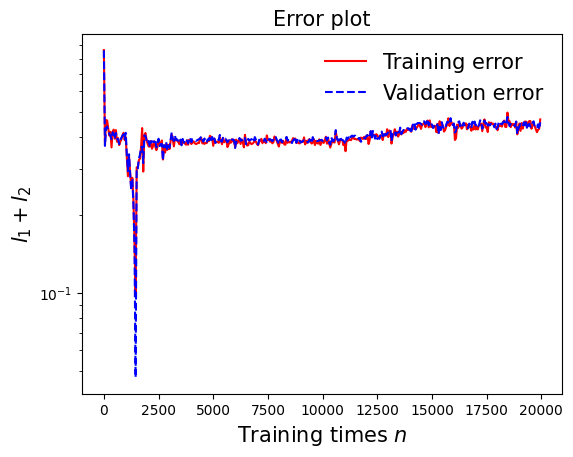

In [99]:
draw_loss(model6)

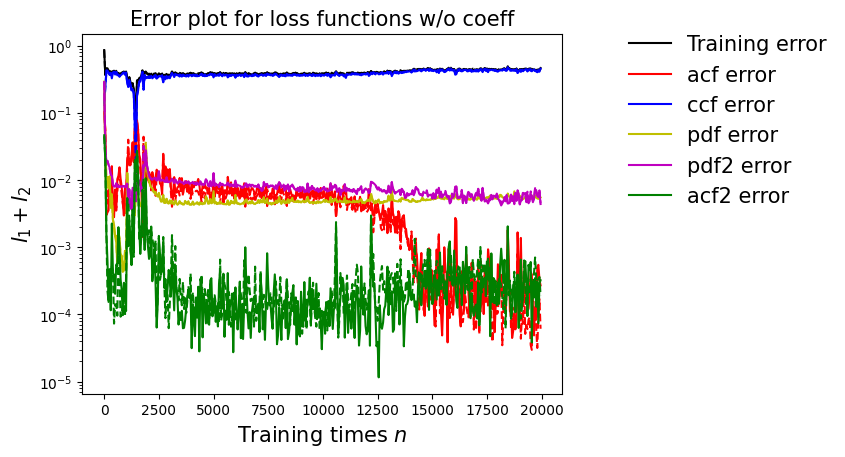

In [100]:
draw_errors(model6)

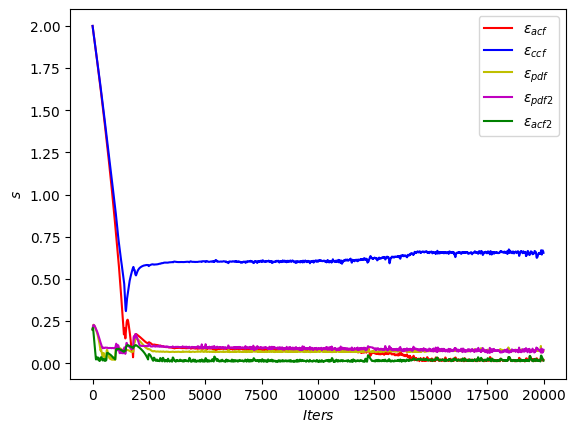

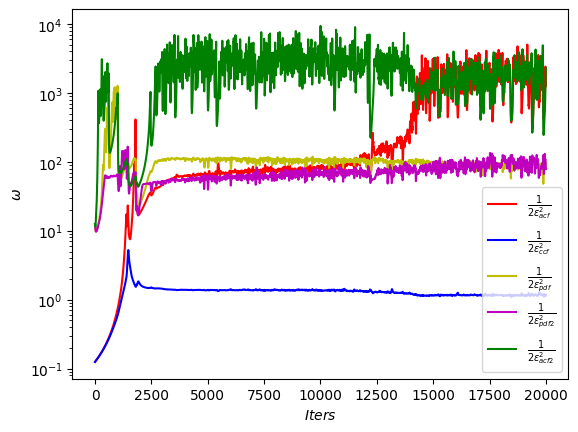

In [101]:
draw_adaptive_w(model6)
draw_epoch_w(model6)

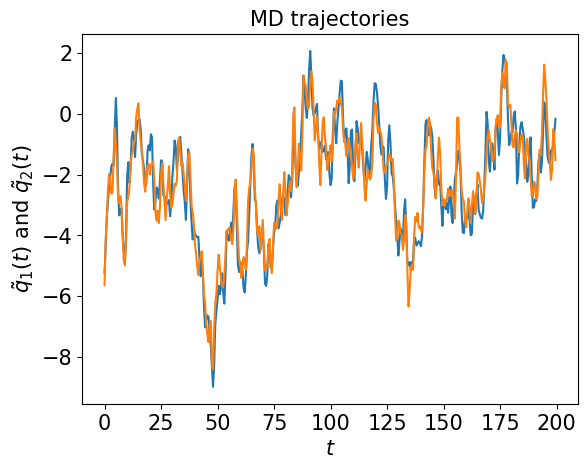

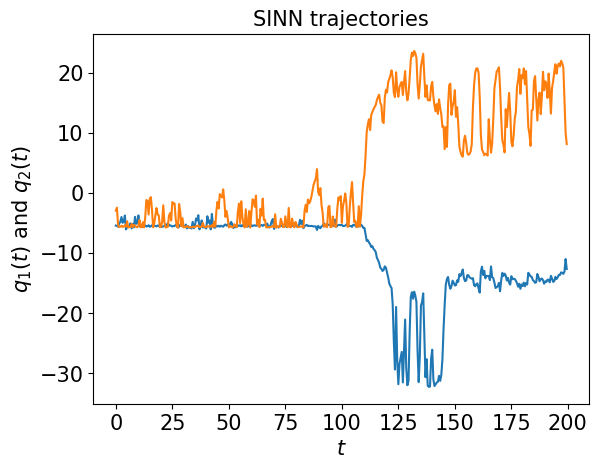

In [102]:
test1(model6)

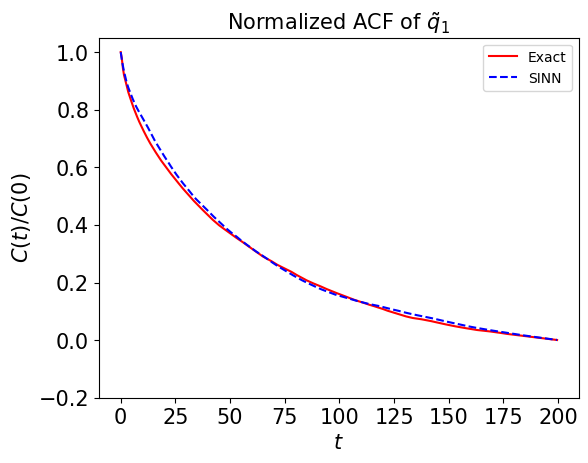

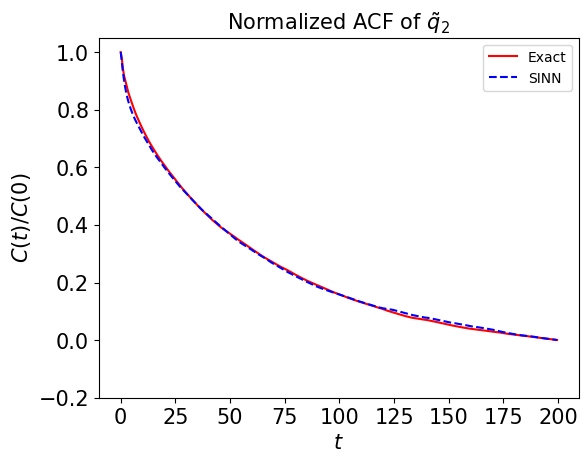

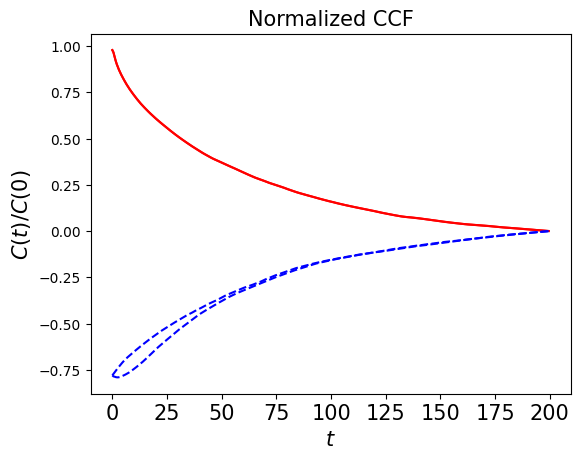

In [103]:
test2(model6)

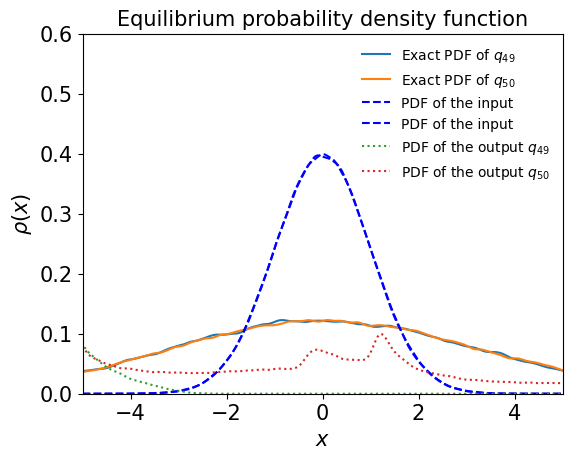

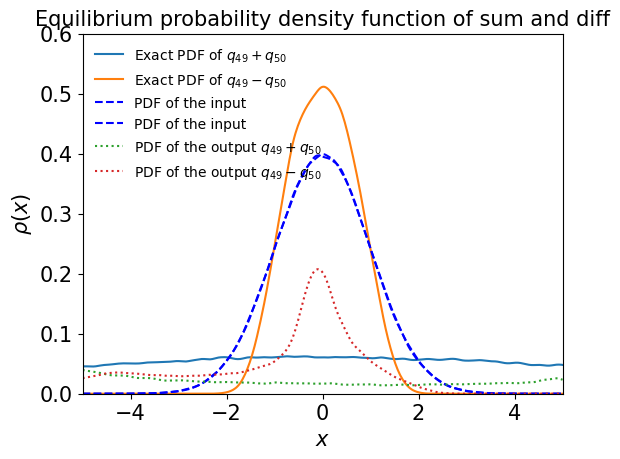

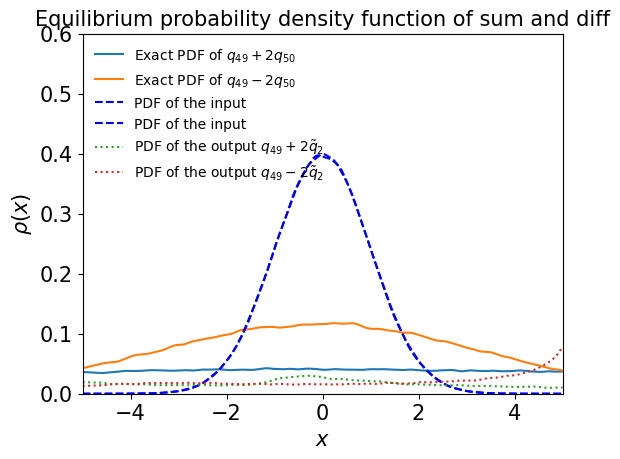

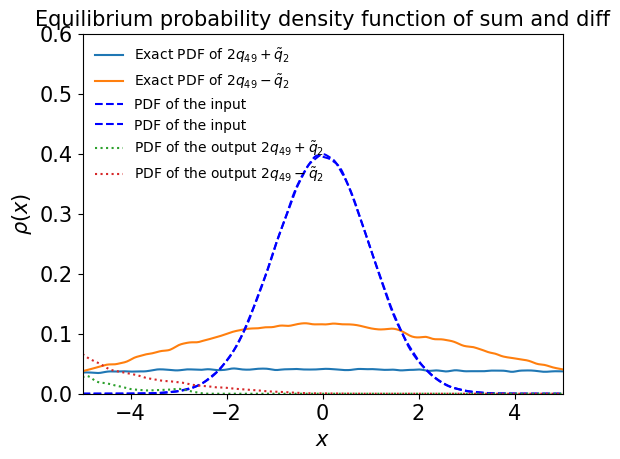

In [104]:
test3(model6)

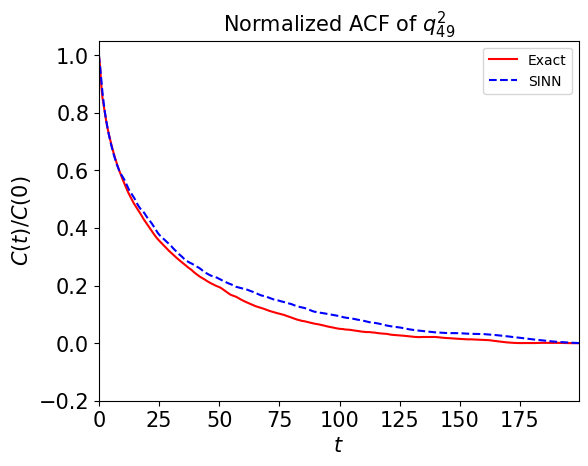

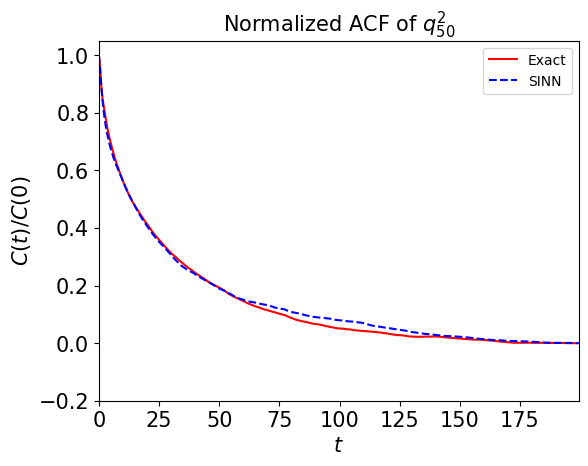

In [105]:
test4(model6)

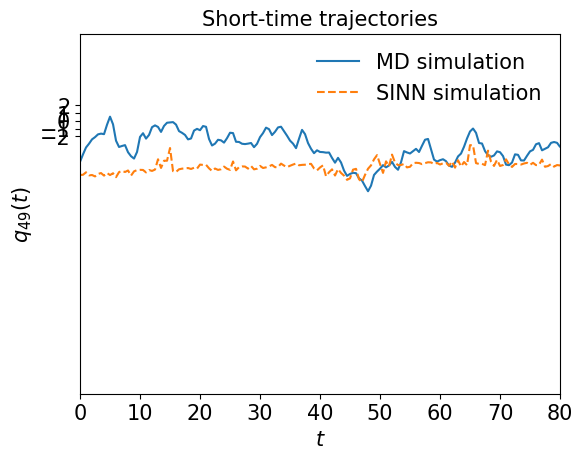

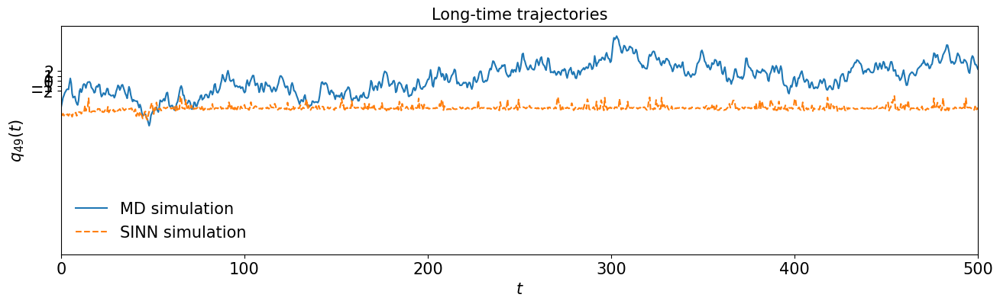

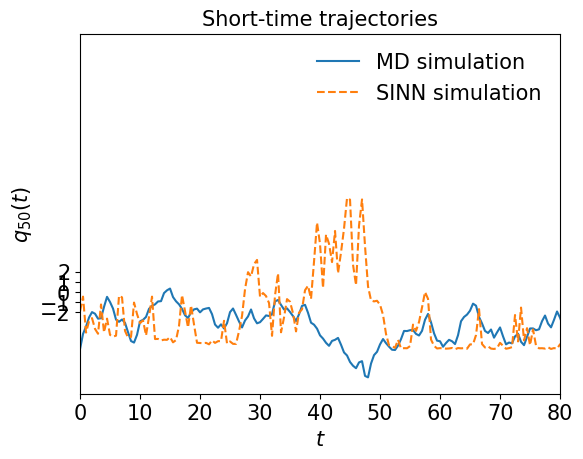

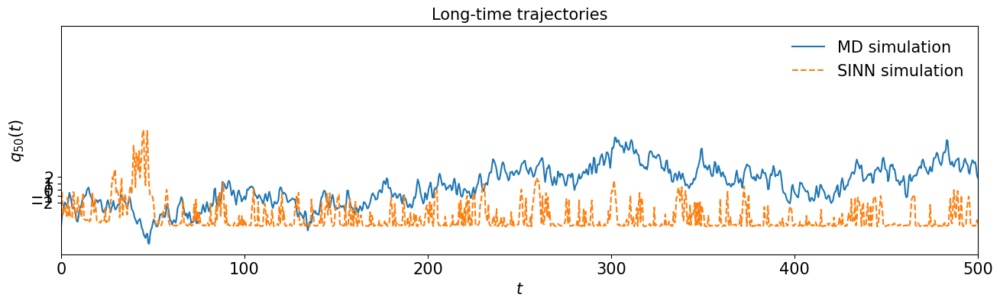

In [106]:
test5(model6)

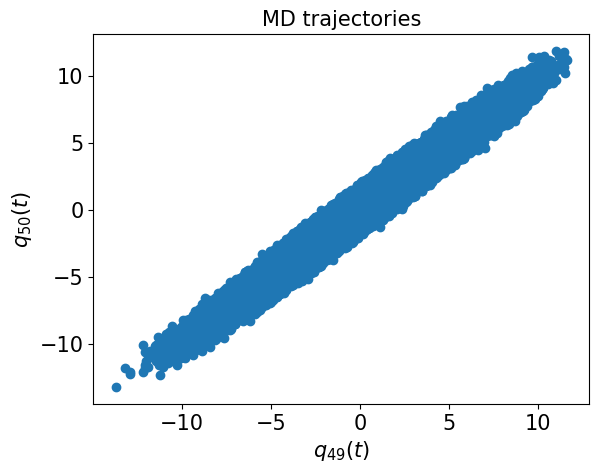

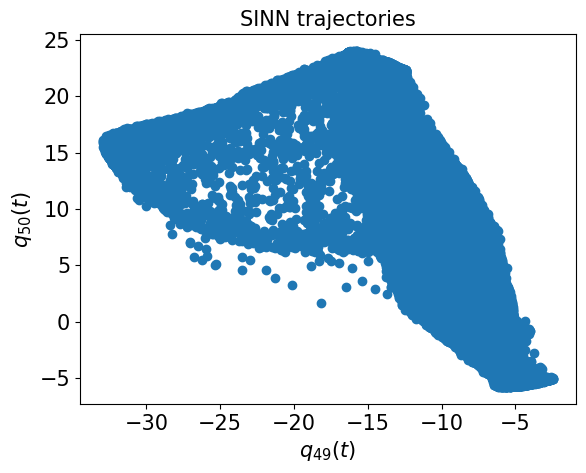

In [107]:
test6(model6)

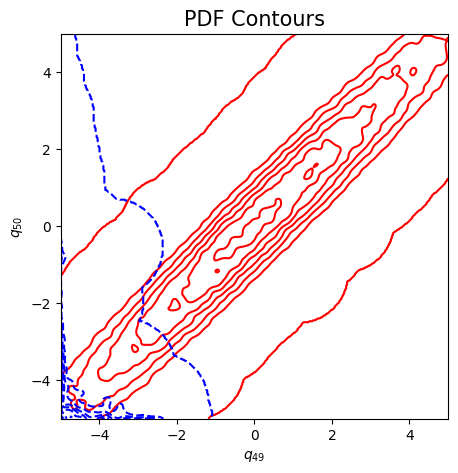

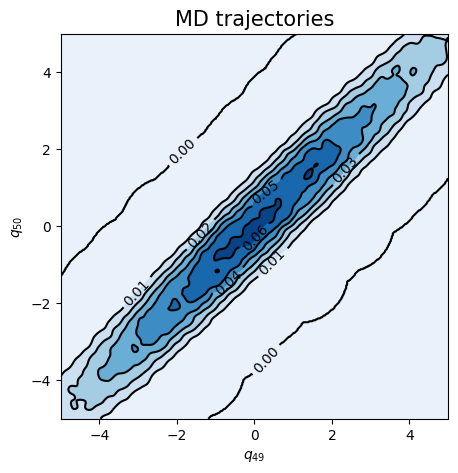

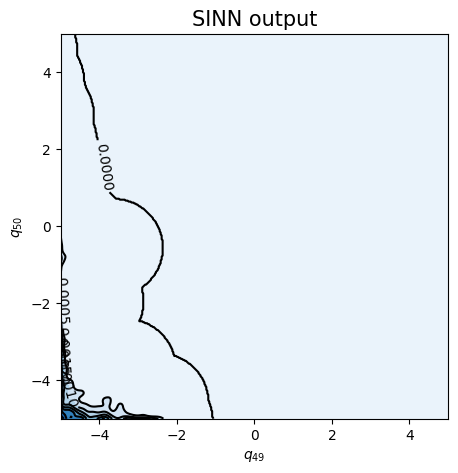

In [108]:
test7(model6)

In [109]:
### Defining SINN model
net7 = SINN(2, 50, 2, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model7 = Model(net=net7)
model7.train()

[0]-th step loss: 0.8382, 0.8322, acf: 0.10283, ccf: 0.10344, pdf: 0.29258, pdf2: 0.28761, acf2: 0.04579
[50]-th step loss: 0.1290, 0.1162, acf: 0.03443, ccf: 0.03443, pdf: 0.02166, pdf2: 0.01869, acf2: 0.00701
[100]-th step loss: 0.0994, 0.1126, acf: 0.04117, ccf: 0.04161, pdf: 0.00871, pdf2: 0.00875, acf2: 0.01242
[150]-th step loss: 0.0558, 0.0779, acf: 0.03291, ccf: 0.03295, pdf: 0.00498, pdf2: 0.00469, acf2: 0.00232
[200]-th step loss: 0.0849, 0.0652, acf: 0.02468, ccf: 0.02464, pdf: 0.00405, pdf2: 0.01066, acf2: 0.00116
[250]-th step loss: 0.0472, 0.0568, acf: 0.02578, ccf: 0.02574, pdf: 0.00119, pdf2: 0.00333, acf2: 0.00074
[300]-th step loss: 0.0534, 0.0642, acf: 0.02911, ccf: 0.02903, pdf: 0.00212, pdf2: 0.00265, acf2: 0.00130
[350]-th step loss: 0.0496, 0.0709, acf: 0.03470, ccf: 0.03461, pdf: 0.00038, pdf2: 0.00042, acf2: 0.00075
[400]-th step loss: 0.0923, 0.1083, acf: 0.05071, ccf: 0.05065, pdf: 0.00014, pdf2: 0.00025, acf2: 0.00651
[450]-th step loss: 0.0650, 0.0814, acf:

[3850]-th step loss: 0.0252, 0.0223, acf: 0.00018, ccf: 0.00018, pdf: 0.00713, pdf2: 0.00375, acf2: 0.01110
[3900]-th step loss: 0.0240, 0.0340, acf: 0.00093, ccf: 0.00093, pdf: 0.00706, pdf2: 0.00413, acf2: 0.02095
[3950]-th step loss: 0.0304, 0.0302, acf: 0.00018, ccf: 0.00019, pdf: 0.00663, pdf2: 0.00445, acf2: 0.01875
[4000]-th step loss: 0.0264, 0.0256, acf: 0.00017, ccf: 0.00018, pdf: 0.00687, pdf2: 0.00387, acf2: 0.01450
[4050]-th step loss: 0.0227, 0.0223, acf: 0.00076, ccf: 0.00075, pdf: 0.00771, pdf2: 0.00429, acf2: 0.00878
[4100]-th step loss: 0.0222, 0.0227, acf: 0.00008, ccf: 0.00008, pdf: 0.00671, pdf2: 0.00377, acf2: 0.01201
[4150]-th step loss: 0.0223, 0.0238, acf: 0.00010, ccf: 0.00011, pdf: 0.00660, pdf2: 0.00402, acf2: 0.01298
[4200]-th step loss: 0.0232, 0.0245, acf: 0.00017, ccf: 0.00016, pdf: 0.00647, pdf2: 0.00439, acf2: 0.01327
[4250]-th step loss: 0.0252, 0.0240, acf: 0.00006, ccf: 0.00006, pdf: 0.00666, pdf2: 0.00375, acf2: 0.01345
[4300]-th step loss: 0.0294,

[7650]-th step loss: 0.0285, 0.0270, acf: 0.00204, ccf: 0.00176, pdf: 0.00674, pdf2: 0.00905, acf2: 0.00737
[7700]-th step loss: 0.0225, 0.0245, acf: 0.00039, ccf: 0.00035, pdf: 0.00665, pdf2: 0.00401, acf2: 0.01314
[7750]-th step loss: 0.0207, 0.0204, acf: 0.00029, ccf: 0.00038, pdf: 0.00670, pdf2: 0.00393, acf2: 0.00910
[7800]-th step loss: 0.0172, 0.0200, acf: 0.00022, ccf: 0.00024, pdf: 0.00701, pdf2: 0.00352, acf2: 0.00902
[7850]-th step loss: 0.0177, 0.0180, acf: 0.00024, ccf: 0.00020, pdf: 0.00639, pdf2: 0.00339, acf2: 0.00776
[7900]-th step loss: 0.0153, 0.0169, acf: 0.00014, ccf: 0.00009, pdf: 0.00553, pdf2: 0.00373, acf2: 0.00742
[7950]-th step loss: 0.0224, 0.0222, acf: 0.00006, ccf: 0.00006, pdf: 0.00739, pdf2: 0.00510, acf2: 0.00960
[8000]-th step loss: 0.0199, 0.0194, acf: 0.00007, ccf: 0.00008, pdf: 0.00586, pdf2: 0.00446, acf2: 0.00889
[8050]-th step loss: 0.0149, 0.0148, acf: 0.00040, ccf: 0.00039, pdf: 0.00510, pdf2: 0.00388, acf2: 0.00499
[8100]-th step loss: 0.0165,

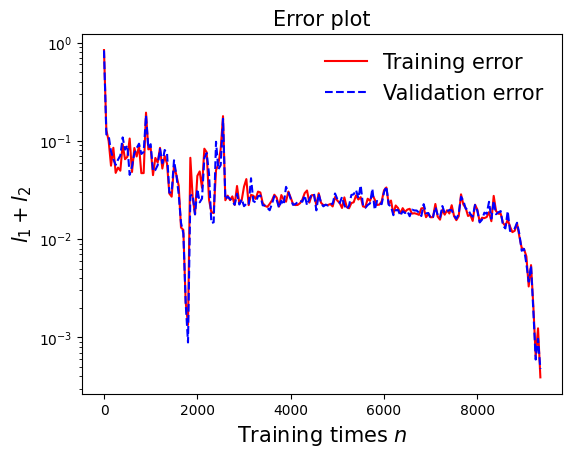

In [110]:
draw_loss(model7)

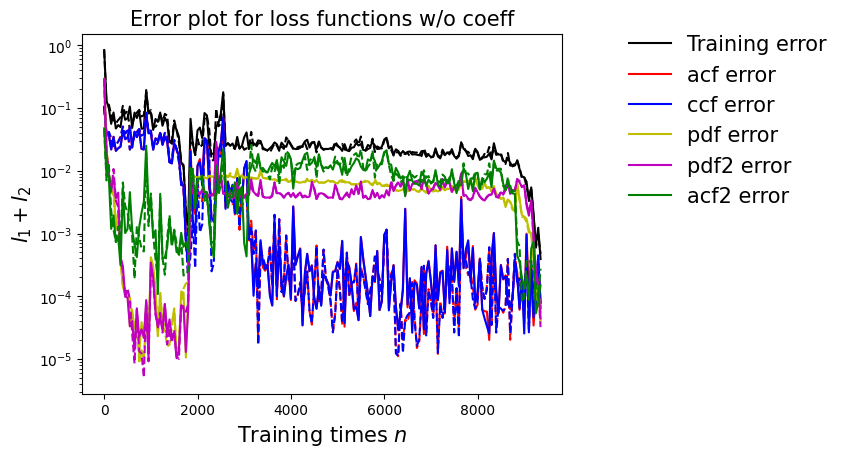

In [111]:
draw_errors(model7)

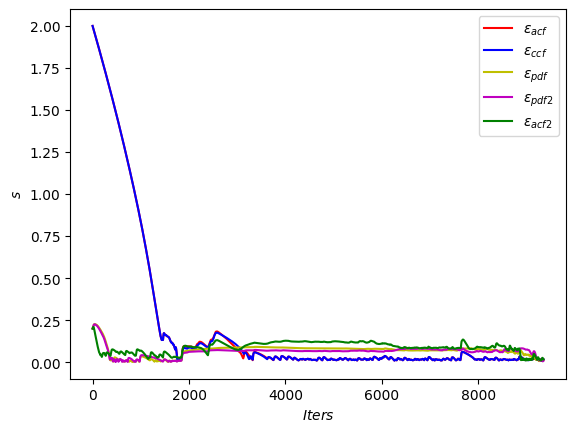

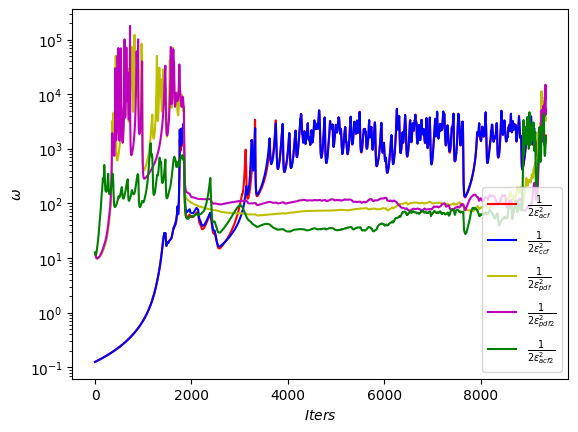

In [112]:
draw_adaptive_w(model7)
draw_epoch_w(model7)

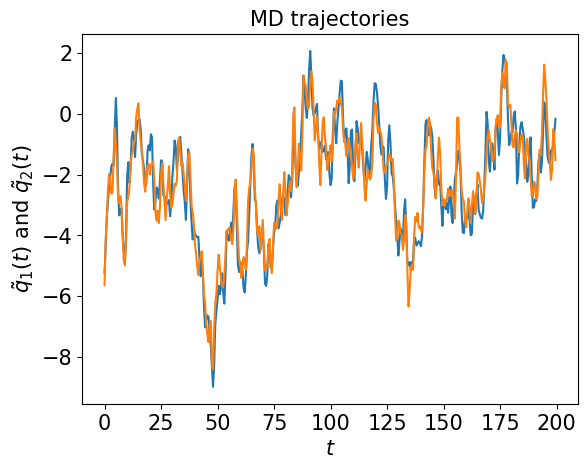

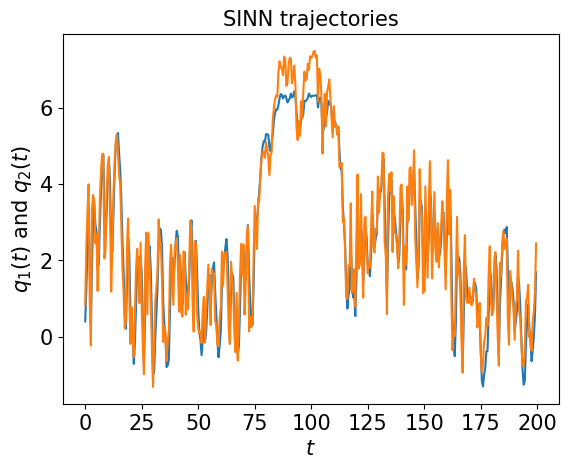

In [113]:
test1(model7)

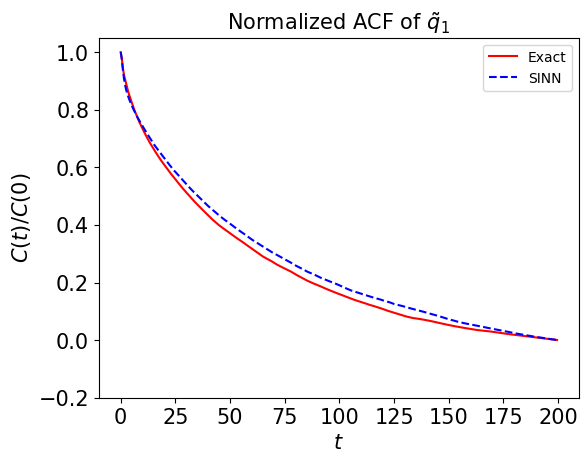

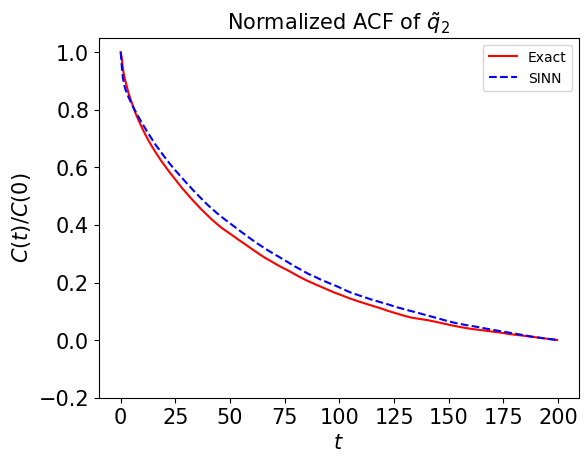

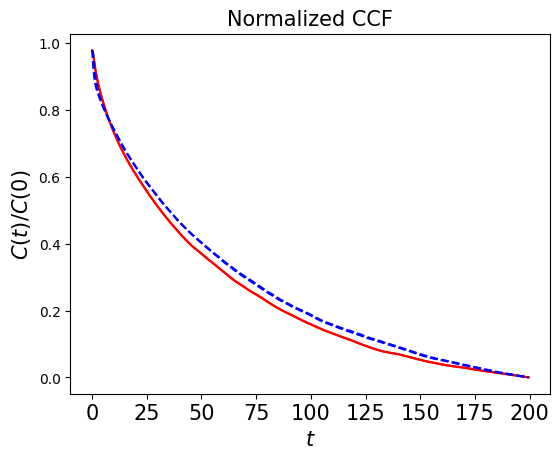

In [114]:
test2(model7)

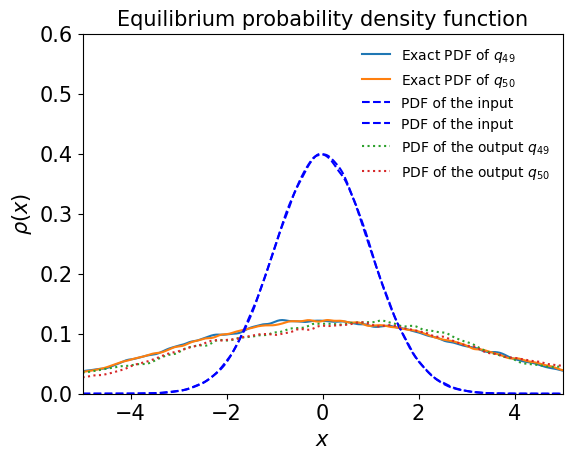

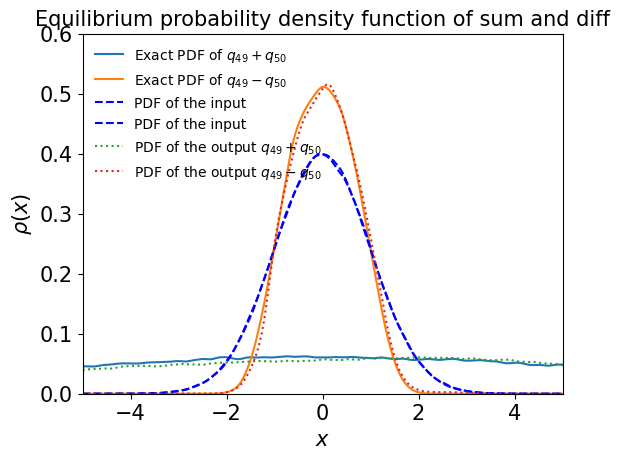

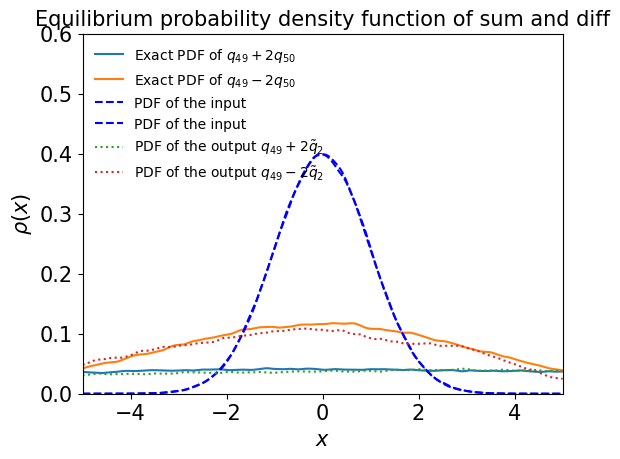

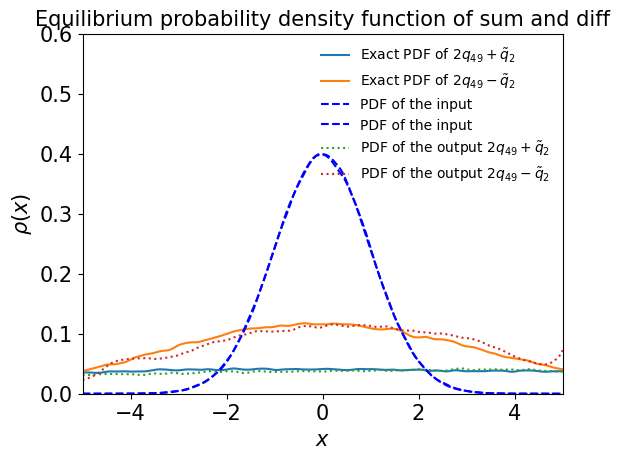

In [115]:
test3(model7)

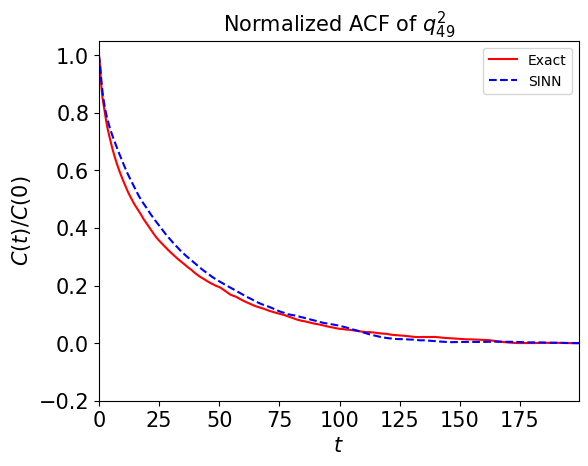

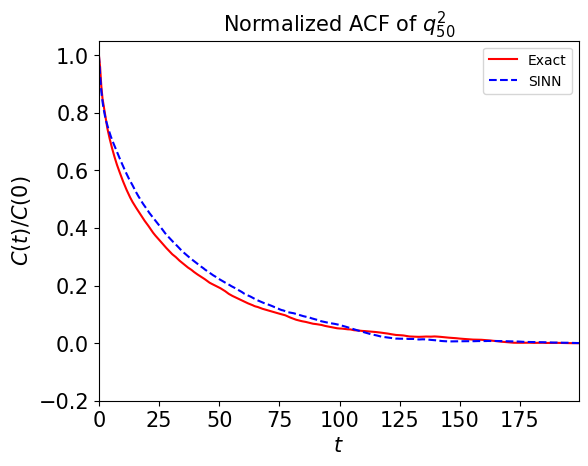

In [116]:
test4(model7)

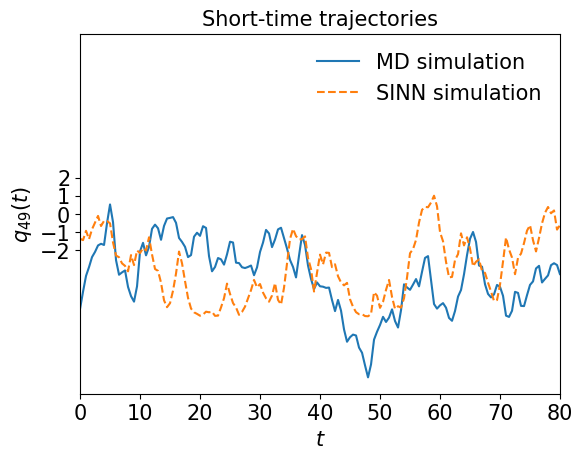

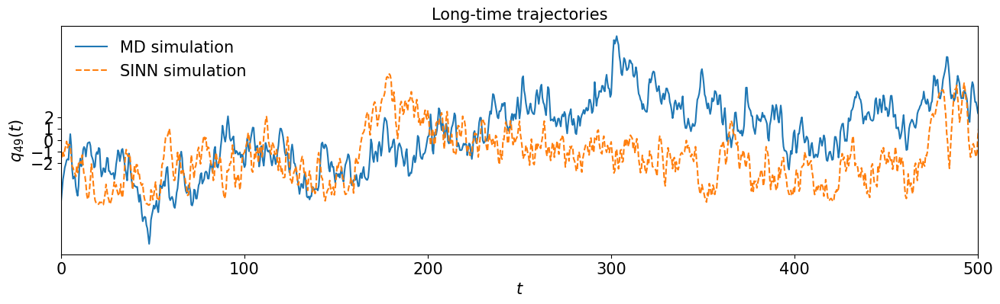

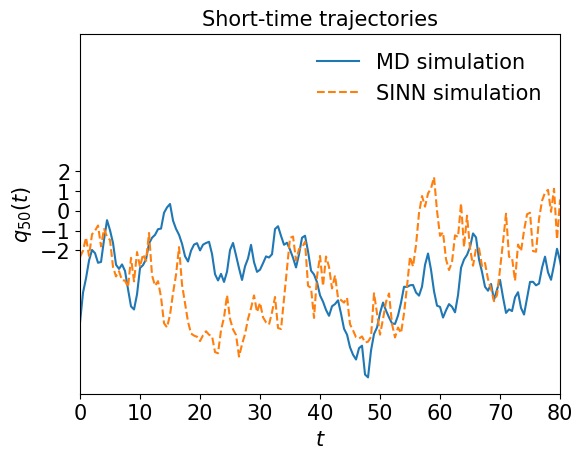

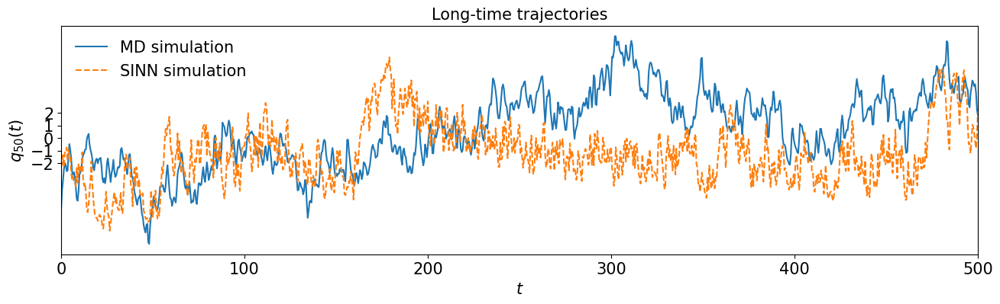

In [117]:
test5(model7)

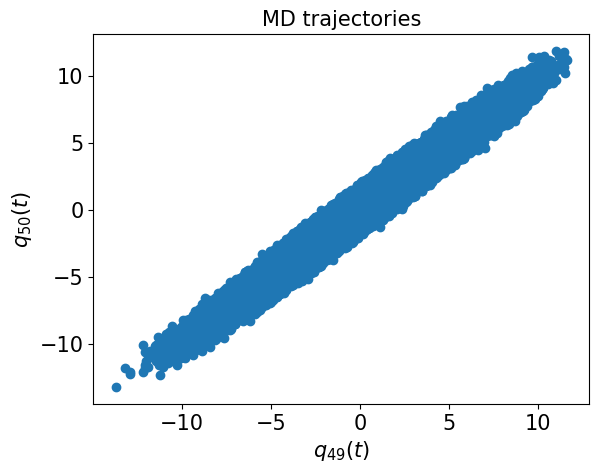

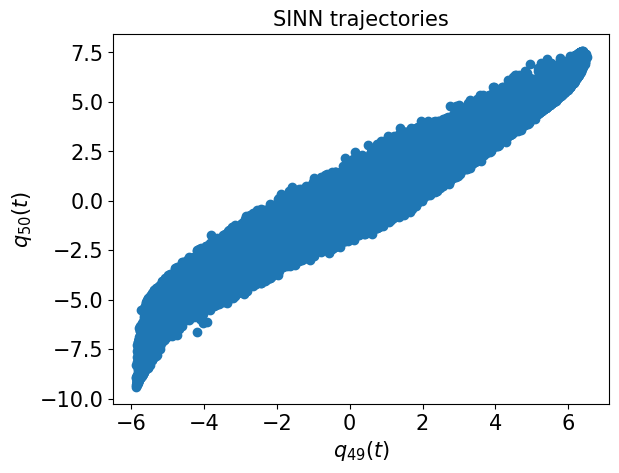

In [118]:
test6(model7)

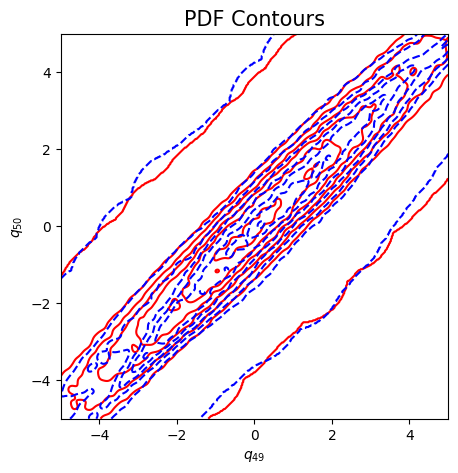

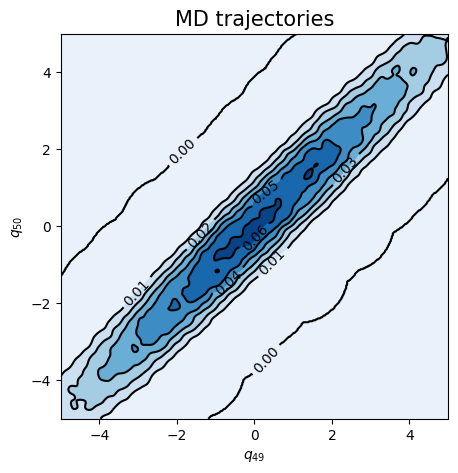

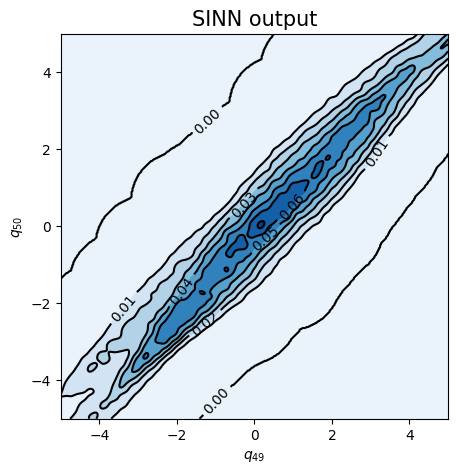

In [119]:
test7(model7)

In [120]:
### Defining SINN model
net8 = SINN(2, 50, 2, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model8 = Model(net=net8)
model8.train()

[0]-th step loss: 0.8598, 0.8528, acf: 0.10159, ccf: 0.12517, pdf: 0.29282, pdf2: 0.28845, acf2: 0.04474
[50]-th step loss: 0.1408, 0.1229, acf: 0.03524, ccf: 0.03690, pdf: 0.02850, pdf2: 0.01766, acf2: 0.00456
[100]-th step loss: 0.0349, 0.0373, acf: 0.00976, ccf: 0.01166, pdf: 0.00922, pdf2: 0.00630, acf2: 0.00032
[150]-th step loss: 0.0772, 0.0652, acf: 0.01800, ccf: 0.02522, pdf: 0.00927, pdf2: 0.01249, acf2: 0.00018
[200]-th step loss: 0.0545, 0.0517, acf: 0.01354, ccf: 0.01531, pdf: 0.01168, pdf2: 0.01063, acf2: 0.00053
[250]-th step loss: 0.0950, 0.0902, acf: 0.02463, ccf: 0.03087, pdf: 0.01608, pdf2: 0.01664, acf2: 0.00196
[300]-th step loss: 0.0485, 0.0499, acf: 0.01361, ccf: 0.02054, pdf: 0.00961, pdf2: 0.00588, acf2: 0.00022
[350]-th step loss: 0.0486, 0.0438, acf: 0.01252, ccf: 0.01825, pdf: 0.00770, pdf2: 0.00520, acf2: 0.00018
[400]-th step loss: 0.0413, 0.0408, acf: 0.01325, ccf: 0.01688, pdf: 0.00559, pdf2: 0.00479, acf2: 0.00029
[450]-th step loss: 0.0373, 0.0287, acf:

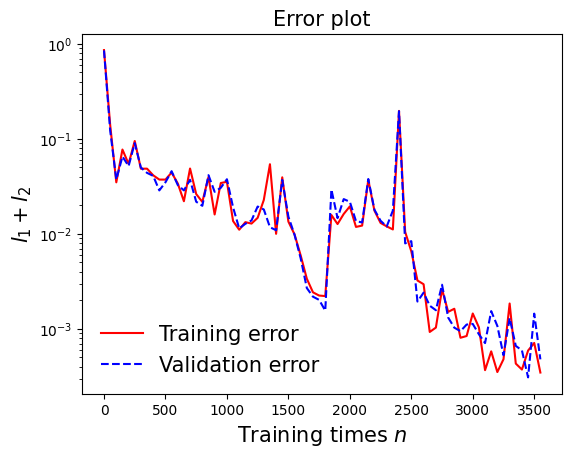

In [121]:
draw_loss(model8)

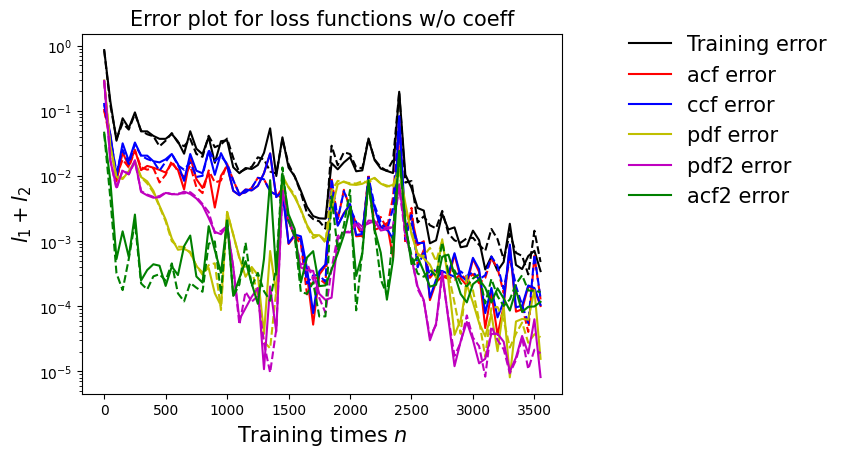

In [122]:
draw_errors(model8)

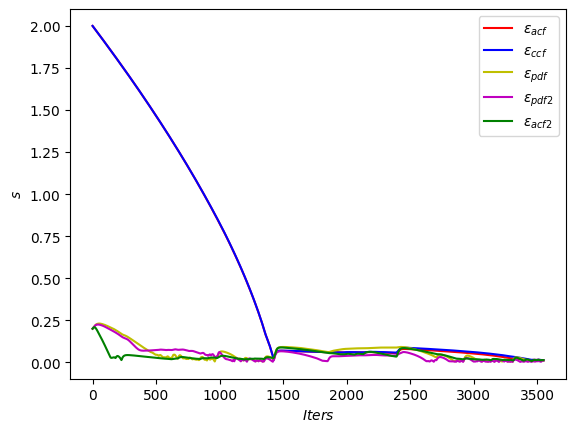

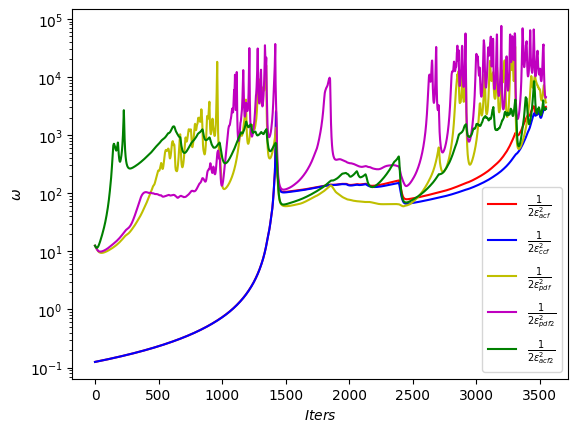

In [123]:
draw_adaptive_w(model8)
draw_epoch_w(model8)

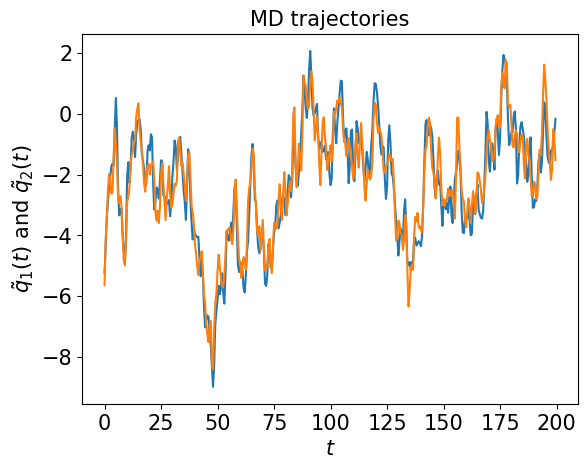

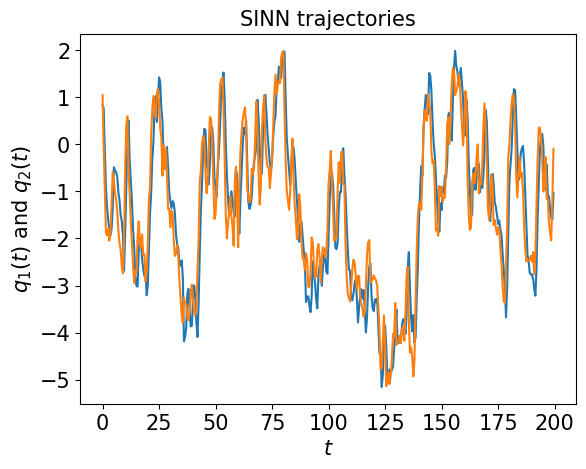

In [124]:
test1(model8)

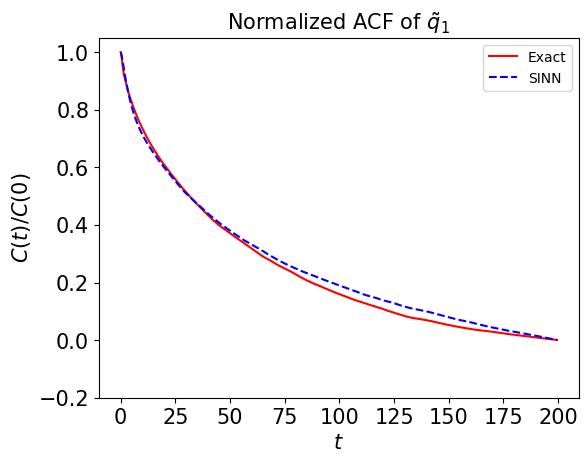

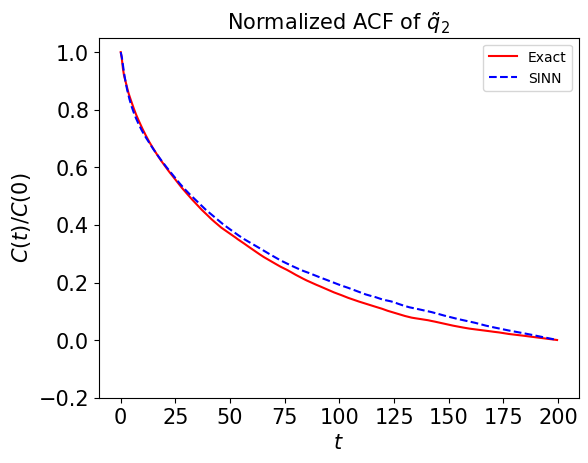

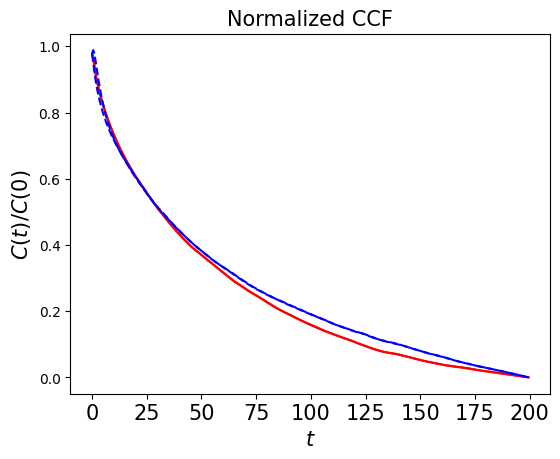

In [125]:
test2(model8)

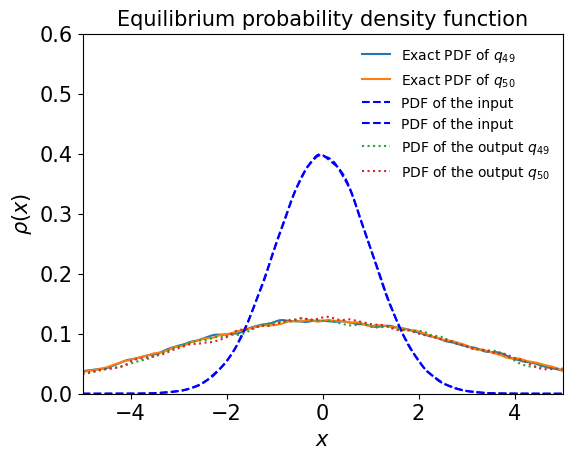

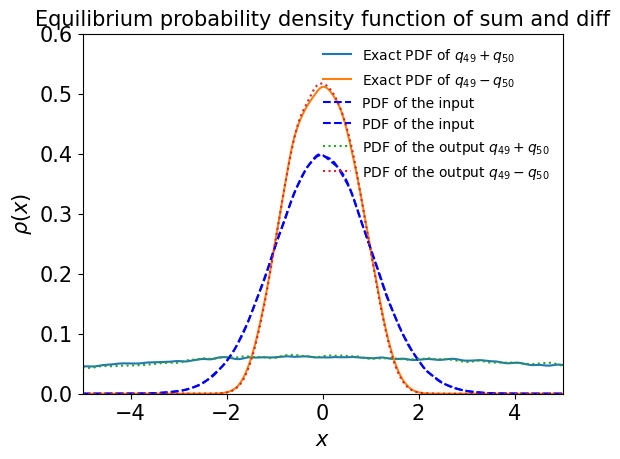

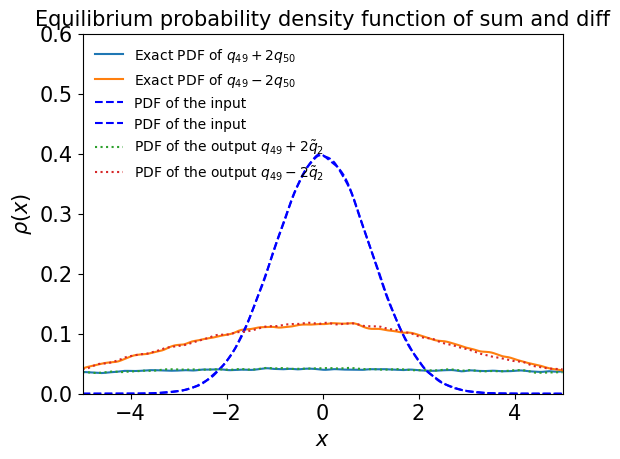

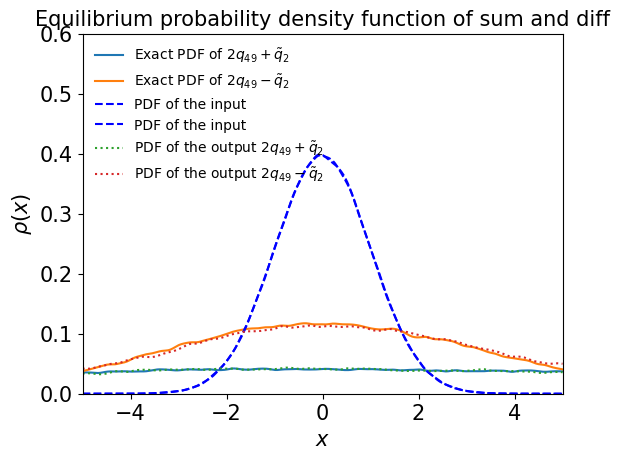

In [126]:
test3(model8)

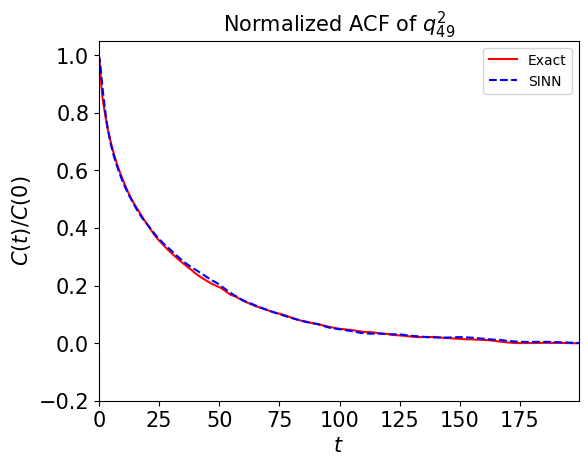

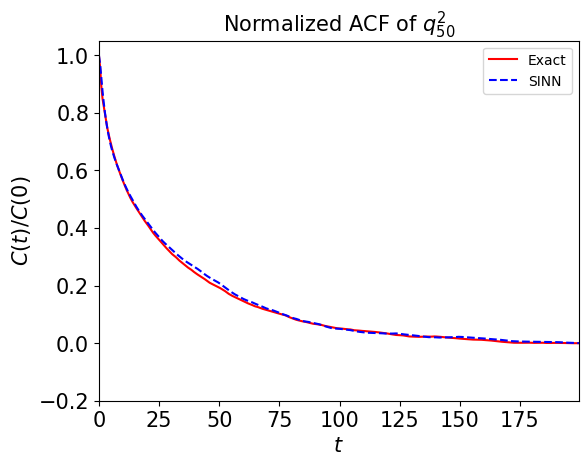

In [127]:
test4(model8)

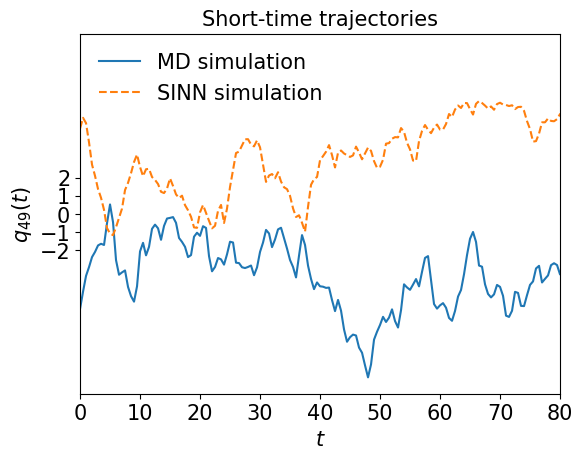

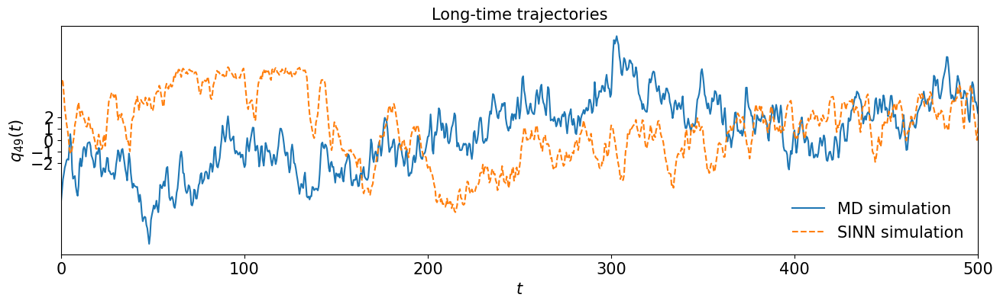

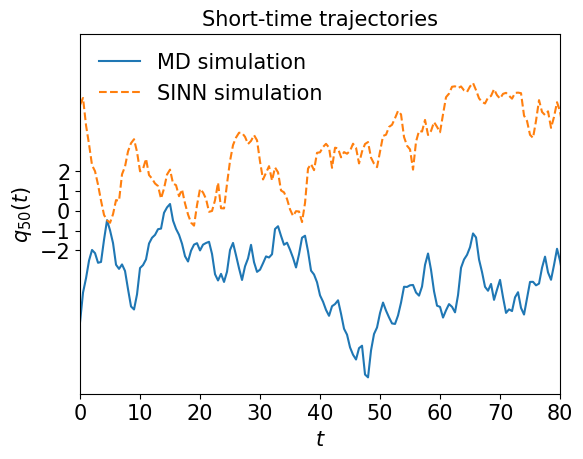

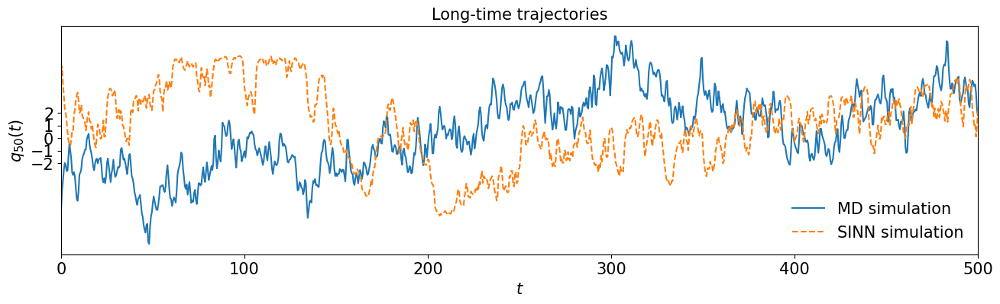

In [128]:
test5(model8)

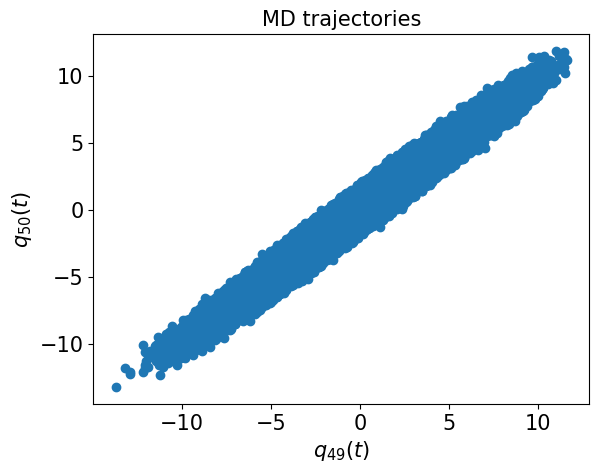

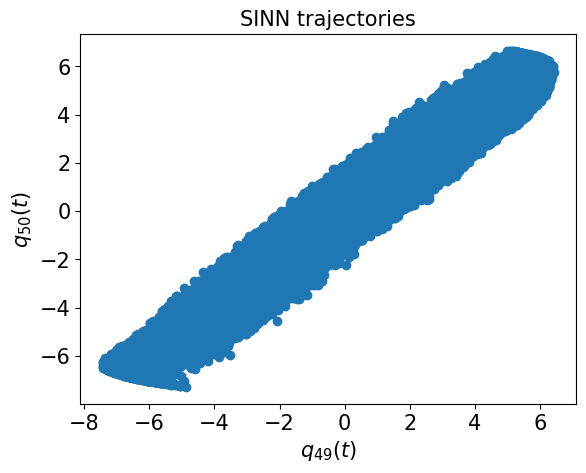

In [129]:
test6(model8)

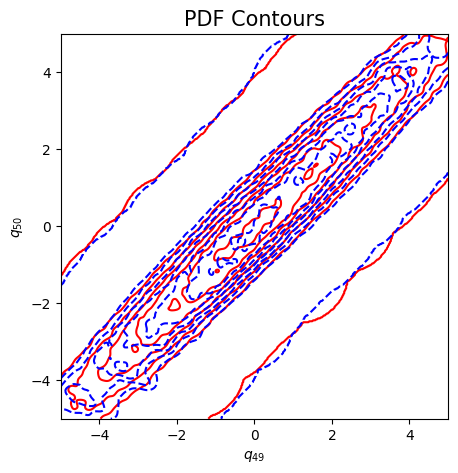

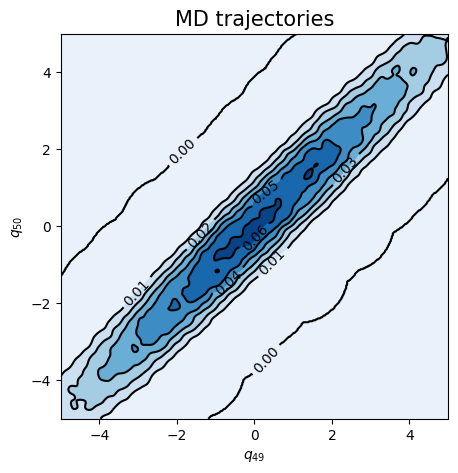

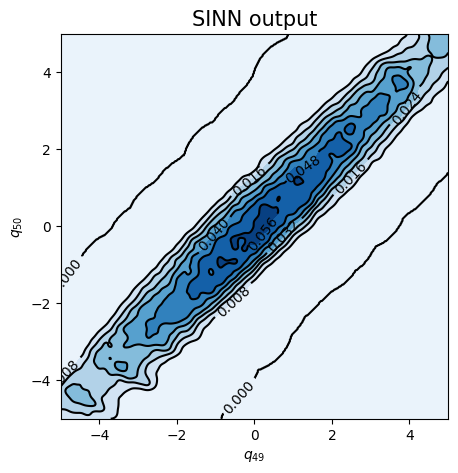

In [130]:
test7(model8)

In [131]:
### Defining SINN model
net9 = SINN(2, 50, 2, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model9 = Model(net=net9)
model9.train()

[0]-th step loss: 0.8545, 0.8471, acf: 0.10259, ccf: 0.11695, pdf: 0.29300, pdf2: 0.28902, acf2: 0.04558
[50]-th step loss: 0.3694, 0.3705, acf: 0.03237, ccf: 0.28933, pdf: 0.02204, pdf2: 0.02392, acf2: 0.00286
[100]-th step loss: 0.3446, 0.3364, acf: 0.02850, ccf: 0.27873, pdf: 0.01235, pdf2: 0.01464, acf2: 0.00221
[150]-th step loss: 0.5647, 0.5931, acf: 0.09226, ccf: 0.10121, pdf: 0.27710, pdf2: 0.08548, acf2: 0.03708
[200]-th step loss: 0.0637, 0.0566, acf: 0.01216, ccf: 0.01210, pdf: 0.01935, pdf2: 0.01215, acf2: 0.00079
[250]-th step loss: 0.0595, 0.0572, acf: 0.01698, ccf: 0.01688, pdf: 0.01266, pdf2: 0.00995, acf2: 0.00071
[300]-th step loss: 0.0462, 0.0459, acf: 0.00924, ccf: 0.00910, pdf: 0.01382, pdf2: 0.01033, acf2: 0.00343
[350]-th step loss: 0.0669, 0.0567, acf: 0.01450, ccf: 0.01438, pdf: 0.01391, pdf2: 0.00960, acf2: 0.00434
[400]-th step loss: 0.0626, 0.0480, acf: 0.01559, ccf: 0.01700, pdf: 0.00404, pdf2: 0.00929, acf2: 0.00208
[450]-th step loss: 0.0826, 0.0858, acf:

[3850]-th step loss: 0.0283, 0.0292, acf: 0.00039, ccf: 0.00038, pdf: 0.00827, pdf2: 0.00914, acf2: 0.01102
[3900]-th step loss: 0.0319, 0.0301, acf: 0.00030, ccf: 0.00029, pdf: 0.00828, pdf2: 0.00963, acf2: 0.01165
[3950]-th step loss: 0.0351, 0.0291, acf: 0.00020, ccf: 0.00020, pdf: 0.00828, pdf2: 0.00903, acf2: 0.01137
[4000]-th step loss: 0.0292, 0.0310, acf: 0.00004, ccf: 0.00004, pdf: 0.00829, pdf2: 0.00924, acf2: 0.01335
[4050]-th step loss: 0.0310, 0.0281, acf: 0.00046, ccf: 0.00045, pdf: 0.00828, pdf2: 0.00903, acf2: 0.00991
[4100]-th step loss: 0.0331, 0.0305, acf: 0.00018, ccf: 0.00018, pdf: 0.00829, pdf2: 0.00927, acf2: 0.01255
[4150]-th step loss: 0.0315, 0.0292, acf: 0.00024, ccf: 0.00023, pdf: 0.00828, pdf2: 0.00919, acf2: 0.01130
[4200]-th step loss: 0.0326, 0.0292, acf: 0.00031, ccf: 0.00031, pdf: 0.00829, pdf2: 0.00909, acf2: 0.01125
[4250]-th step loss: 0.0334, 0.0295, acf: 0.00021, ccf: 0.00020, pdf: 0.00829, pdf2: 0.00905, acf2: 0.01175
[4300]-th step loss: 0.0281,

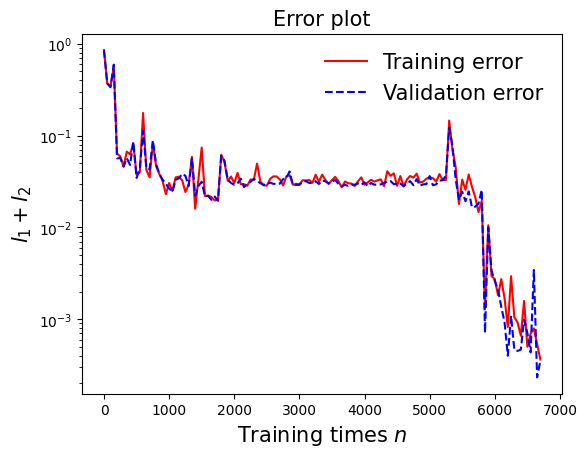

In [132]:
draw_loss(model9)

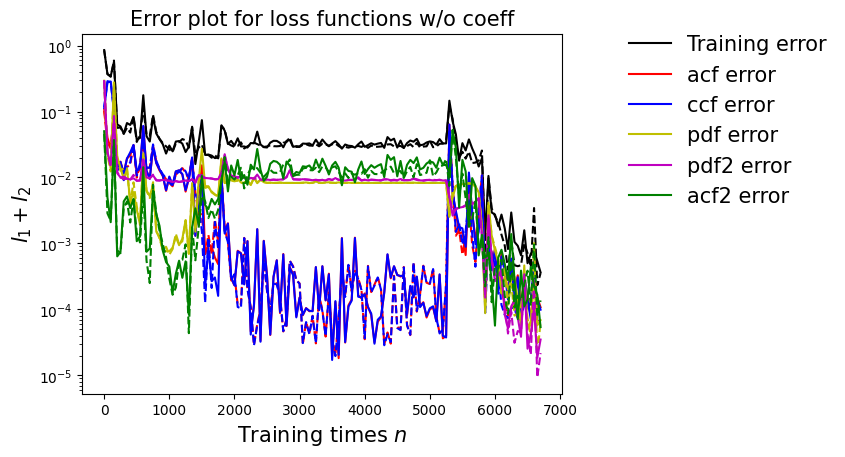

In [133]:
draw_errors(model9)

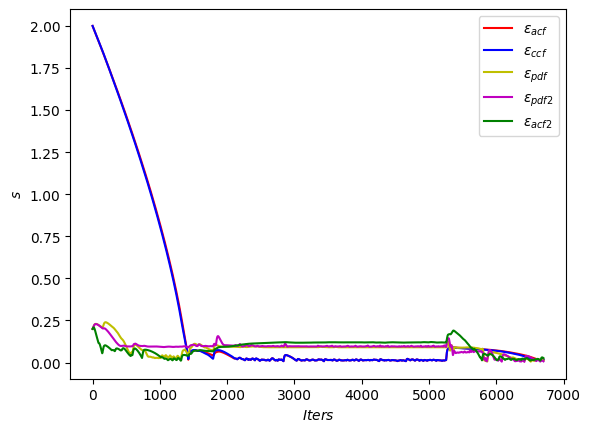

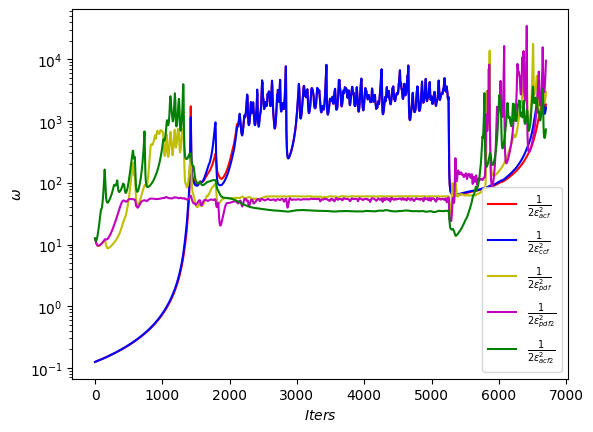

In [134]:
draw_adaptive_w(model9)
draw_epoch_w(model9)

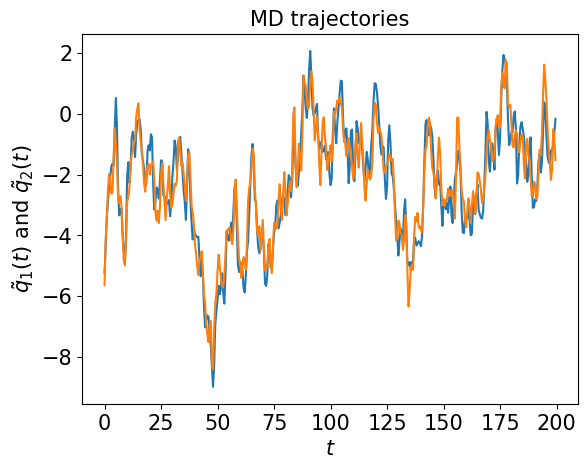

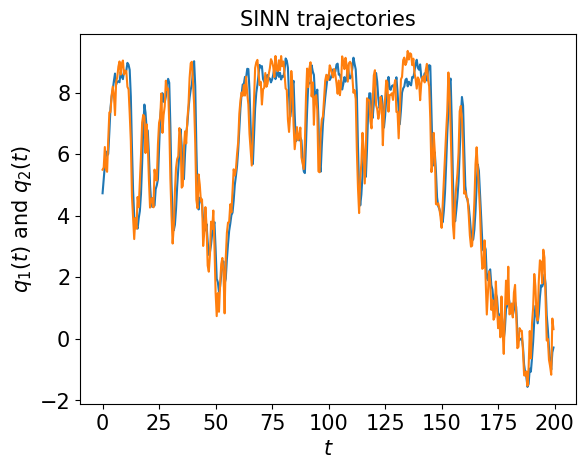

In [135]:
test1(model9)

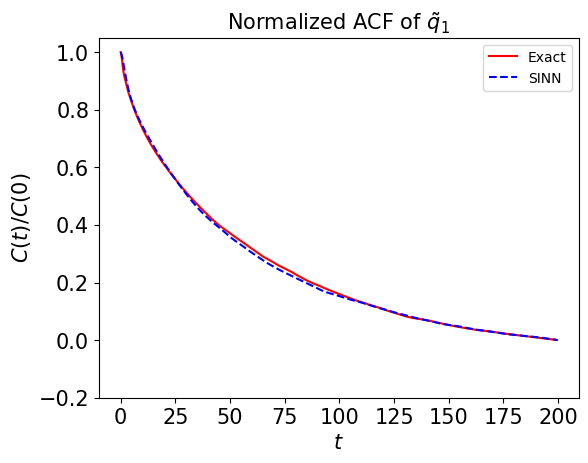

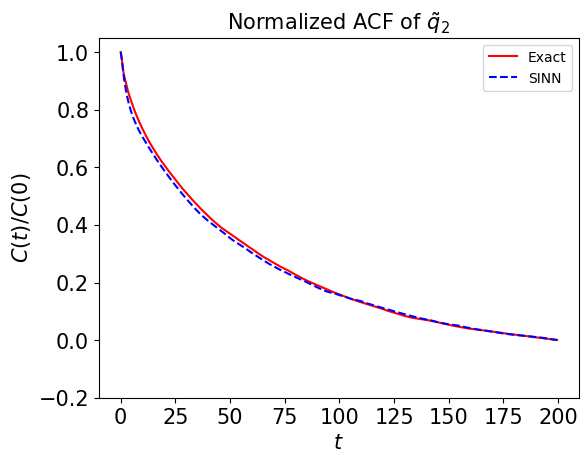

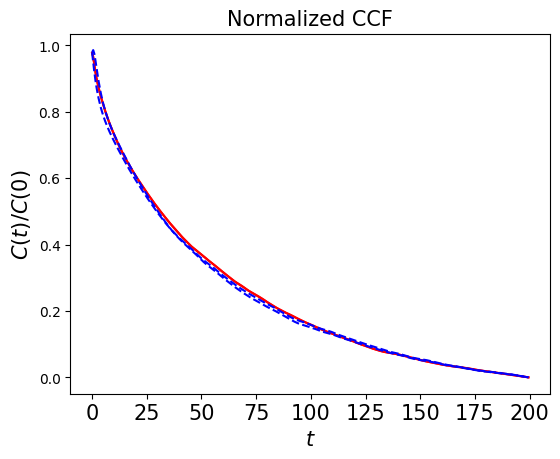

In [136]:
test2(model9)

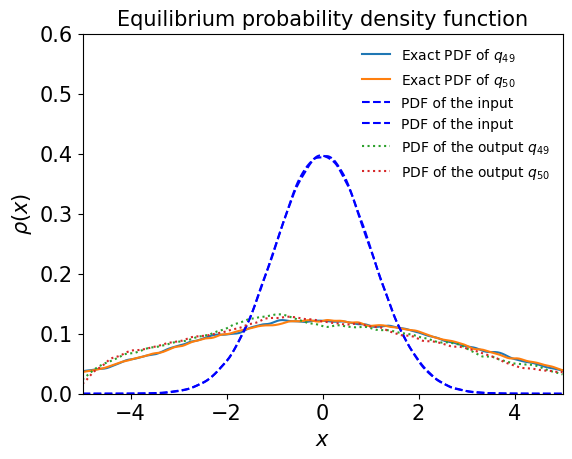

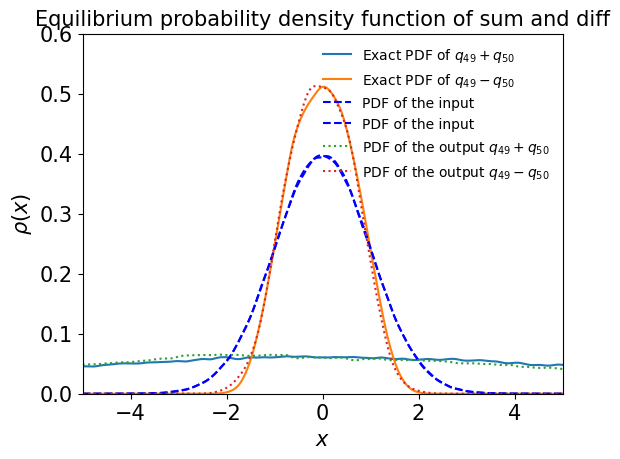

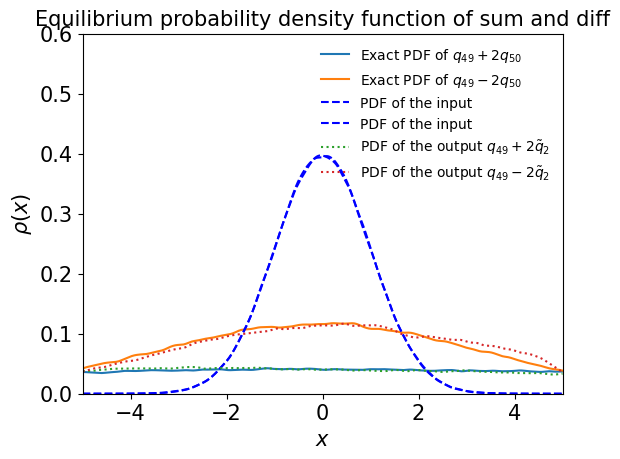

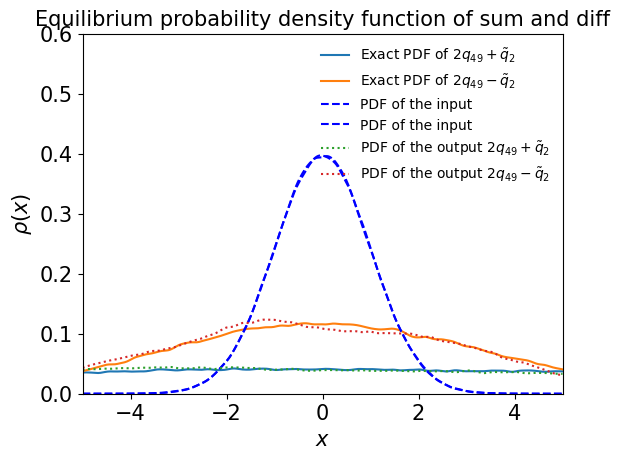

In [137]:
test3(model9)

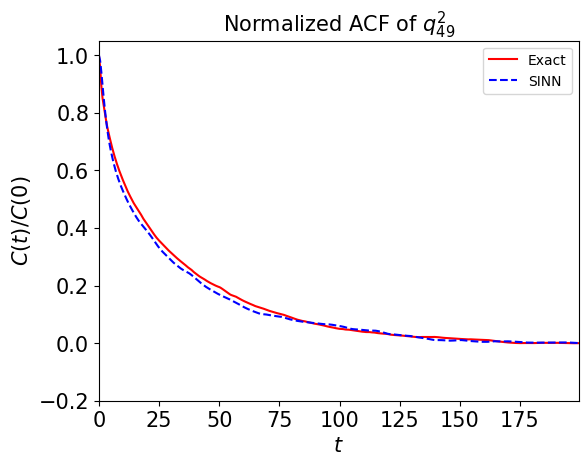

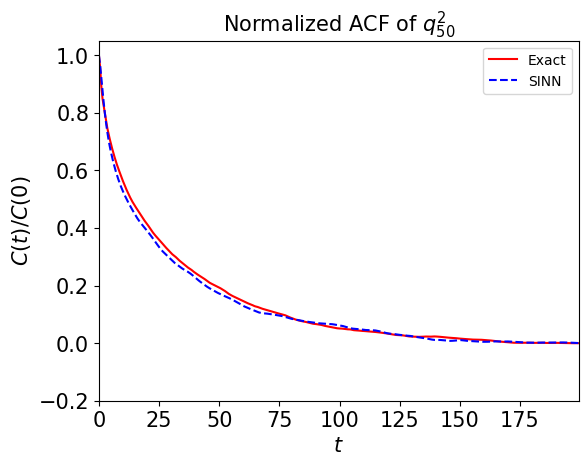

In [138]:
test4(model9)

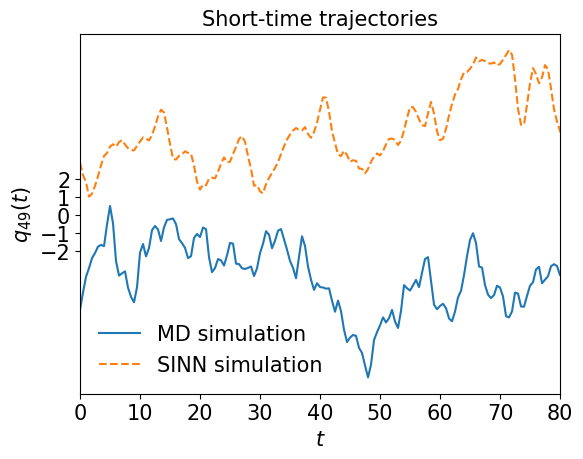

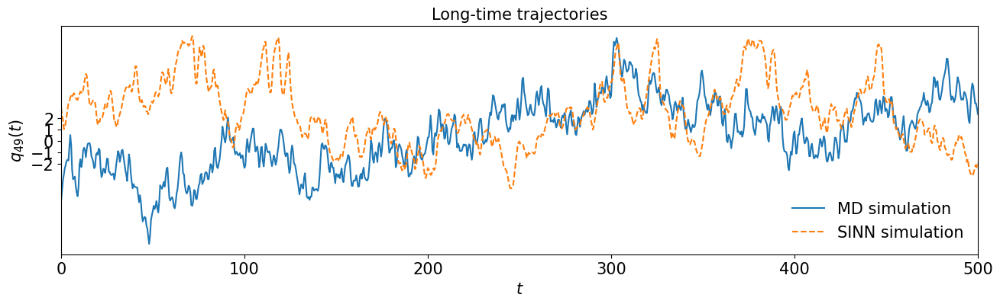

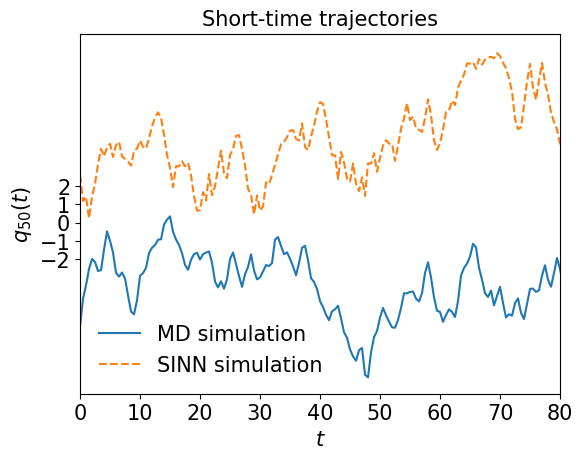

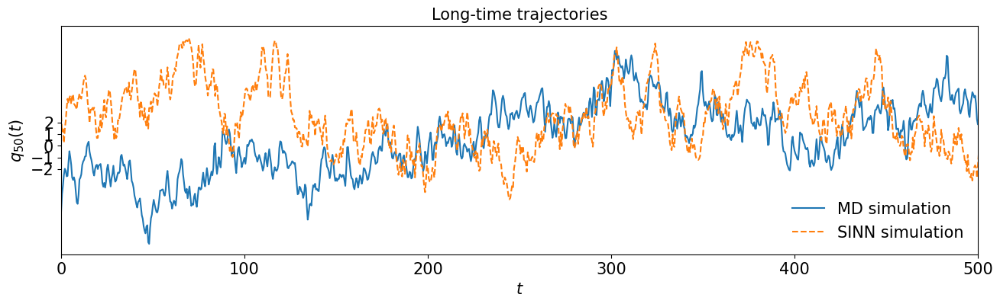

In [139]:
test5(model9)

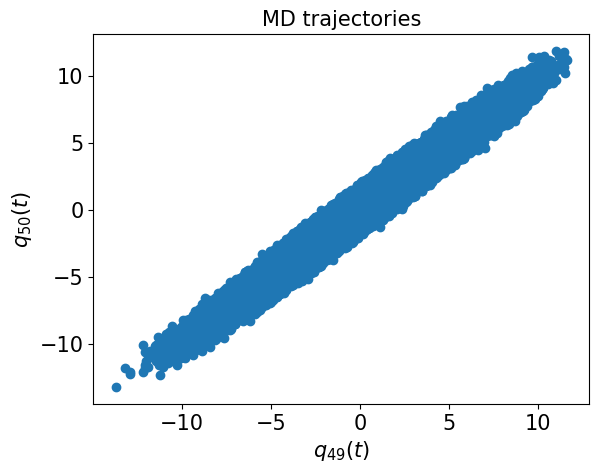

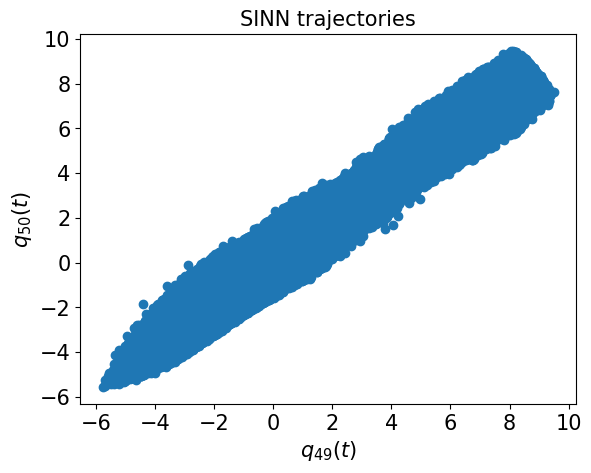

In [140]:
test6(model9)

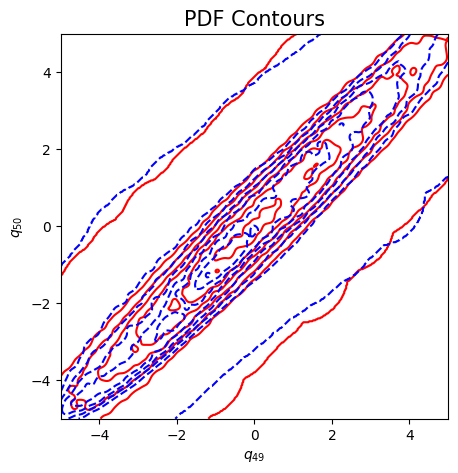

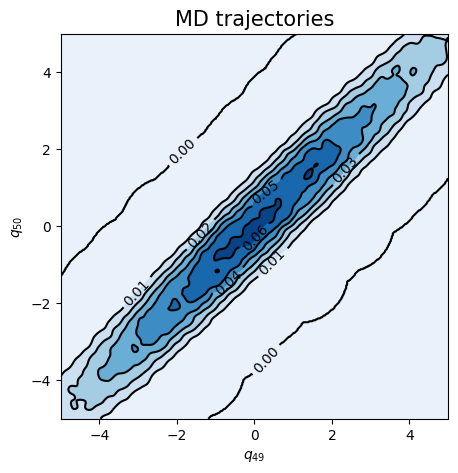

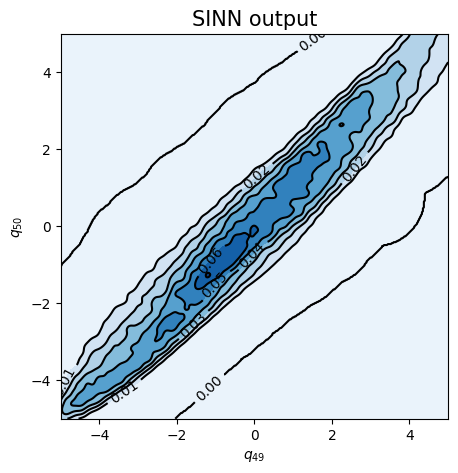

In [141]:
test7(model9)